<h1 style="border: 3px solid blue; border-radius: 2px; text-align: center; color: blue; font-size: 2.7em;">GOLD PRICE PREDICTION</h1>

### Importation des bibliothèques et des modules

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from datetime import datetime

### Chargement du jeu de données (dataset)

Vu que nous sommes dans une serie temporelle, on définira la colonne de la date comme la colonne d'index de notre dataframe (index_col="Date") et on indiquera à pandas que nous devons travailler avec des dates (parse_dates=True).

In [16]:
data = pd.read_csv("data/FINAL_USO.csv", index_col="Date", parse_dates=True)

### Copie du dataset

In [17]:
df = data.copy()

### Affichage des 5 premières lignes du dataset

In [18]:
pd.set_option('display.max_column',80) #pour afficher toutes les colonnes du dataframe

df.head() #pour afficher les 5 premières lignes 

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume,EU_Price,EU_open,EU_high,EU_low,EU_Trend,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,122.180000,105.441238,199109200,11825.29004,11967.83984,11825.21973,11868.80957,11868.80957,136930000,74.550003,76.150002,72.150002,72.900002,70.431755,787900,1.3018,1.2982,1.3051,1.2957,1,105.09,104.88,106.50,104.88,14330,1,93.42,94.91,96.00,93.33,0,53604,54248,54248,52316,119440,1,1.911,1.911,1.911,1.911,1,1414.65,1420.30,1423.35,1376.85,0,618.85,614.70,615.00,614.60,1,1425,80.341,80.565,80.630,80.130,22850,0,53.009998,53.139999,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,121.589996,105.597549,220481400,11870.25000,11968.17969,11819.30957,11866.38965,11866.38965,389520000,73.599998,75.099998,73.349998,74.900002,72.364037,896600,1.3035,1.3020,1.3087,1.2997,1,103.35,103.51,104.56,102.46,140080,0,93.79,93.43,94.80,92.53,1,53458,53650,54030,52890,65390,0,1.851,1.851,1.851,1.851,0,1420.25,1414.75,1431.75,1400.70,1,623.65,622.60,623.45,622.30,1,1400,80.249,80.175,80.395,79.935,13150,0,52.500000,53.180000,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,120.290001,104.468536,183903000,11866.54004,11925.87988,11735.19043,11766.25977,11766.25977,135170000,69.099998,69.800003,64.199997,64.699997,62.509384,2096700,1.2995,1.3043,1.3044,1.2981,0,103.64,103.63,104.57,102.37,147880,1,94.09,93.77,94.43,92.55,1,52961,53400,53400,52544,67280,0,1.810,1.810,1.810,1.810,0,1411.10,1422.65,1427.60,1404.60,0,608.80,626.00,630.00,608.60,0,1400,80.207,80.300,80.470,80.125,970,0,52.490002,52.549999,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,123.930000,107.629784,225418100,11769.20996,12117.12988,11768.83008,12103.58008,12103.58008,165180000,66.449997,68.099998,66.000000,67.000000,64.731514,875300,1.3079,1.3003,1.3133,1.2994,1,106.73,104.30,107.27,103.91,170240,1,95.55,96.39,99.70,96.39,1,53487,52795,53575,52595,55130,1,1.927,1.927,1.927,1.927,1,1434.75,1408.95,1436.55,1408.15,1,626.65,622.45,622.45,622.45,1,1400,80.273,80.890,80.940,80.035,22950,1,52.380001,53.250000,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,124.169998,107.838242,194230900,12103.58008,12119.70020,11999.44043,12107.74023,12107.74023,163250000,67.099998,69.400002,66.900002,68.500000,66.180725,837600,1.3045,1.3079,1.3197,1.3024,0,107.71,107.15,108.17,106.16,145090,1,99.01,97.54,99.26,96.81,1,53148,53519,54184,52937,75950,0,1.970,1.970,1.970,1.970,1,1429.05,1434.40,1453.75,1417.65,0,635.90,625.70,641.50,623.80,1,1400,80.350,80.105,80.445,79.550,24140,1,53.150002,53.430000,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000


### Vérification de l'index

Il faut vérifier si l'on travaillera bel et bien avec les dates en index dans la suite du travail.

In [19]:
df.index

DatetimeIndex(['2011-12-15', '2011-12-16', '2011-12-19', '2011-12-20',
               '2011-12-21', '2011-12-22', '2011-12-23', '2011-12-27',
               '2011-12-28', '2011-12-29',
               ...
               '2018-12-17', '2018-12-18', '2018-12-19', '2018-12-20',
               '2018-12-21', '2018-12-24', '2018-12-26', '2018-12-27',
               '2018-12-28', '2018-12-31'],
              dtype='datetime64[ns]', name='Date', length=1718, freq=None)

### Informations sur le dataframe df

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1718 entries, 2011-12-15 to 2018-12-31
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Open           1718 non-null   float64
 1   High           1718 non-null   float64
 2   Low            1718 non-null   float64
 3   Close          1718 non-null   float64
 4   Adj Close      1718 non-null   float64
 5   Volume         1718 non-null   int64  
 6   SP_open        1718 non-null   float64
 7   SP_high        1718 non-null   float64
 8   SP_low         1718 non-null   float64
 9   SP_close       1718 non-null   float64
 10  SP_Ajclose     1718 non-null   float64
 11  SP_volume      1718 non-null   int64  
 12  DJ_open        1718 non-null   float64
 13  DJ_high        1718 non-null   float64
 14  DJ_low         1718 non-null   float64
 15  DJ_close       1718 non-null   float64
 16  DJ_Ajclose     1718 non-null   float64
 17  DJ_volume      1718 non-null   int

### Variables d'ingénierie de caractéristiques

In [21]:
#Indice S&P 500

ind_SP_500 = ['SP_open','SP_high','SP_low','SP_close','SP_Ajclose','SP_volume']
df_SP_500 = df[ind_SP_500]
df_SP_500.head()

,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume
Date,,,,,,
2011-12-15,123.029999,123.199997,121.989998,122.180000,105.441238,199109200
2011-12-16,122.230003,122.949997,121.300003,121.589996,105.597549,220481400
2011-12-19,122.059998,122.320000,120.029999,120.290001,104.468536,183903000
2011-12-20,122.180000,124.139999,120.370003,123.930000,107.629784,225418100
2011-12-21,123.930000,124.360001,122.750000,124.169998,107.838242,194230900


In [22]:
#Indice Dow Jones

ind_Dow_Jones = ['DJ_open', 'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume']
df_Dow_Jones = df[ind_Dow_Jones]
df_Dow_Jones.head()

,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume
Date,,,,,,
2011-12-15,11825.29004,11967.83984,11825.21973,11868.80957,11868.80957,136930000
2011-12-16,11870.25000,11968.17969,11819.30957,11866.38965,11866.38965,389520000
2011-12-19,11866.54004,11925.87988,11735.19043,11766.25977,11766.25977,135170000
2011-12-20,11769.20996,12117.12988,11768.83008,12103.58008,12103.58008,165180000
2011-12-21,12103.58008,12119.70020,11999.44043,12107.74023,12107.74023,163250000


In [23]:
#Eldorado Gold Corporation (EGO)

EGO = ['EG_open', 'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume']
df_EGO = df[EGO]
df_EGO.head()

,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume
Date,,,,,,
2011-12-15,74.550003,76.150002,72.150002,72.900002,70.431755,787900
2011-12-16,73.599998,75.099998,73.349998,74.900002,72.364037,896600
2011-12-19,69.099998,69.800003,64.199997,64.699997,62.509384,2096700
2011-12-20,66.449997,68.099998,66.000000,67.000000,64.731514,875300
2011-12-21,67.099998,69.400002,66.900002,68.500000,66.180725,837600


In [24]:
#Taux de change EUR-USD

eur_usd = ['EU_Price', 'EU_open', 'EU_high', 'EU_low', 'EU_Trend']
df_eur_usd = df[eur_usd]
df_eur_usd.head()

,EU_Price,EU_open,EU_high,EU_low,EU_Trend
Date,,,,,
2011-12-15,1.3018,1.2982,1.3051,1.2957,1
2011-12-16,1.3035,1.3020,1.3087,1.2997,1
2011-12-19,1.2995,1.3043,1.3044,1.2981,0
2011-12-20,1.3079,1.3003,1.3133,1.2994,1
2011-12-21,1.3045,1.3079,1.3197,1.3024,0


In [25]:
#Contrats à terme sur le pétrole brut Brend

petrol_brend = ['OF_Price','OF_Open', 'OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend']
df_petrol_brend = df[petrol_brend]
df_petrol_brend.head()

,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend
Date,,,,,,
2011-12-15,105.09,104.88,106.50,104.88,14330,1
2011-12-16,103.35,103.51,104.56,102.46,140080,0
2011-12-19,103.64,103.63,104.57,102.37,147880,1
2011-12-20,106.73,104.30,107.27,103.91,170240,1
2011-12-21,107.71,107.15,108.17,106.16,145090,1


In [26]:
#pétrole brut WTI USD

petrol_WTI_USD = ['OS_Price','OS_Open', 'OS_High', 'OS_Low', 'OS_Trend']
df_petrol_WTI_USD = df[petrol_WTI_USD]
df_petrol_WTI_USD.head()

,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend
Date,,,,,
2011-12-15,93.42,94.91,96.00,93.33,0
2011-12-16,93.79,93.43,94.80,92.53,1
2011-12-19,94.09,93.77,94.43,92.55,1
2011-12-20,95.55,96.39,99.70,96.39,1
2011-12-21,99.01,97.54,99.26,96.81,1


In [27]:
#silver futures

silver_futures = ['SF_Price','SF_Open','SF_High','SF_Low','SF_Volume','SF_Trend']
df_silver_futures = df[silver_futures]
df_silver_futures.head()

,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend
Date,,,,,,
2011-12-15,53604,54248,54248,52316,119440,1
2011-12-16,53458,53650,54030,52890,65390,0
2011-12-19,52961,53400,53400,52544,67280,0
2011-12-20,53487,52795,53575,52595,55130,1
2011-12-21,53148,53519,54184,52937,75950,0


In [28]:
#Taux des obligations américaines

US_obligations = ['USB_Price','USB_Open','USB_High','USB_Low','USB_Trend']
df_US_obligations = df[US_obligations]
df_US_obligations.head()

,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend
Date,,,,,
2011-12-15,1.911,1.911,1.911,1.911,1
2011-12-16,1.851,1.851,1.851,1.851,0
2011-12-19,1.810,1.810,1.810,1.810,0
2011-12-20,1.927,1.927,1.927,1.927,1
2011-12-21,1.970,1.970,1.970,1.970,1


In [29]:
#Prix du platine

platine = ['PLT_Price','PLT_Open','PLT_High','PLT_Low','PLT_Trend']
df_platine = df[platine]
df_platine.head()

,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend
Date,,,,,
2011-12-15,1414.65,1420.30,1423.35,1376.85,0
2011-12-16,1420.25,1414.75,1431.75,1400.70,1
2011-12-19,1411.10,1422.65,1427.60,1404.60,0
2011-12-20,1434.75,1408.95,1436.55,1408.15,1
2011-12-21,1429.05,1434.40,1453.75,1417.65,0


In [30]:
#Prix du palladium et rhopice

palladium = ['PLD_Price','PLD_Open','PLD_High','PLD_Low','PLD_Trend','RHO_PRICE']
df_palladium = df[palladium]
df_palladium.head()

,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE
Date,,,,,,
2011-12-15,618.85,614.70,615.00,614.60,1,1425
2011-12-16,623.65,622.60,623.45,622.30,1,1400
2011-12-19,608.80,626.00,630.00,608.60,0,1400
2011-12-20,626.65,622.45,622.45,622.45,1,1400
2011-12-21,635.90,625.70,641.50,623.80,1,1400


In [31]:
#Prix de l'indice du dollar américain

ind_US_price = ['USDI_Price','USDI_Open','USDI_High','USDI_Low','USDI_Volume','USDI_Trend']
df_US_price = df[ind_US_price]
df_US_price.head()

,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend
Date,,,,,,
2011-12-15,80.341,80.565,80.630,80.130,22850,0
2011-12-16,80.249,80.175,80.395,79.935,13150,0
2011-12-19,80.207,80.300,80.470,80.125,970,0
2011-12-20,80.273,80.890,80.940,80.035,22950,1
2011-12-21,80.350,80.105,80.445,79.550,24140,1


In [32]:
df['USDI_Trend'].value_counts()

1    881
0    837
Name: USDI_Trend, dtype: int64

In [33]:
#ETF Gold Miners

ETF_gold = ['GDX_Open','GDX_High','GDX_Low','GDX_Close','GDX_Adj Close','GDX_Volume']
df_ETF_gold = df[ETF_gold]
df_ETF_gold.head()

,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume
Date,,,,,,
2011-12-15,53.009998,53.139999,51.570000,51.680000,48.973877,20605600
2011-12-16,52.500000,53.180000,52.040001,52.680000,49.921513,16285400
2011-12-19,52.490002,52.549999,51.029999,51.169998,48.490578,15120200
2011-12-20,52.380001,53.250000,52.369999,52.990002,50.215282,11644900
2011-12-21,53.150002,53.430000,52.419998,52.959999,50.186852,8724300


In [34]:
#ETF pétrolier USO

ETF_petrolier = ['USO_Open','USO_High','USO_Low','USO_Close','USO_Adj Close','USO_Volume']
df_ETF_petrolier = df[ETF_petrolier]
df_ETF_petrolier.head()

,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,
2011-12-15,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,37.669998,38.240002,37.520000,38.110001,38.110001,10728000


In [35]:
#Données extraites de GOLD ETF (Yahoo finance)

gold_etf = ['Open','High','Low','Close','Adj Close','Volume']
df_gold_etf = df[gold_etf]
df_gold_etf.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100


# 1. ANALYSE EXPLORATOIRE 

Rapport des analyses effectuées



### a. Identification de la target

La variable cible (target) de notre étude est <b style ="color: red;">"Adj Close"</b>. L'une des données de GOLD ETF extrait de Yahoo finance.

### b. Taille du dataset (nombres de lignes et de colonnes)

In [36]:
df.shape

(1718, 80)

Le dataset contient <b style ="color: red;">1718 lignes</b> et <b style ="color: red;">80 colonnes</b>. 
<br>(Nous avons 81 colonnes en réalité dans le jeu de données, mais vu que la colonne "Date" a été choisie comme l'index de notre dataframe, alors il ne restera que 80 colonnes)

### c) Identification des valeurs manquantes

Il faut calculer le pourcentage de valeurs manquantes et faire un affichage par ordre décroissant.

In [37]:
(df.isna().sum()/df.shape[0]).sort_values()

Open             0.0
PLD_Open         0.0
PLD_Price        0.0
PLT_Trend        0.0
PLT_Low          0.0
                ... 
EG_volume        0.0
EG_Ajclose       0.0
EG_close         0.0
USO_Adj Close    0.0
USO_Volume       0.0
Length: 80, dtype: float64

Il y a <b style ="color: red;">0 valeurs manquantes</b>.

### d) Types de variables 

##### Nombre de variables par type

In [38]:
df.dtypes.value_counts()

float64    58
int64      22
dtype: int64

##### Indentification des variables du type "float64"

In [72]:
df.select_dtypes(include = 'float64').columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'SP_open', 'SP_high',
       'SP_low', 'SP_close', 'SP_Ajclose', 'DJ_open', 'DJ_high', 'DJ_low',
       'DJ_close', 'DJ_Ajclose', 'EG_open', 'EG_high', 'EG_low', 'EG_close',
       'EG_Ajclose', 'EU_Price', 'EU_open', 'EU_high', 'EU_low', 'OF_Price',
       'OF_Open', 'OF_High', 'OF_Low', 'OS_Price', 'OS_Open', 'OS_High',
       'OS_Low', 'USB_Price', 'USB_Open', 'USB_High', 'USB_Low', 'PLT_Price',
       'PLT_Open', 'PLT_High', 'PLT_Low', 'PLD_Price', 'PLD_Open', 'PLD_High',
       'PLD_Low', 'USDI_Price', 'USDI_Open', 'USDI_High', 'USDI_Low',
       'GDX_Open', 'GDX_High', 'GDX_Low', 'GDX_Close', 'GDX_Adj Close',
       'USO_Open', 'USO_High', 'USO_Low', 'USO_Close', 'USO_Adj Close'],
      dtype='object')

##### Indentification des variables du type "int64"

In [71]:
df.select_dtypes(include = 'int64').columns

Index(['Volume', 'SP_volume', 'DJ_volume', 'EG_volume', 'EU_Trend',
       'OF_Volume', 'OF_Trend', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High',
       'SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Trend', 'PLT_Trend',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Volume', 'USDI_Trend', 'GDX_Volume',
       'USO_Volume'],
      dtype='object')

##### Détermination du type de la variable "Date"

In [77]:
df.index

DatetimeIndex(['2011-12-15', '2011-12-16', '2011-12-19', '2011-12-20',
               '2011-12-21', '2011-12-22', '2011-12-23', '2011-12-27',
               '2011-12-28', '2011-12-29',
               ...
               '2018-12-17', '2018-12-18', '2018-12-19', '2018-12-20',
               '2018-12-21', '2018-12-24', '2018-12-26', '2018-12-27',
               '2018-12-28', '2018-12-31'],
              dtype='datetime64[ns]', name='Date', length=1718, freq=None)

Le dataset ne possède que des variables quantitatives dont <b style ="color: red;">58 variables du type FLOAT64</b> et <b style ="color: red;">22 variables du type INT64</b>.
<br>
Seule la variable "Date" qui est l'index du dataframe est du type <b><em>Datetime</em></b>
<b style ="color: red;"></b>

### e) Visualisation de la variable cible 'Adj Close' (target)

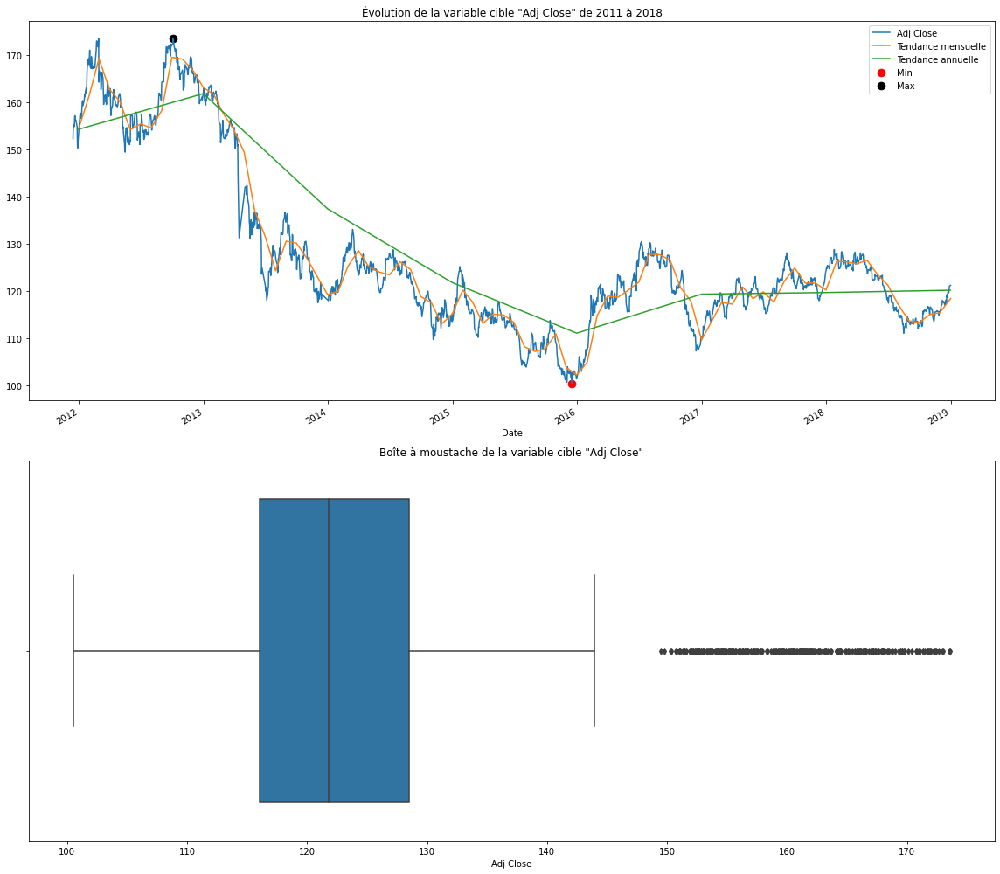

In [107]:
#Évolution de la variable cible
plt.subplot(211)
plt.title('Évolution de la variable cible "Adj Close" de 2011 à 2018')
df['Adj Close'].plot(figsize = (16,14))

#Affichage des tendances mensuelles et annuelles
plt.plot(df['Adj Close'].resample('M').mean(), label='Tendance mensuelle') 
plt.plot(df['Adj Close'].resample('Y').mean(), label='Tendance annuelle')

#Affichage du maximum et du minimum
plt.scatter(df['Adj Close'].idxmin(), df['Adj Close'].min(), marker='.', c='r', s=300, label="Min")
plt.scatter(df['Adj Close'].idxmax(), df['Adj Close'].max(), marker='.', c='black', s=300, label="Max") 
plt.legend()

#Boîte à moustache de la variable cible
plt.subplot(212)
plt.title('Boîte à moustache de la variable cible "Adj Close"')
sns.boxplot(data = df, x = 'Adj Close')

plt.tight_layout()
plt.show()

In [111]:
print(f"Le coût minimal de l'or de 2011 à 2018 est: ${df['Adj Close'].min()}\n Jour: {df['Adj Close'].idxmin()}\n\n")
print(f"Le coût maximal de l'or de 2011 à 2018 est: ${df['Adj Close'].max()}\n Jour: {df['Adj Close'].idxmax()}")

Le coût minimal de l'or de 2011 à 2018 est: $100.5
 Jour: 2015-12-17 00:00:00


Le coût maximal de l'or de 2011 à 2018 est: $173.610001
 Jour: 2012-10-04 00:00:00


In [79]:
#Même affichage avec possibilité de zoom sur le graphique
px.line(df, x = df.index, y = 'Adj Close')

### f) Compréhension des différentes variables

In [83]:
#liste de toutes les variables (hormis la variable cible "Adj Close") 
features_list = ['Open','High','Low','Close', 'Volume', 'SP_open','SP_high', 'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume', 'DJ_open','DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume', 'EG_open','EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume', 'EU_Price','EU_open', 'EU_high', 'EU_low', 'EU_Trend', 'OF_Price', 'OF_Open','OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend', 'OS_Price', 'OS_Open','OS_High', 'OS_Low', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High','SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Price', 'USB_Open', 'USB_High','USB_Low', 'USB_Trend', 'PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low','PLT_Trend', 'PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low','PLD_Trend', 'RHO_PRICE', 'USDI_Price', 'USDI_Open', 'USDI_High','USDI_Low', 'USDI_Volume', 'USDI_Trend', 'GDX_Open', 'GDX_High','GDX_Low', 'GDX_Close', 'GDX_Adj Close', 'GDX_Volume', 'USO_Open','USO_High', 'USO_Low', 'USO_Close', 'USO_Adj Close', 'USO_Volume']
len(features_list)

79

In [84]:
#Liste des variables quantitatives continues
features_list_quanti = ['Open','High','Low','Close','Volume','SP_open','SP_high','SP_low','SP_close','SP_Ajclose','SP_volume','DJ_open','DJ_high','DJ_low','DJ_close','DJ_Ajclose','DJ_volume','EG_open','EG_high','EG_low','EG_close','EG_Ajclose','EG_volume','EU_Price','EU_open','EU_high','EU_low','OF_Price', 'OF_Open','OF_High','OF_Low','OF_Volume','OS_Price','OS_Open','OS_High','OS_Low','SF_Price','SF_Open', 'SF_High','SF_Low', 'SF_Volume','USB_Price','USB_Open','USB_High','USB_Low','PLT_Price','PLT_Open','PLT_High','PLT_Low','PLD_Price','PLD_Open','PLD_High','PLD_Low','RHO_PRICE','USDI_Price','USDI_Open','USDI_High','USDI_Low','USDI_Volume','GDX_Open','GDX_High','GDX_Low','GDX_Close','GDX_Adj Close','GDX_Volume','USO_Open','USO_High','USO_Low','USO_Close','USO_Adj Close','USO_Volume']
len(features_list_quanti)

71

##### Étude de chaque variable quantitative continue

Pour chacune de ces variables, la courbe et la boîte à moustache nous aideront à mieux les comprendre.

ÉTUDE DE LA VARIABLE "Open"


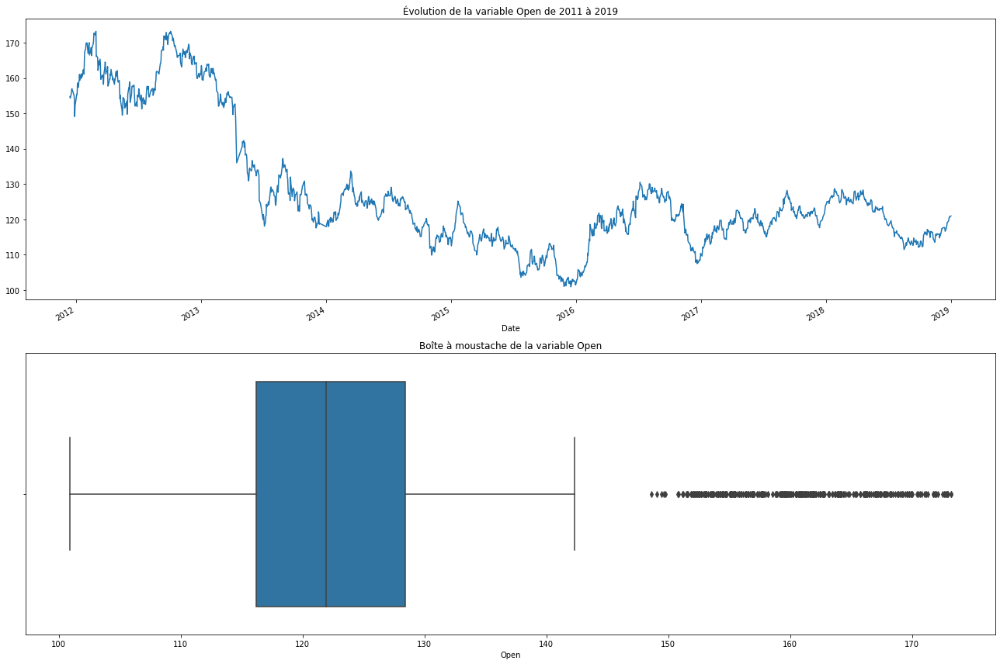

ÉTUDE DE LA VARIABLE "High"


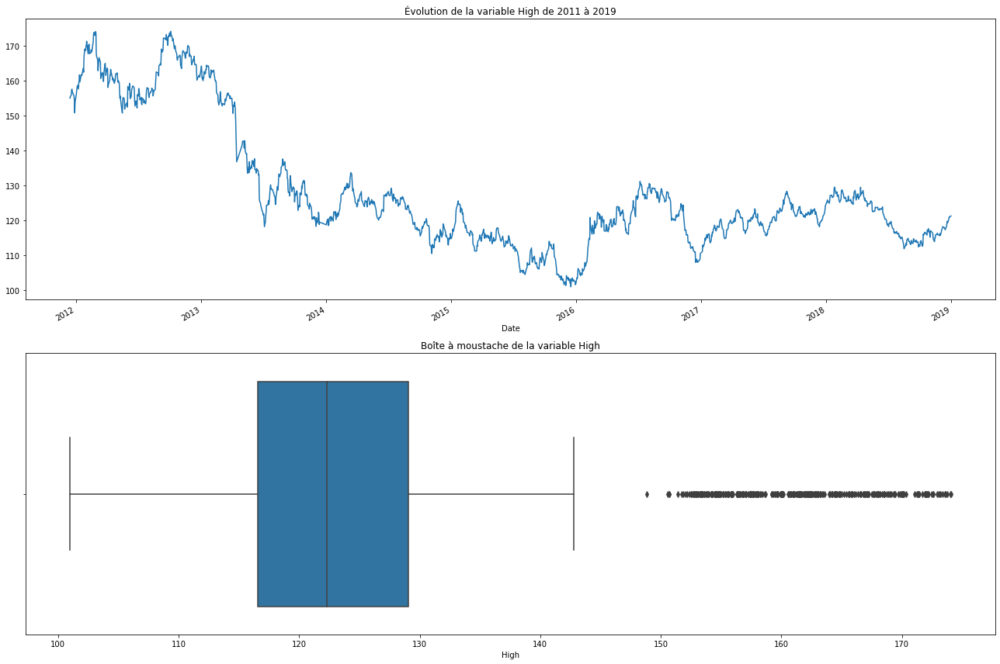

ÉTUDE DE LA VARIABLE "Low"


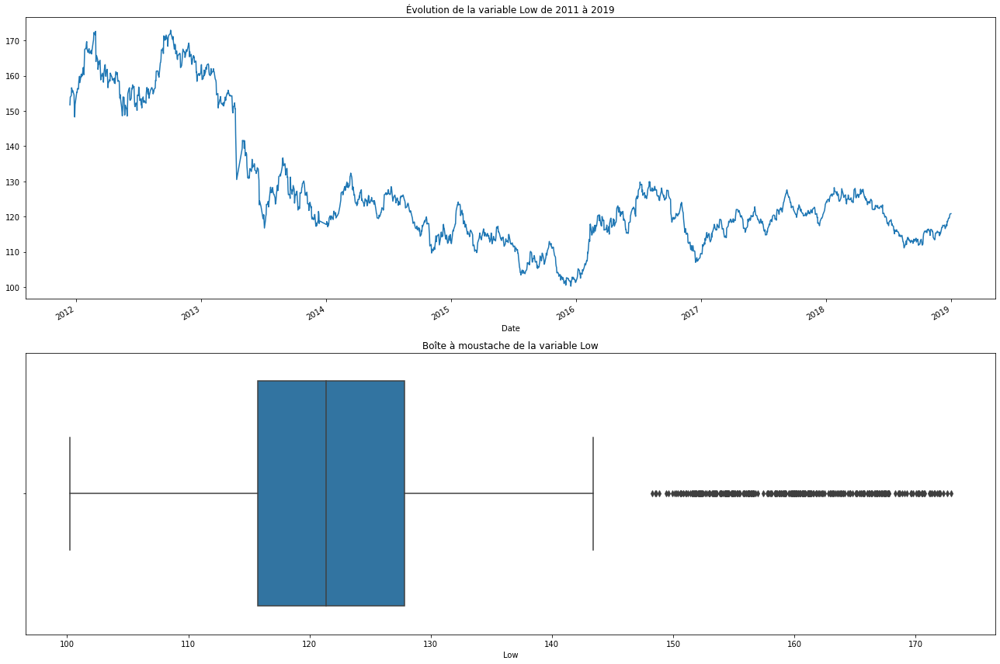

ÉTUDE DE LA VARIABLE "Close"


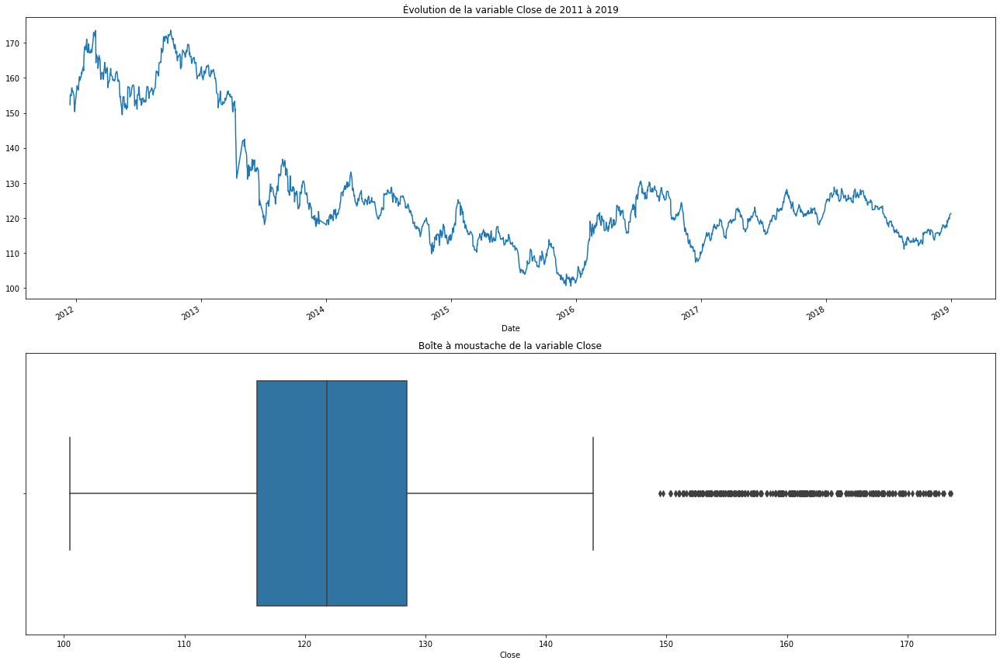

ÉTUDE DE LA VARIABLE "Volume"


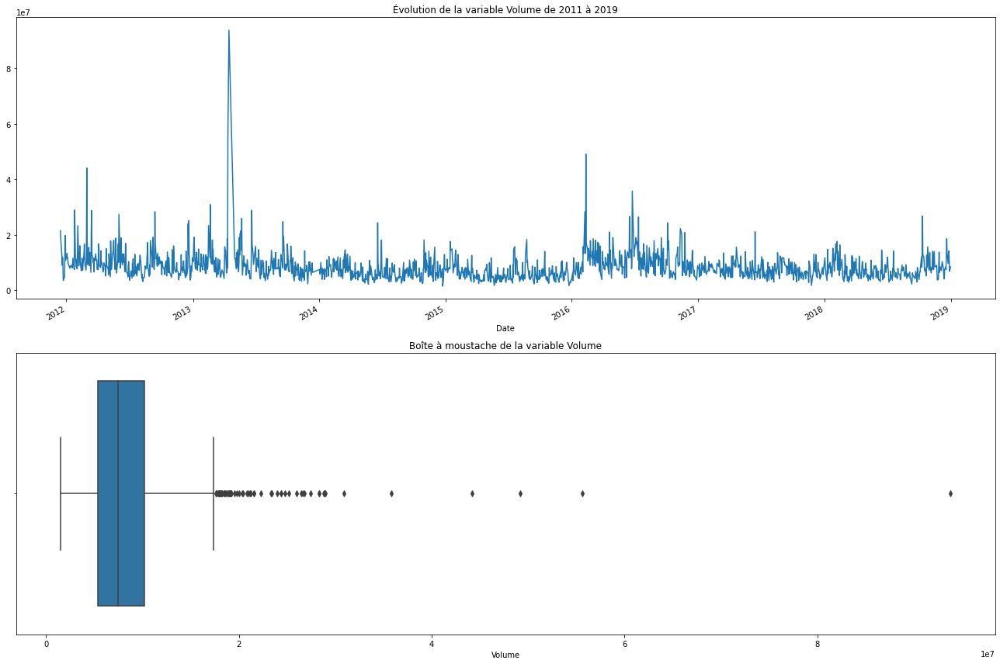

ÉTUDE DE LA VARIABLE "SP_open"


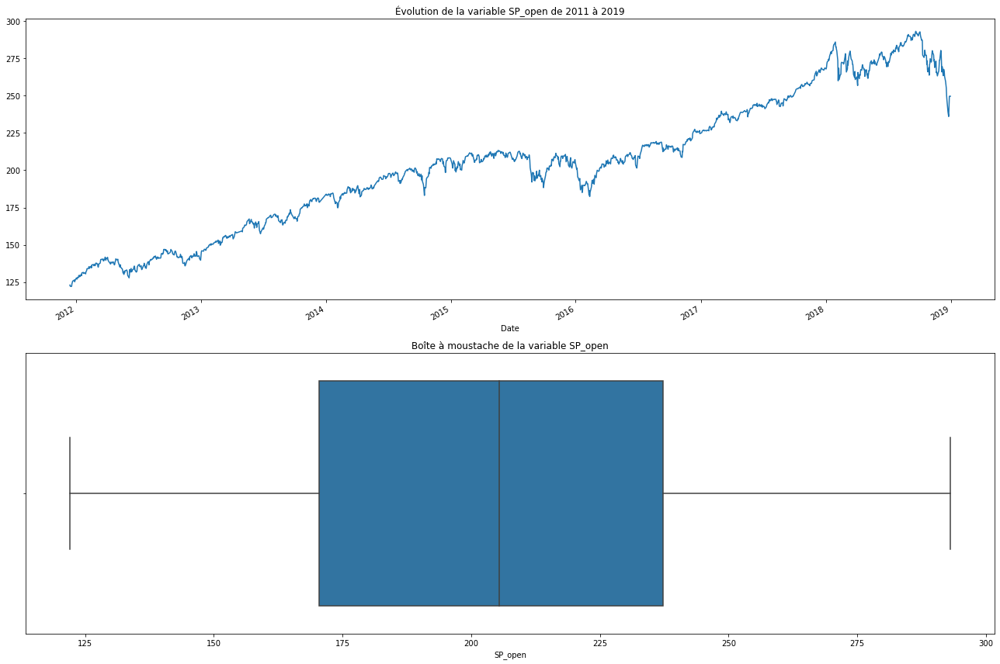

ÉTUDE DE LA VARIABLE "SP_high"


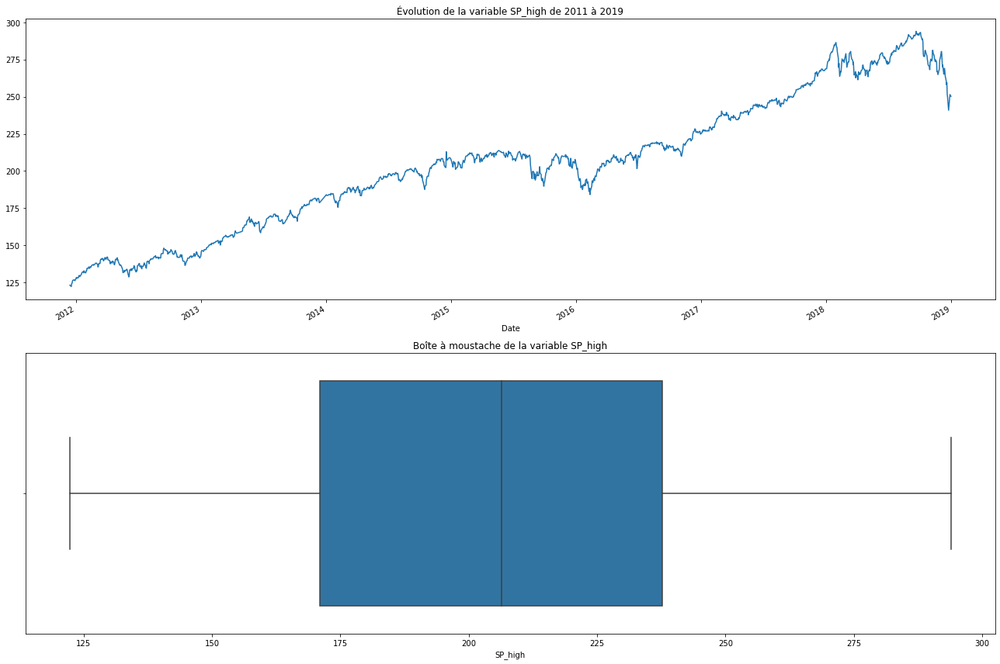

ÉTUDE DE LA VARIABLE "SP_low"


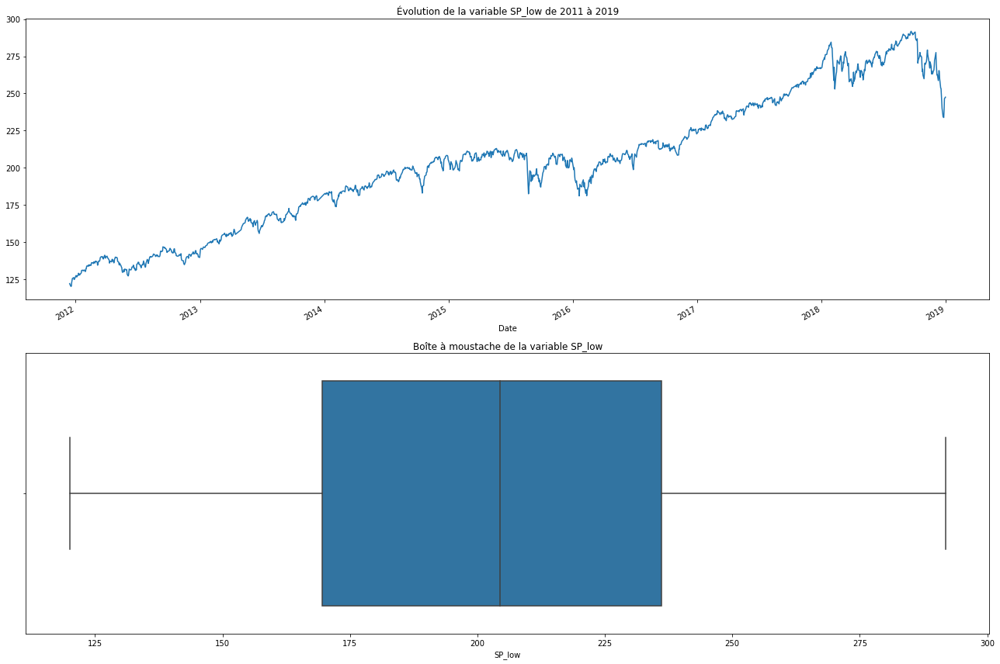

ÉTUDE DE LA VARIABLE "SP_close"


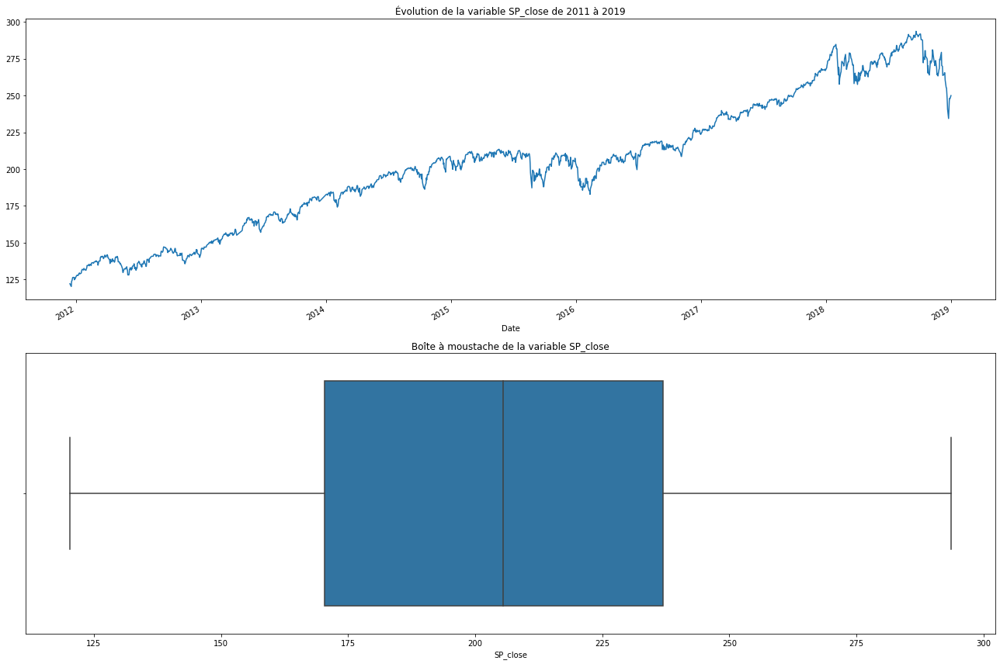

ÉTUDE DE LA VARIABLE "SP_Ajclose"


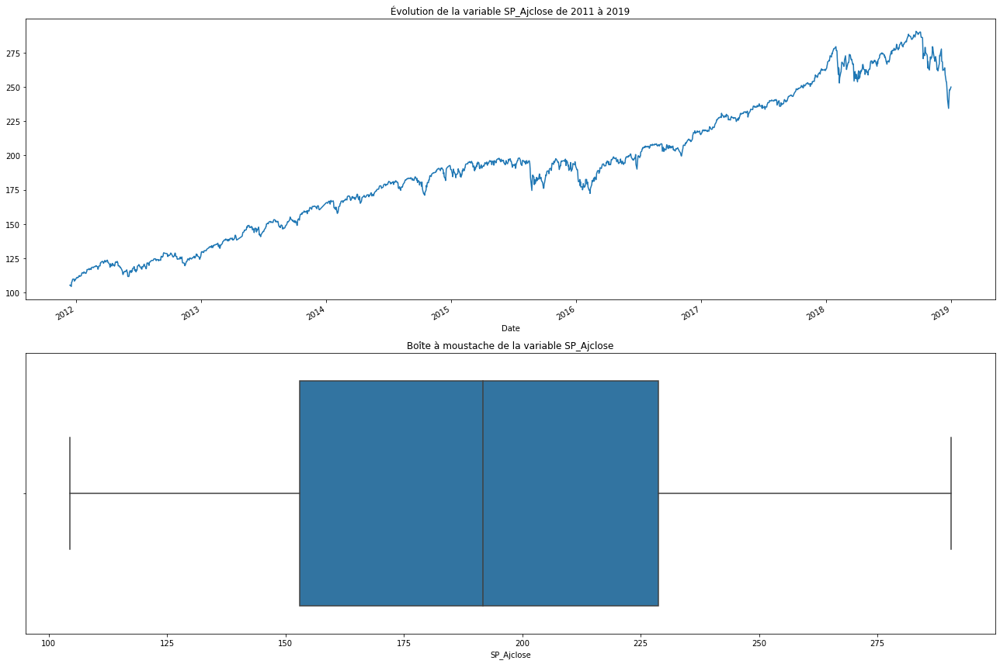

ÉTUDE DE LA VARIABLE "SP_volume"


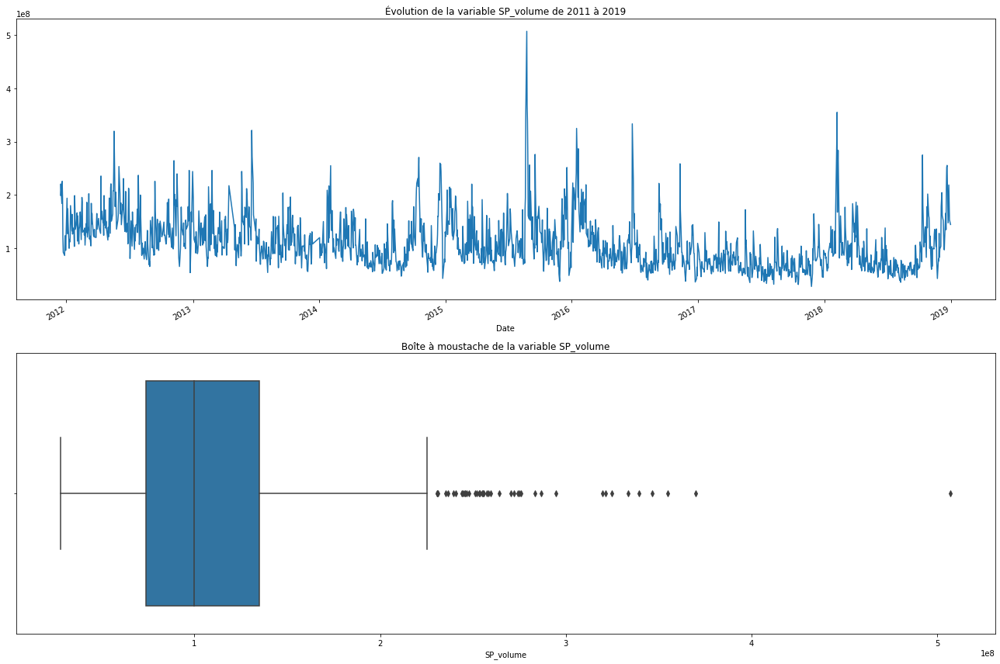

ÉTUDE DE LA VARIABLE "DJ_open"


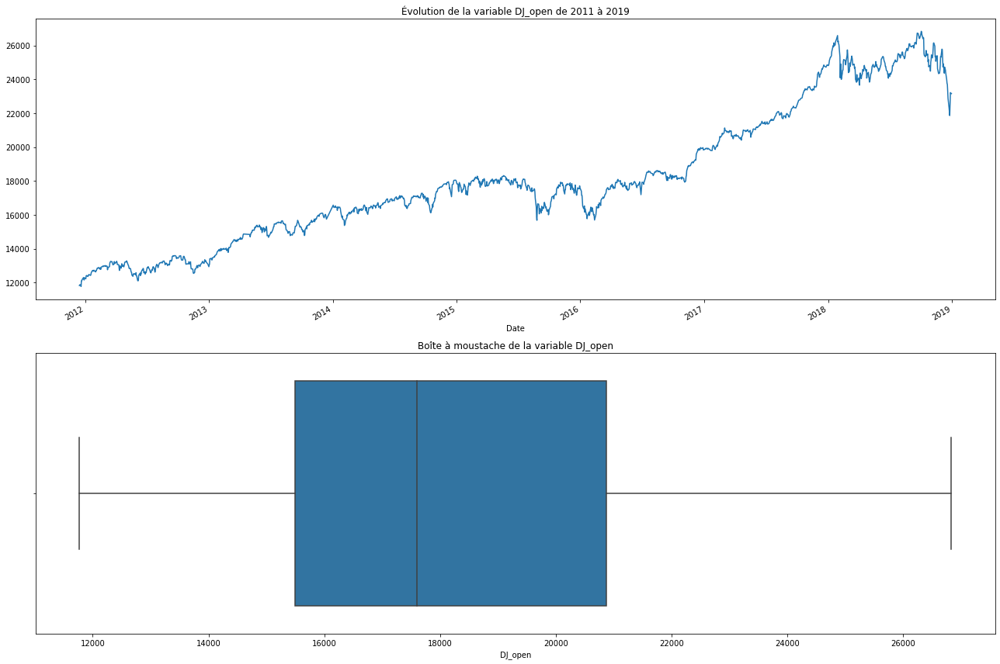

ÉTUDE DE LA VARIABLE "DJ_high"


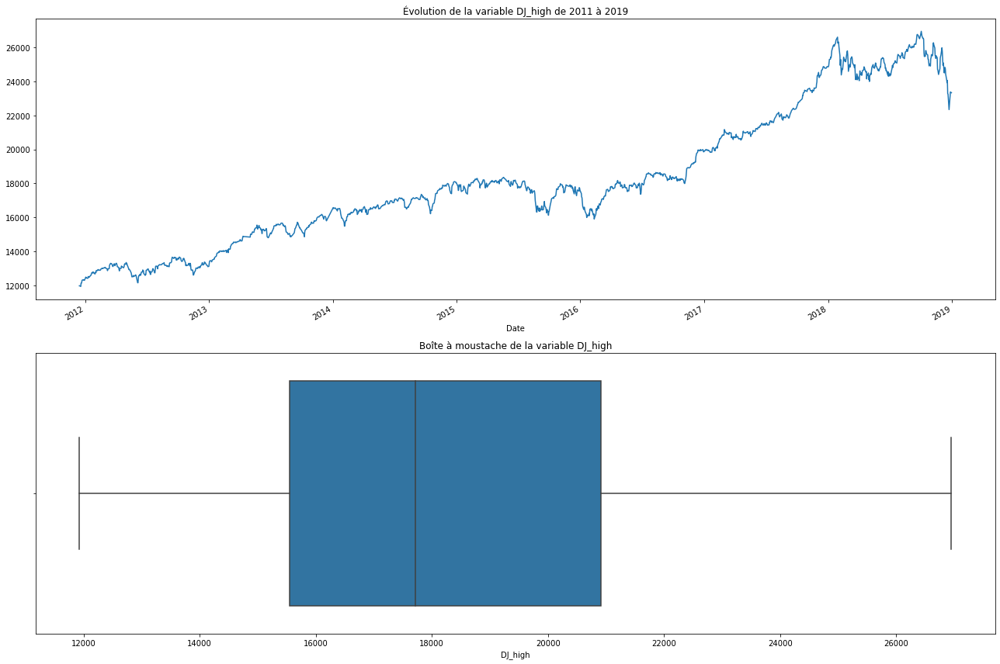

ÉTUDE DE LA VARIABLE "DJ_low"


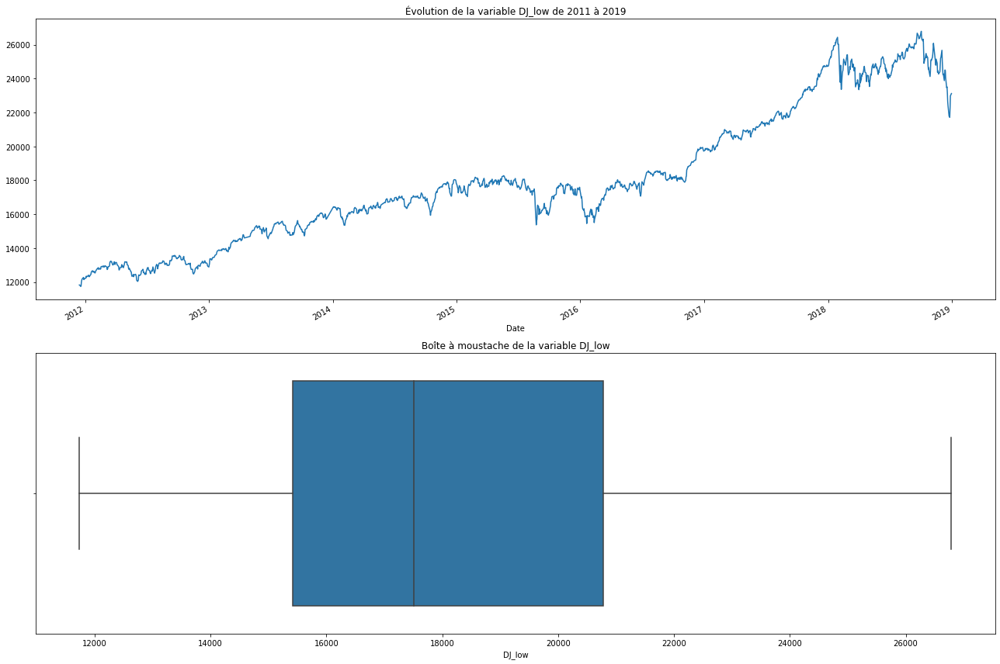

ÉTUDE DE LA VARIABLE "DJ_close"


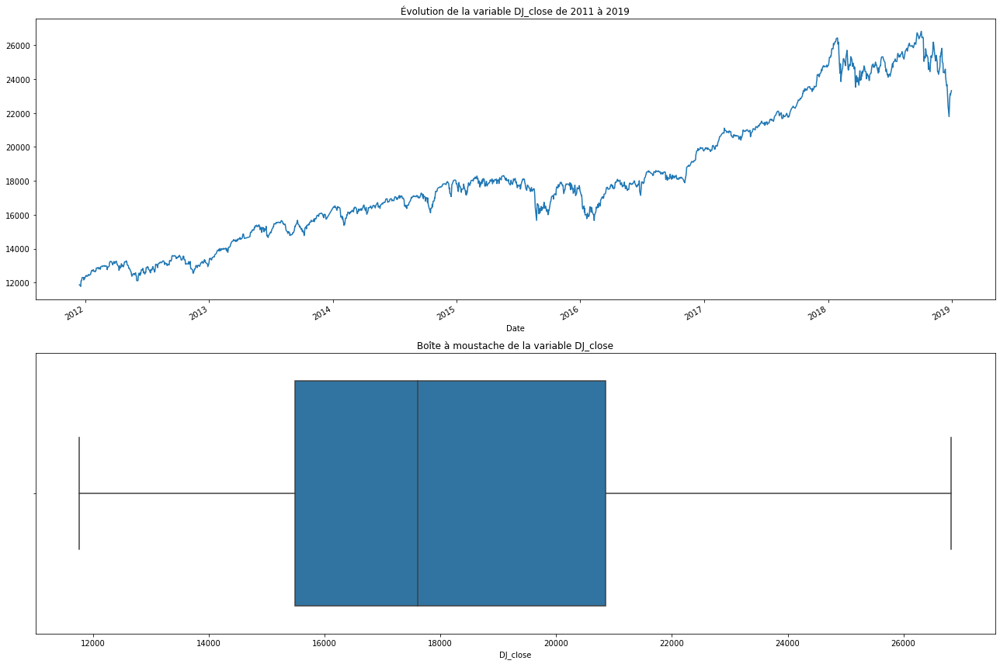

ÉTUDE DE LA VARIABLE "DJ_Ajclose"


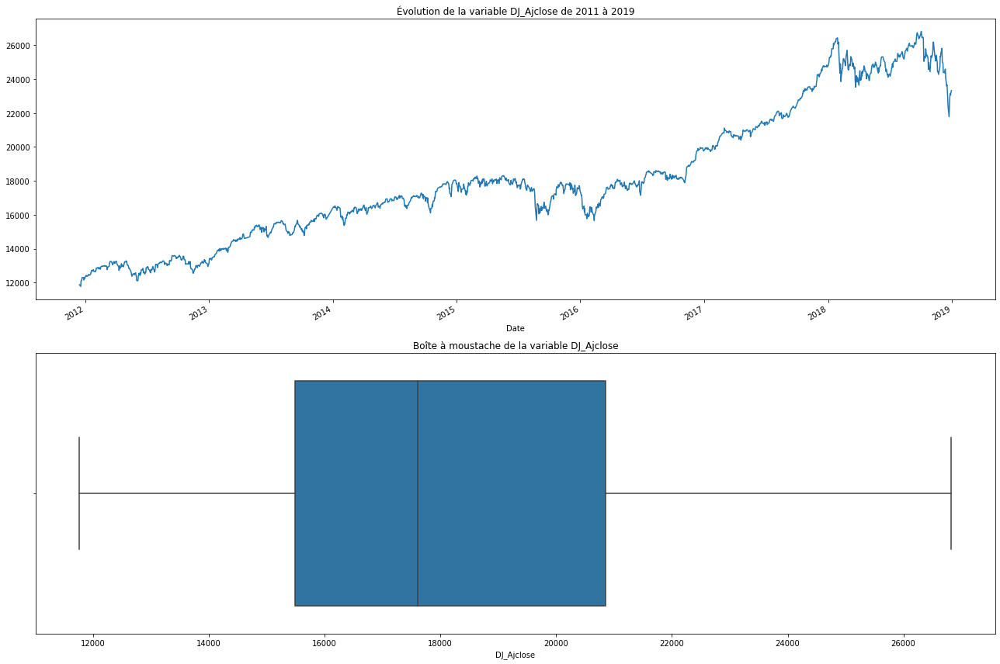

ÉTUDE DE LA VARIABLE "DJ_volume"


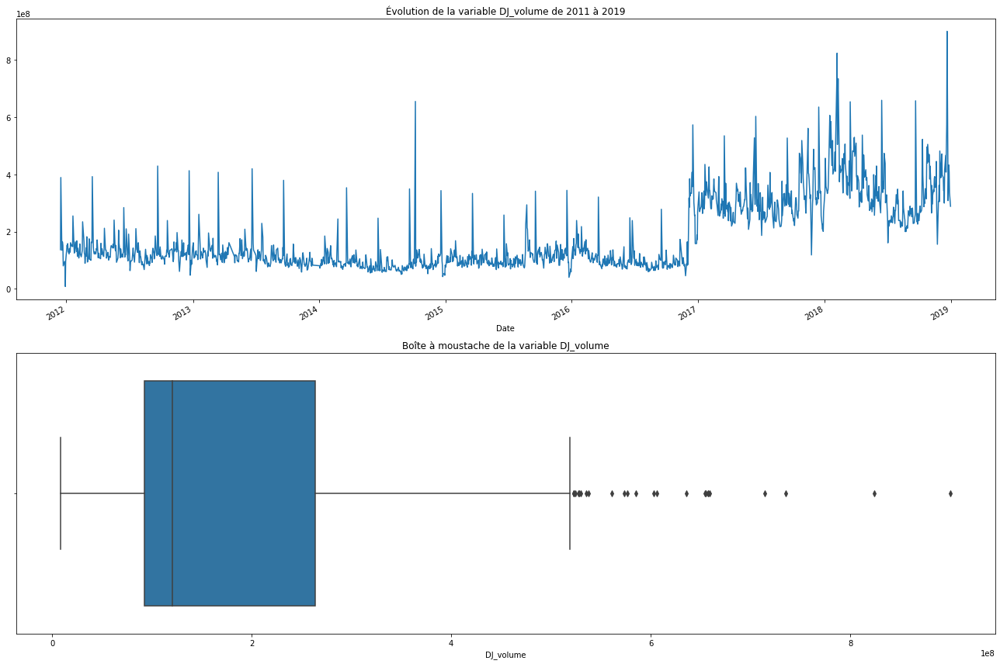

ÉTUDE DE LA VARIABLE "EG_open"


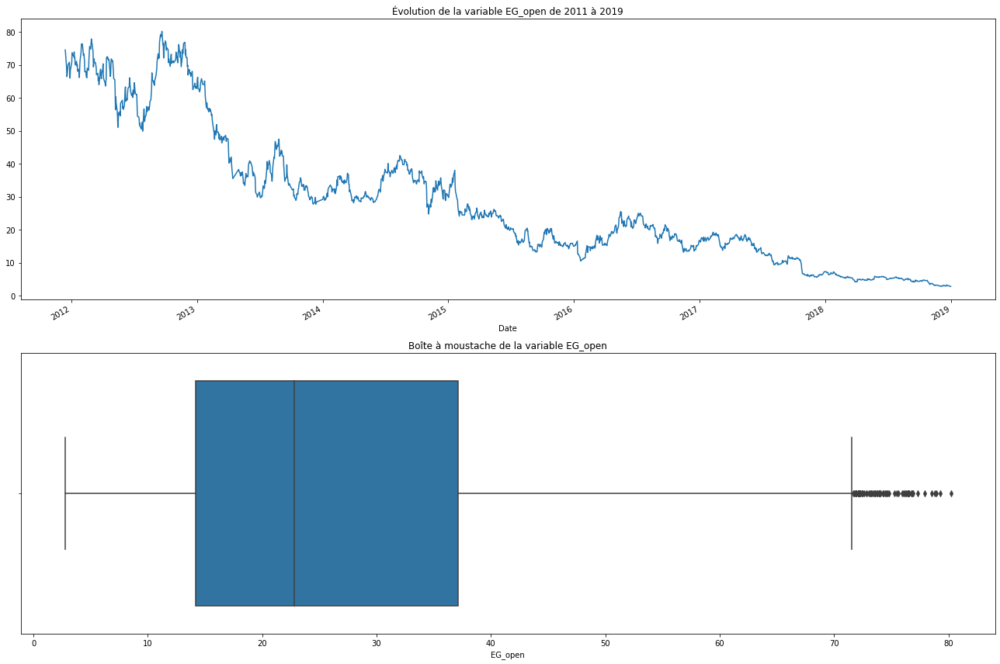

ÉTUDE DE LA VARIABLE "EG_high"


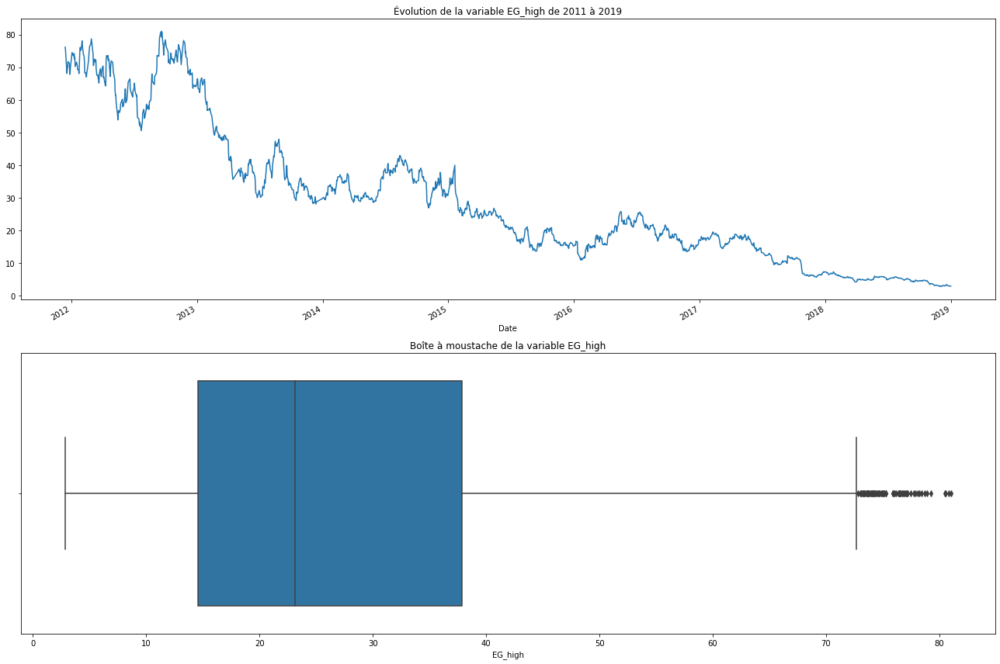

ÉTUDE DE LA VARIABLE "EG_low"


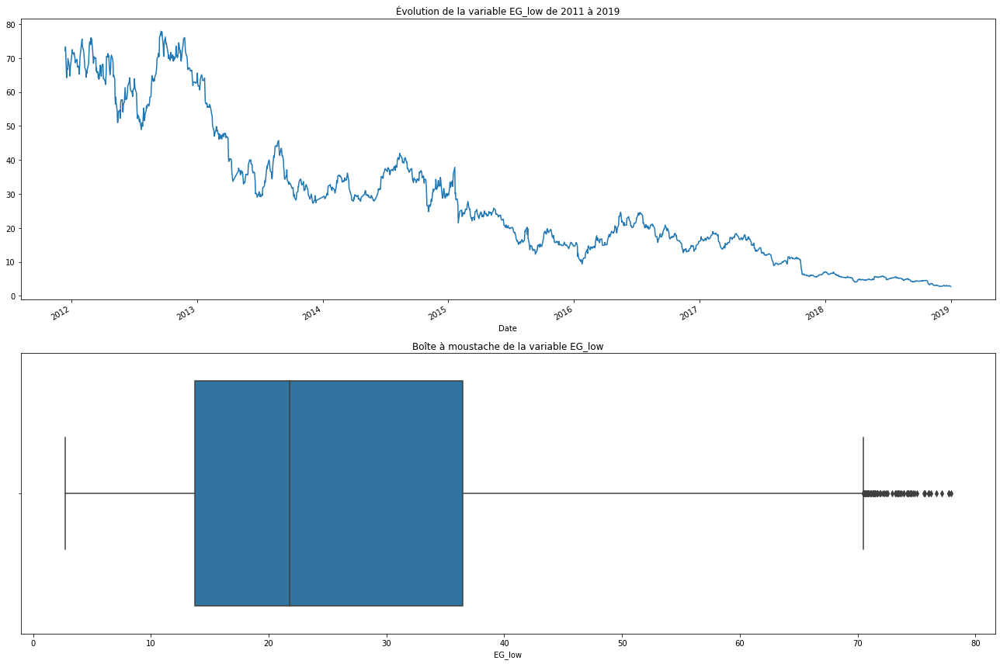

ÉTUDE DE LA VARIABLE "EG_close"


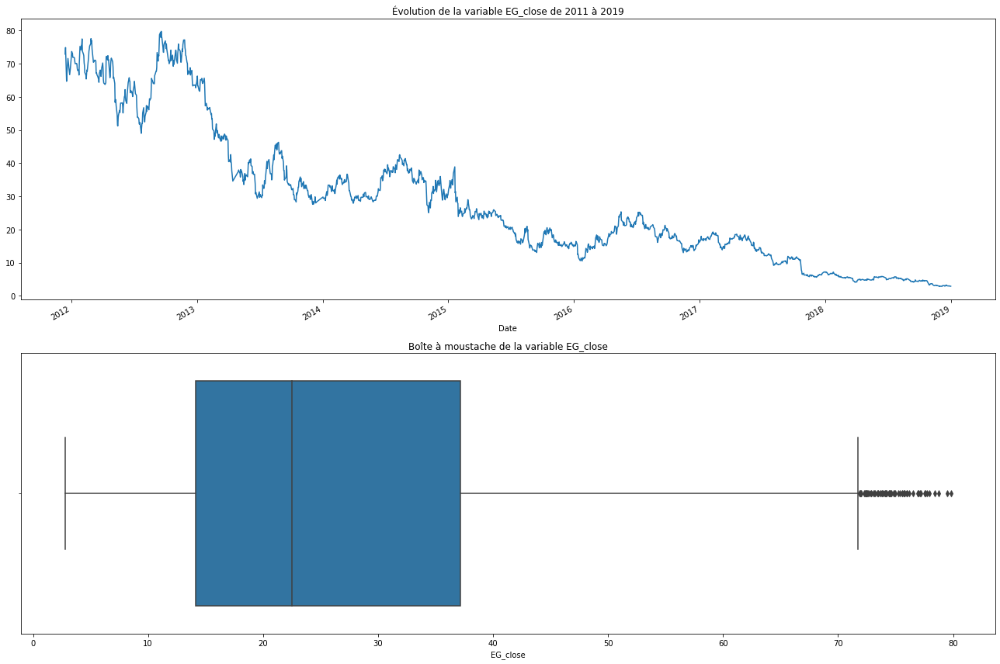

ÉTUDE DE LA VARIABLE "EG_Ajclose"


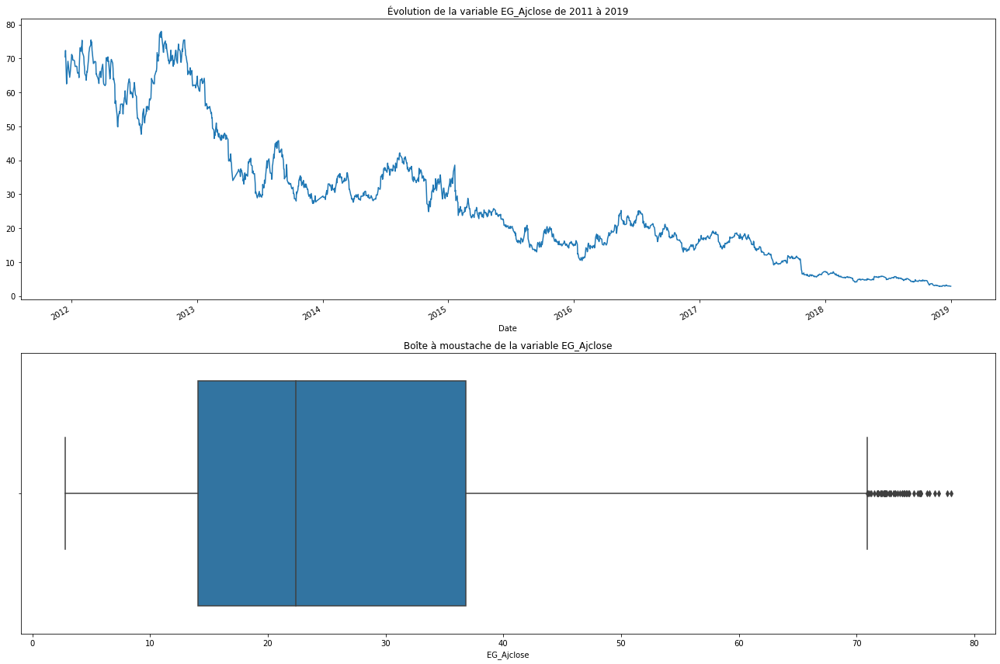

ÉTUDE DE LA VARIABLE "EG_volume"


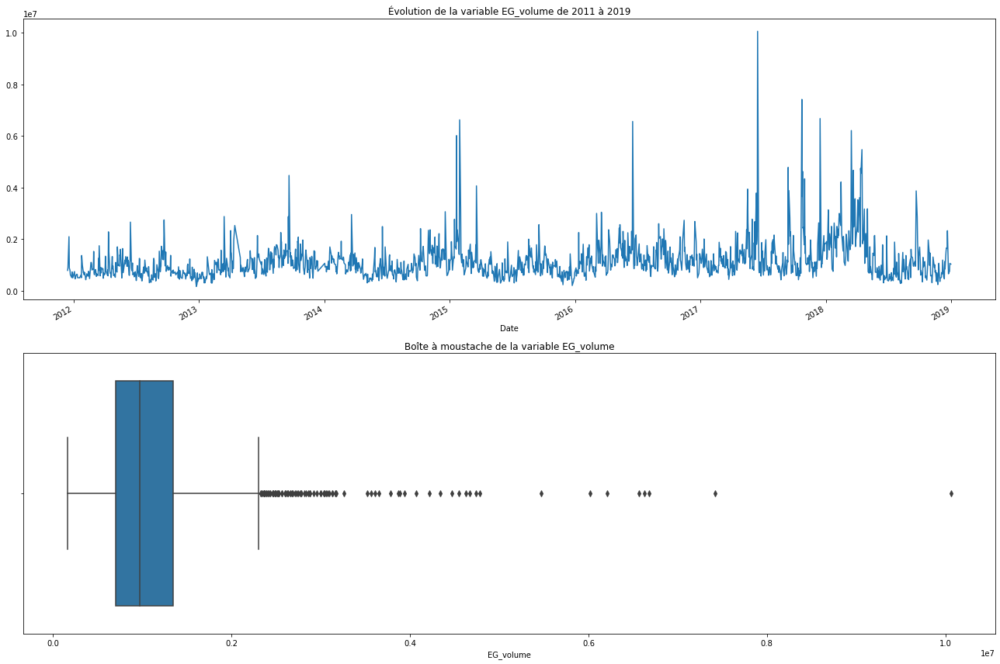

ÉTUDE DE LA VARIABLE "EU_Price"


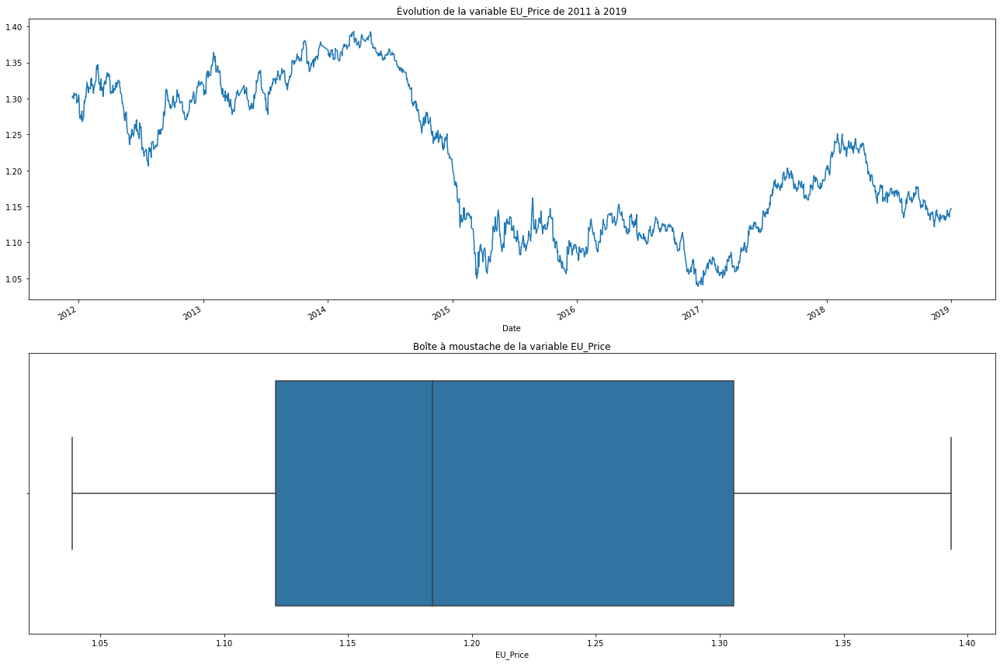

ÉTUDE DE LA VARIABLE "EU_open"


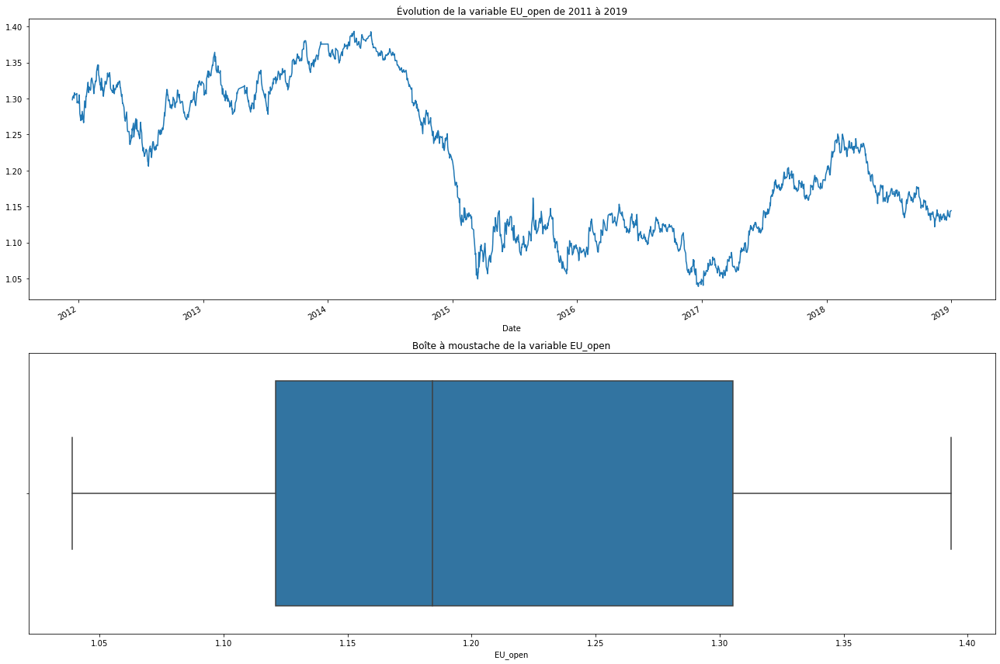

ÉTUDE DE LA VARIABLE "EU_high"


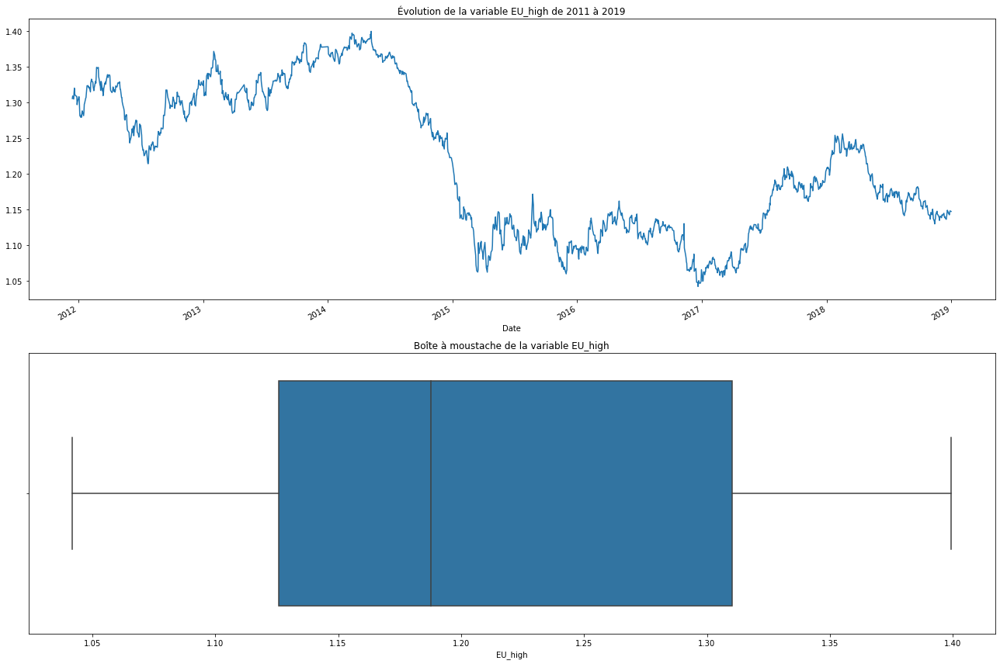

ÉTUDE DE LA VARIABLE "EU_low"


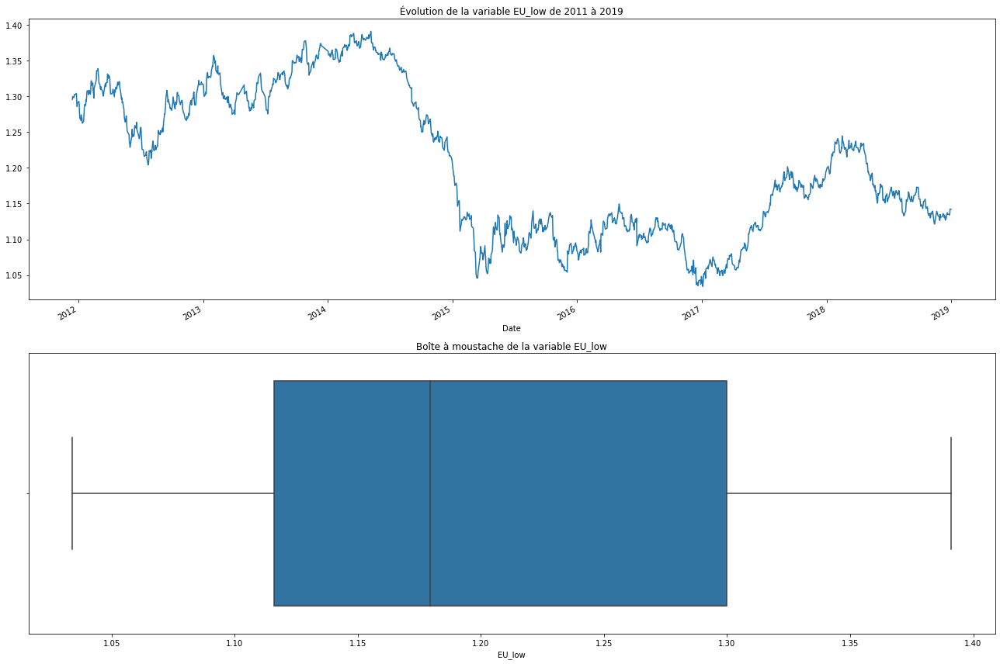

ÉTUDE DE LA VARIABLE "OF_Price"


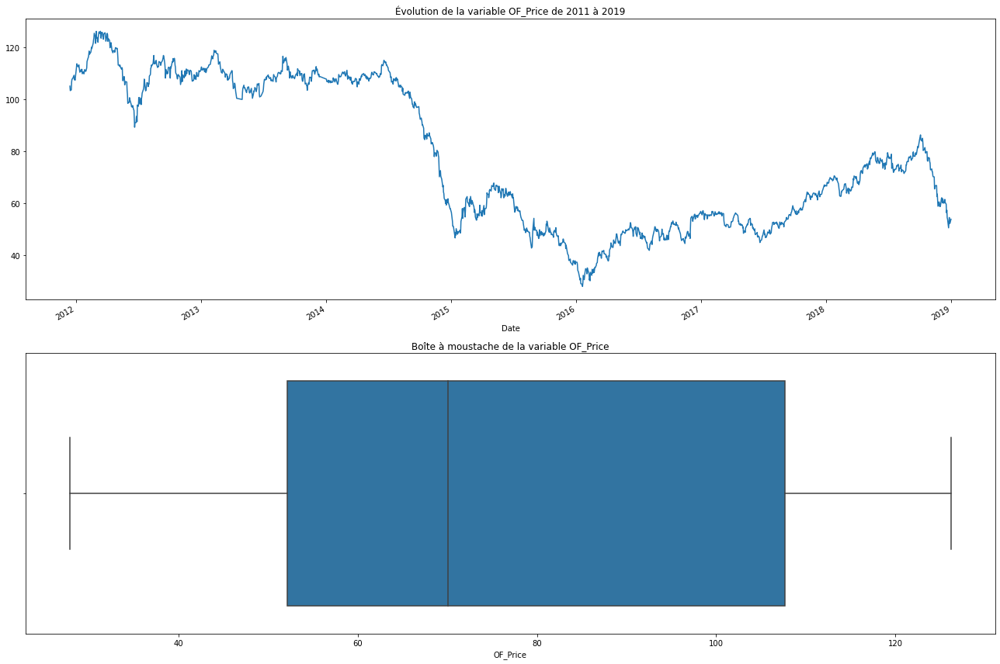

ÉTUDE DE LA VARIABLE "OF_Open"


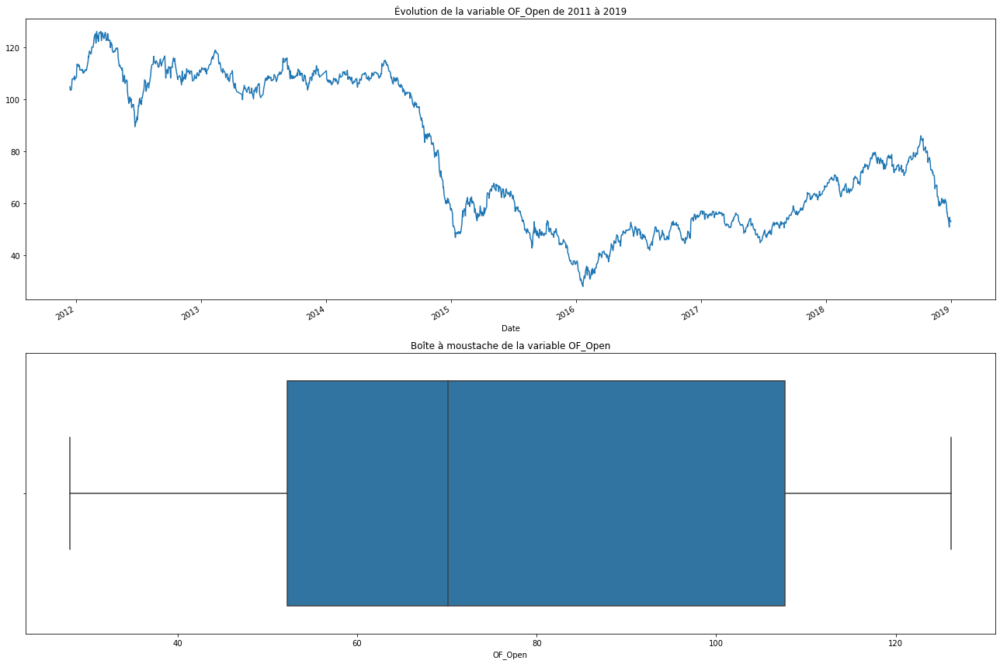

ÉTUDE DE LA VARIABLE "OF_High"


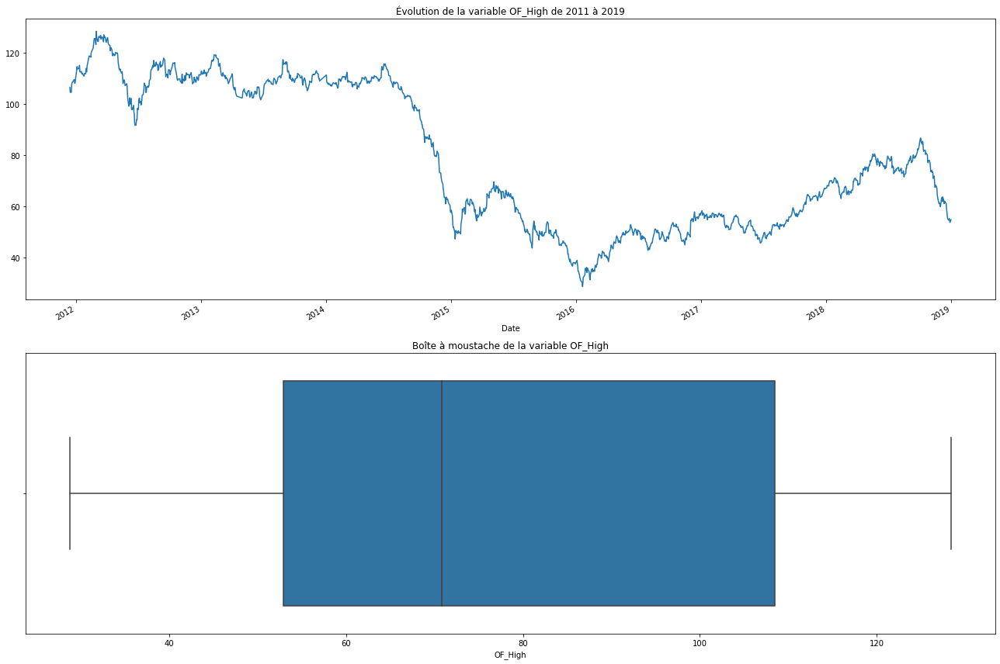

ÉTUDE DE LA VARIABLE "OF_Low"


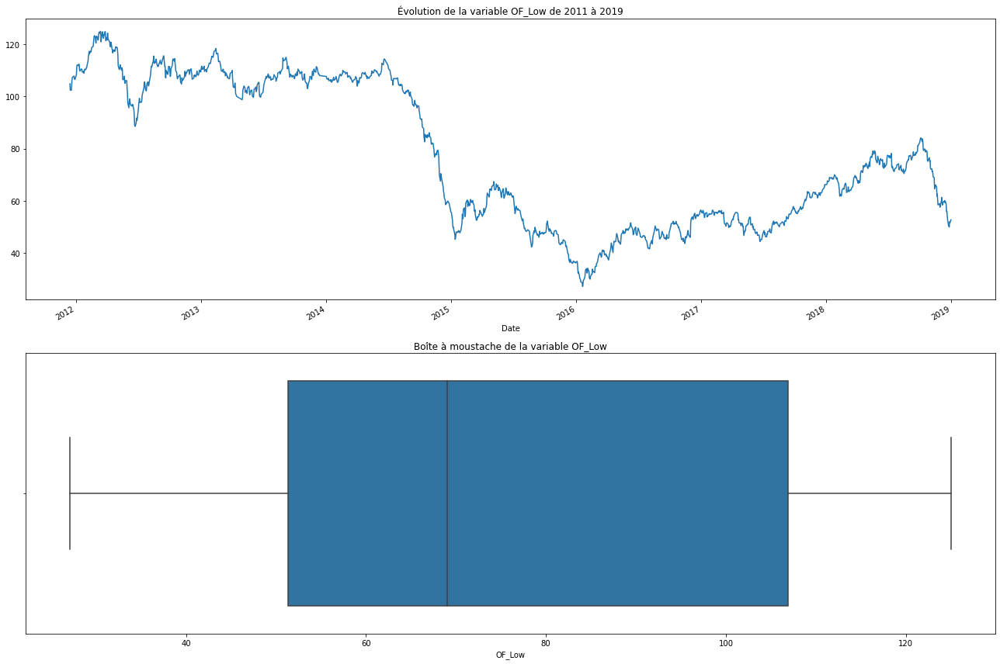

ÉTUDE DE LA VARIABLE "OF_Volume"


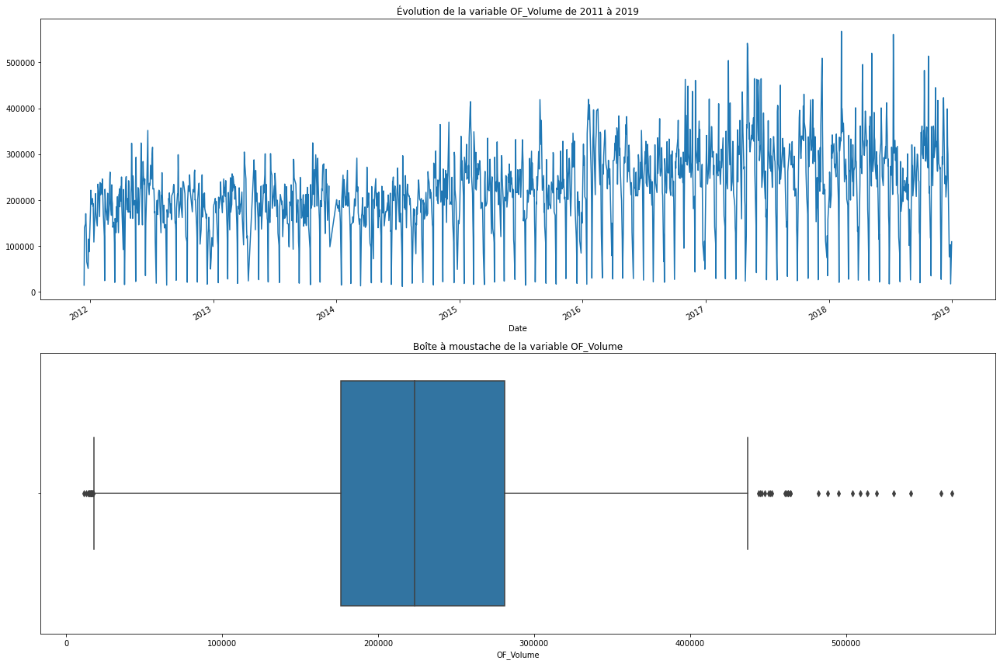

ÉTUDE DE LA VARIABLE "OS_Price"


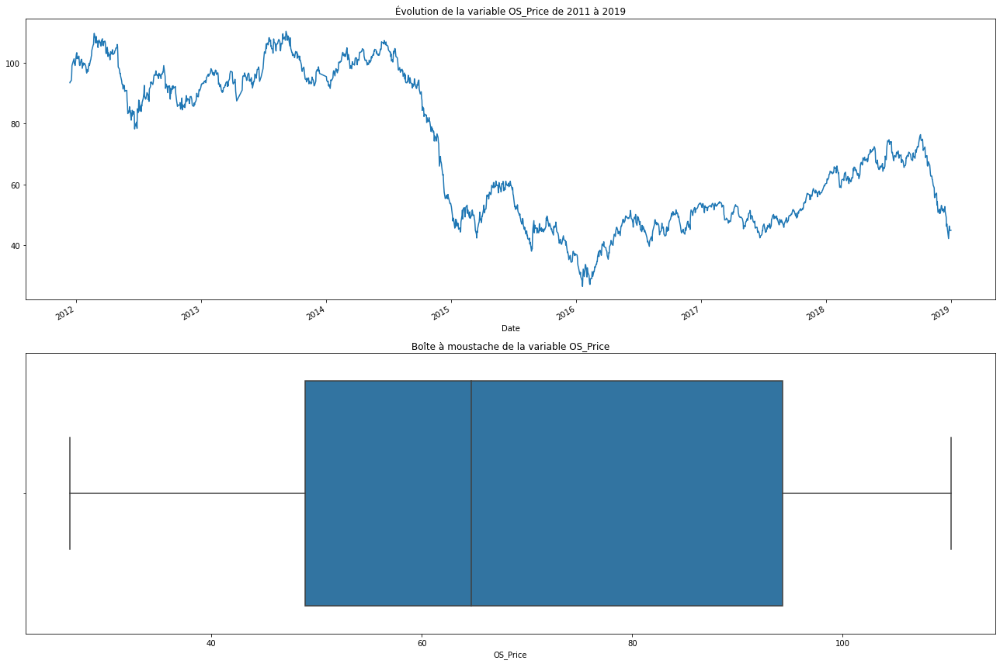

ÉTUDE DE LA VARIABLE "OS_Open"


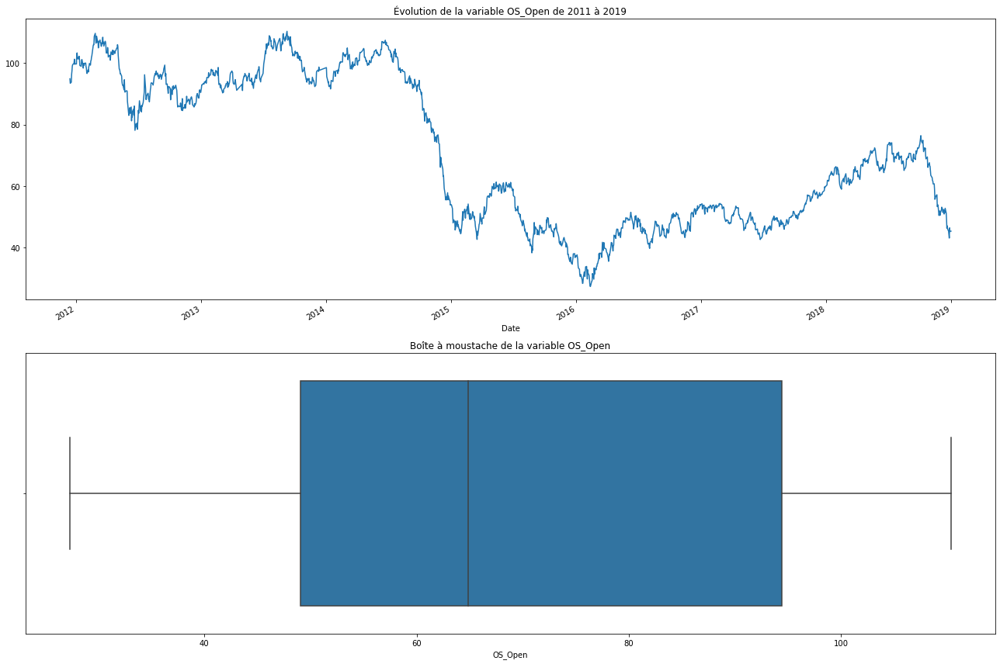

ÉTUDE DE LA VARIABLE "OS_High"


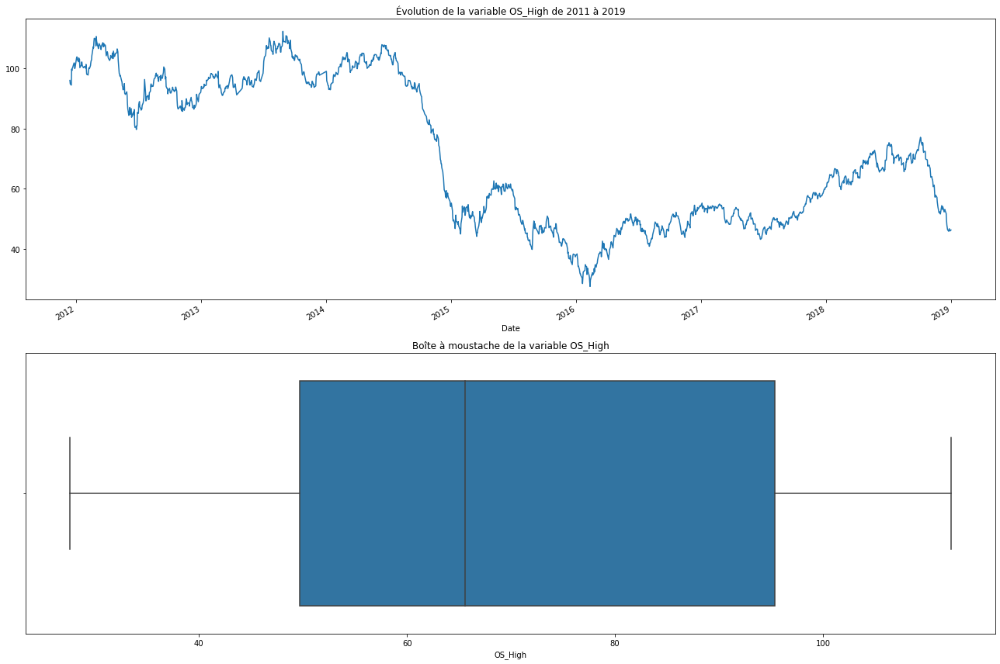

ÉTUDE DE LA VARIABLE "OS_Low"


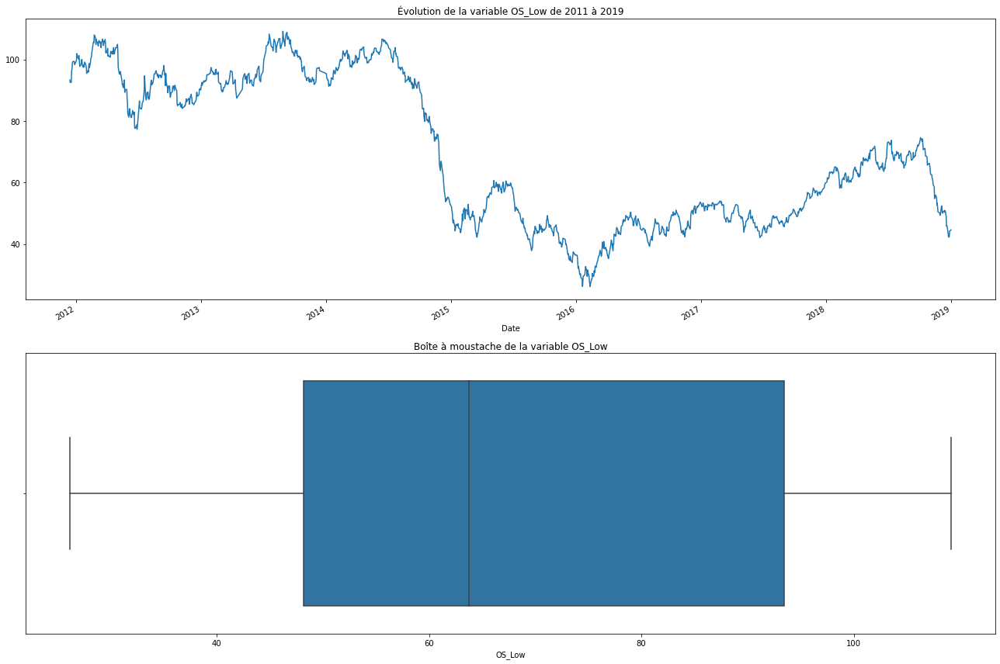

ÉTUDE DE LA VARIABLE "SF_Price"


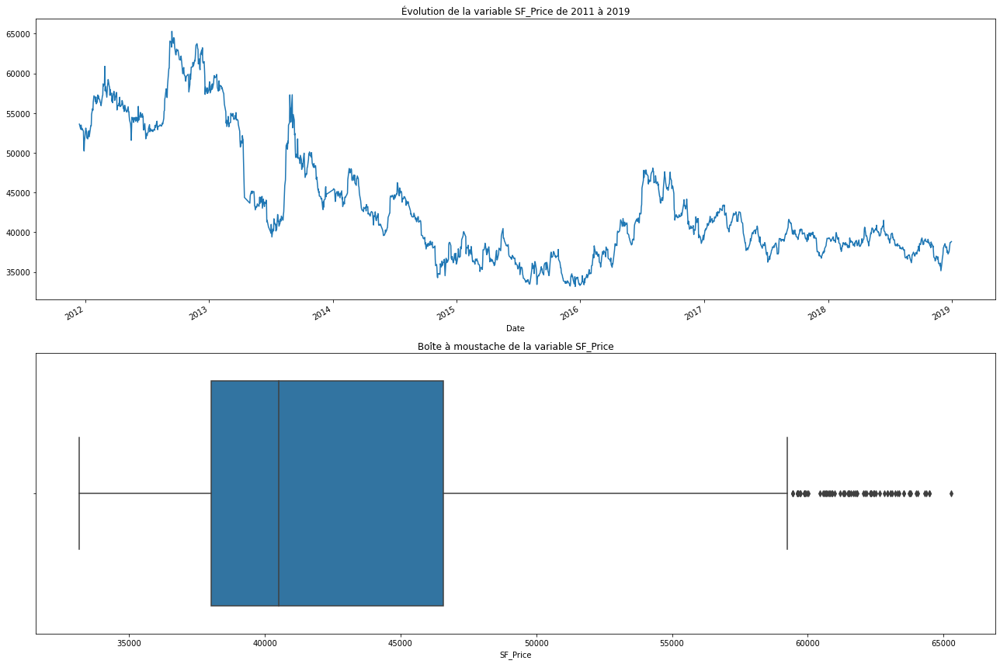

ÉTUDE DE LA VARIABLE "SF_Open"


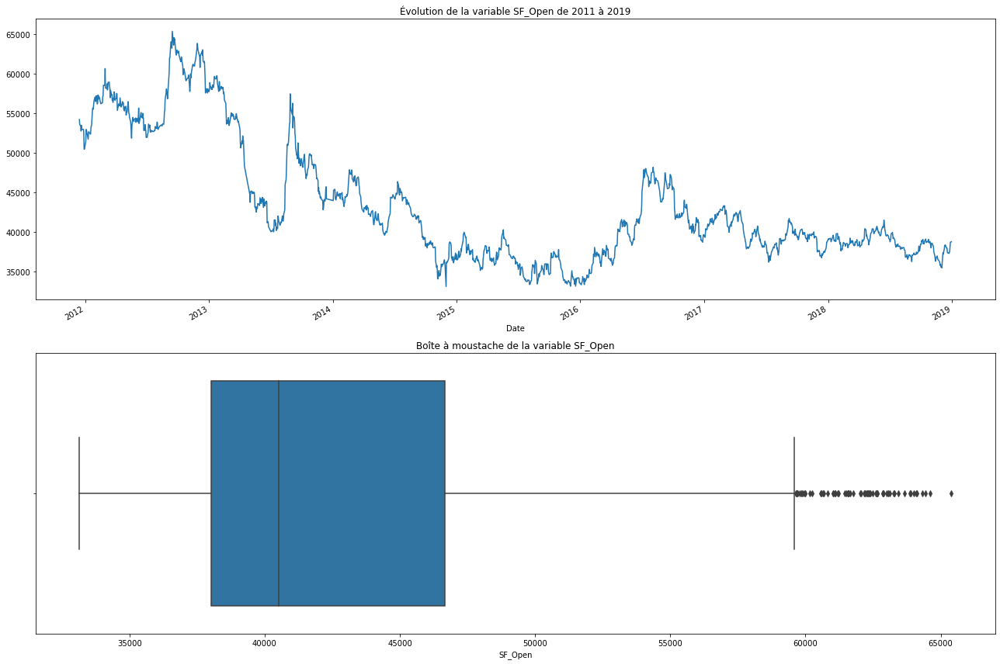

ÉTUDE DE LA VARIABLE "SF_High"


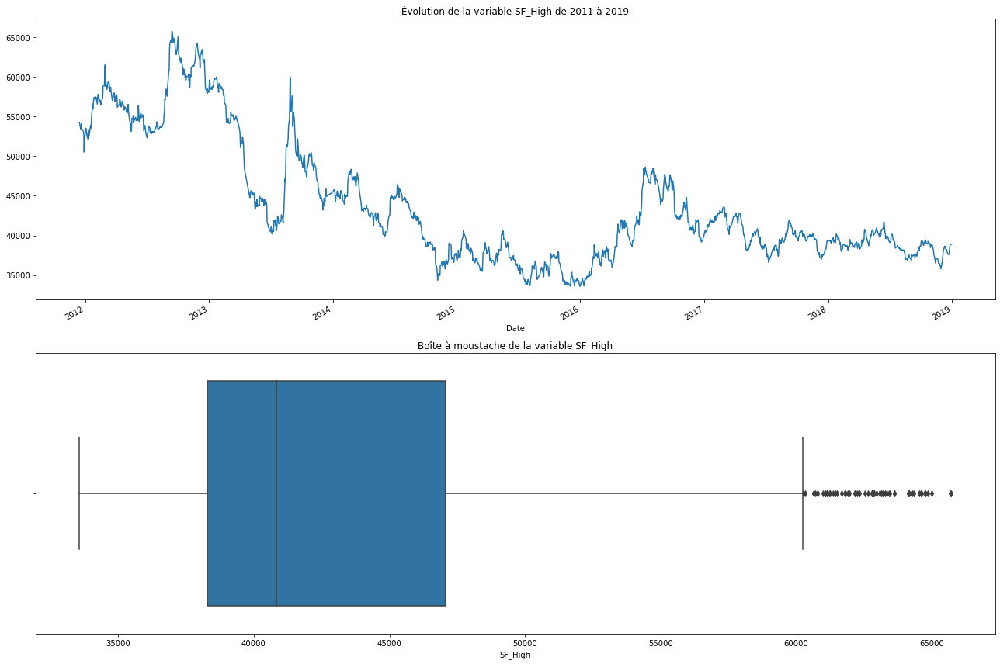

ÉTUDE DE LA VARIABLE "SF_Low"


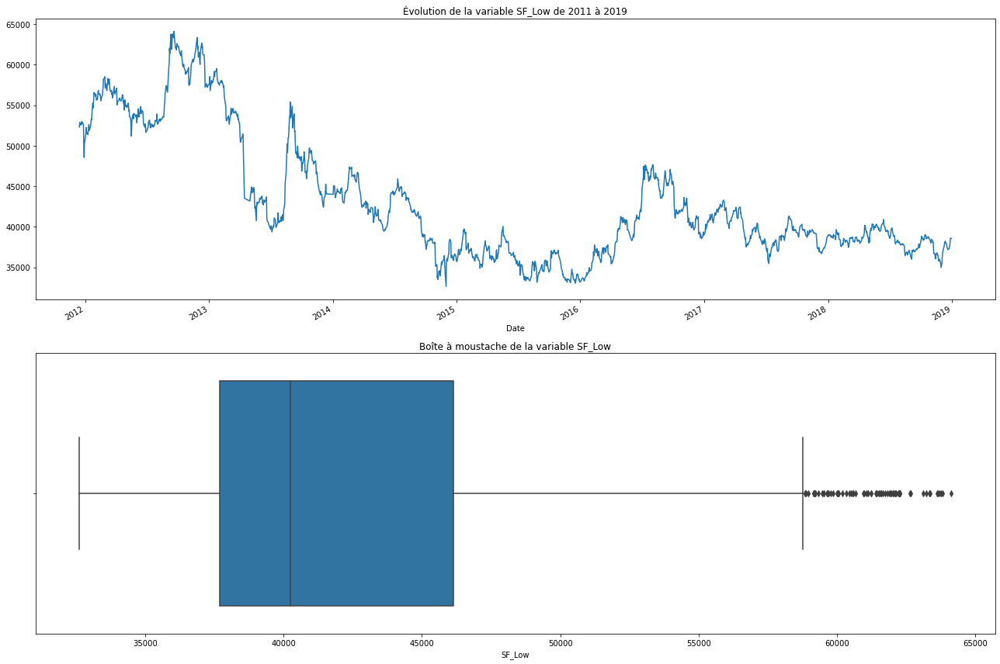

ÉTUDE DE LA VARIABLE "SF_Volume"


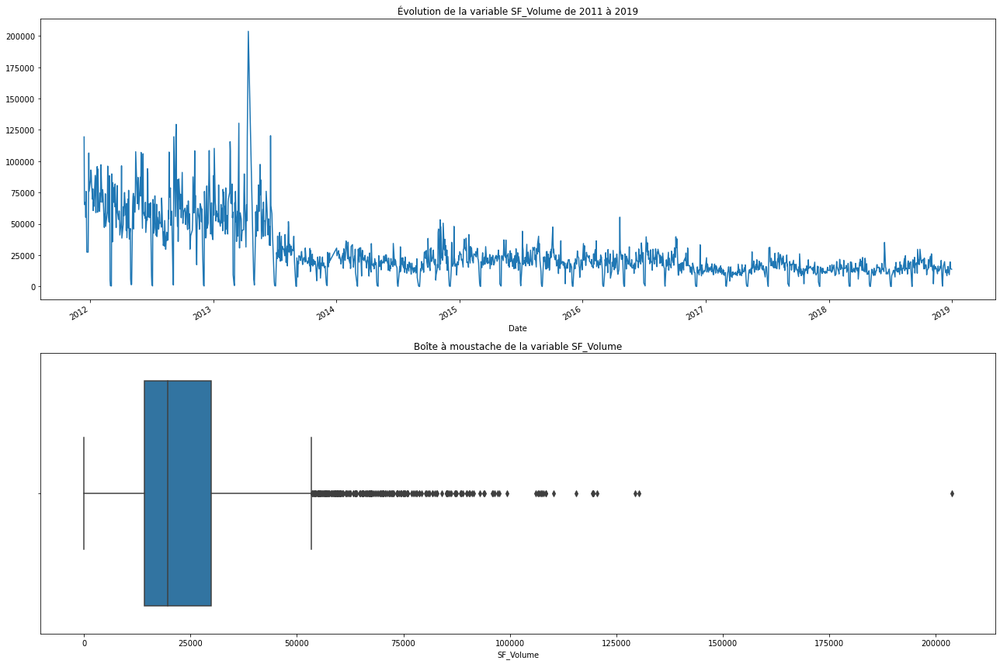

ÉTUDE DE LA VARIABLE "USB_Price"


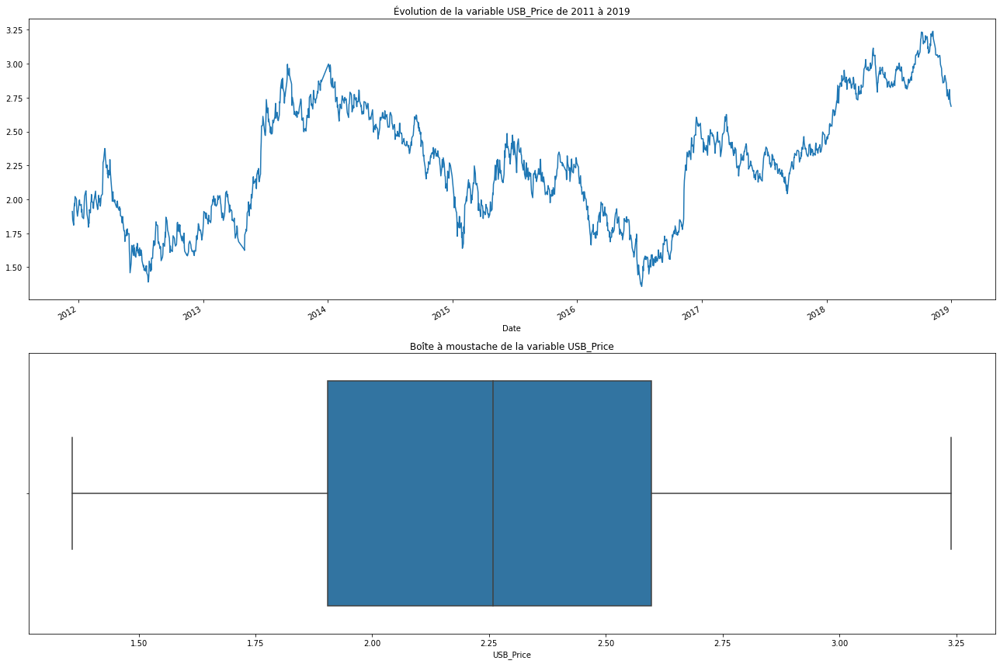

ÉTUDE DE LA VARIABLE "USB_Open"


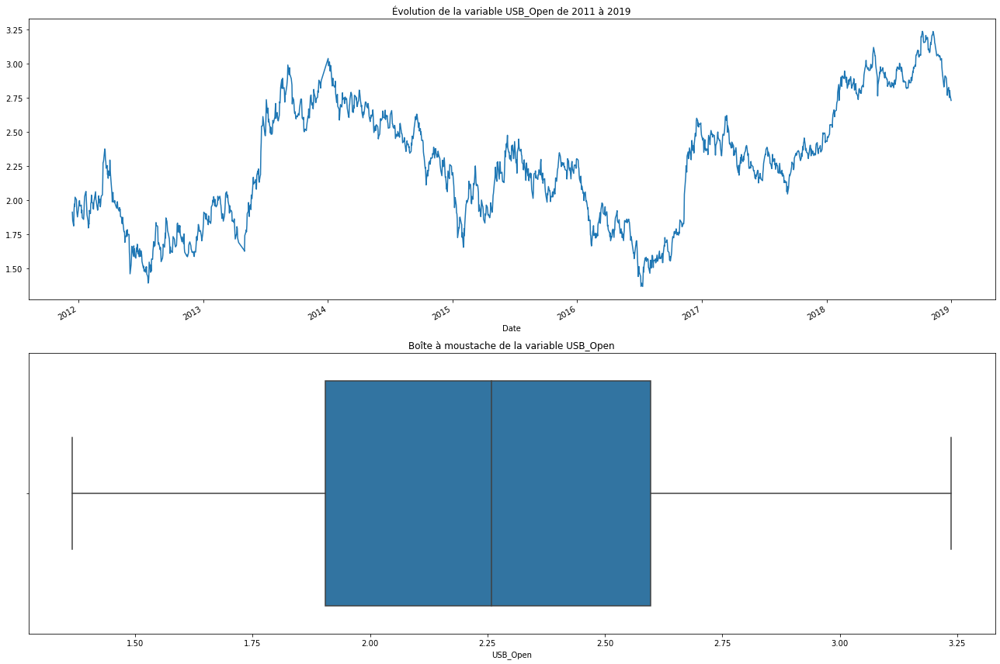

ÉTUDE DE LA VARIABLE "USB_High"


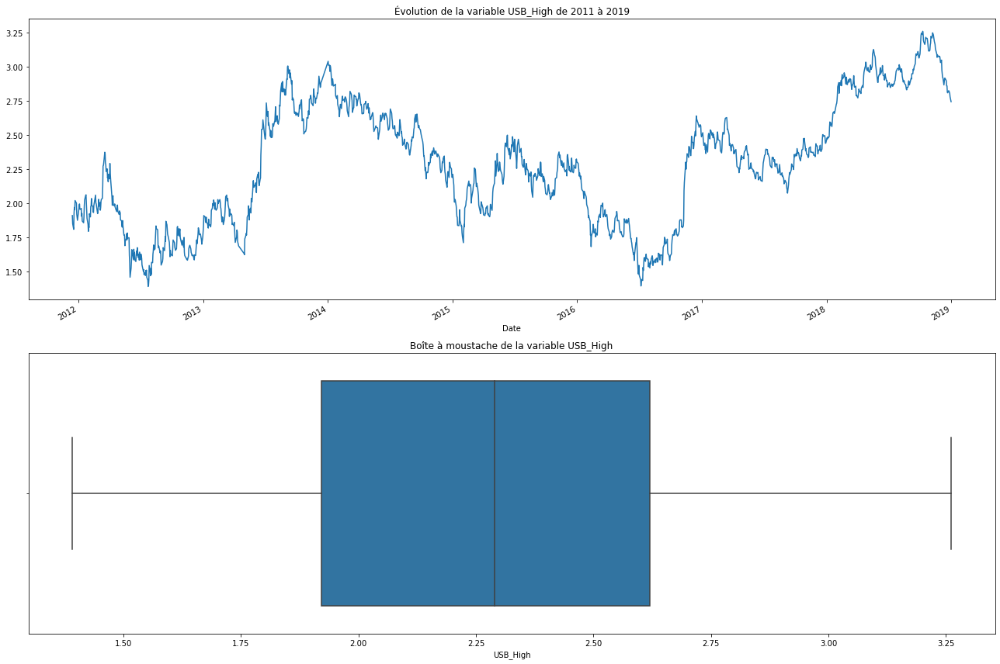

ÉTUDE DE LA VARIABLE "USB_Low"


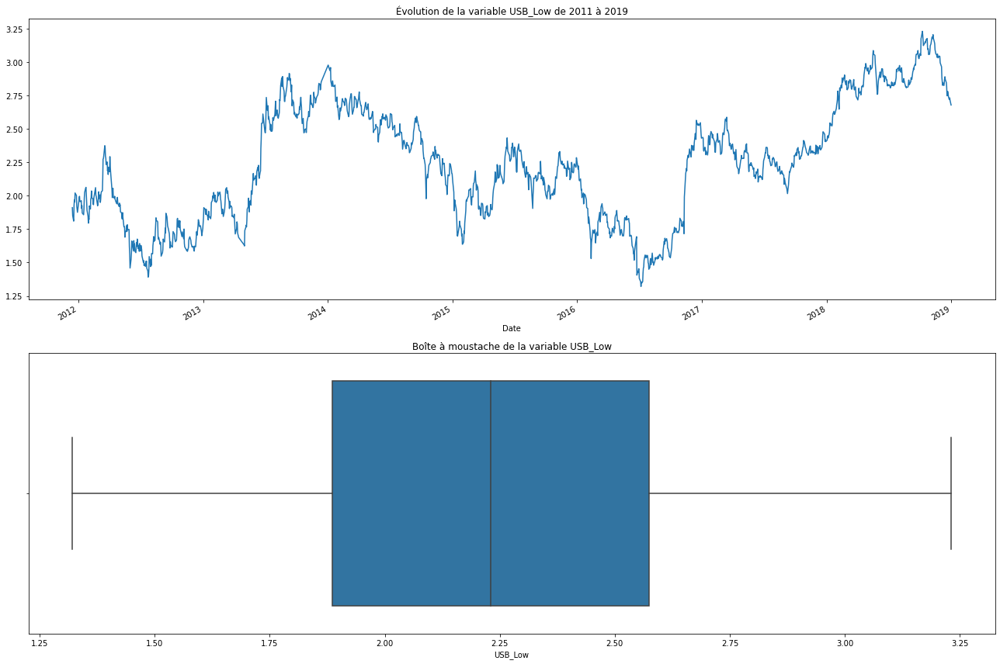

ÉTUDE DE LA VARIABLE "PLT_Price"


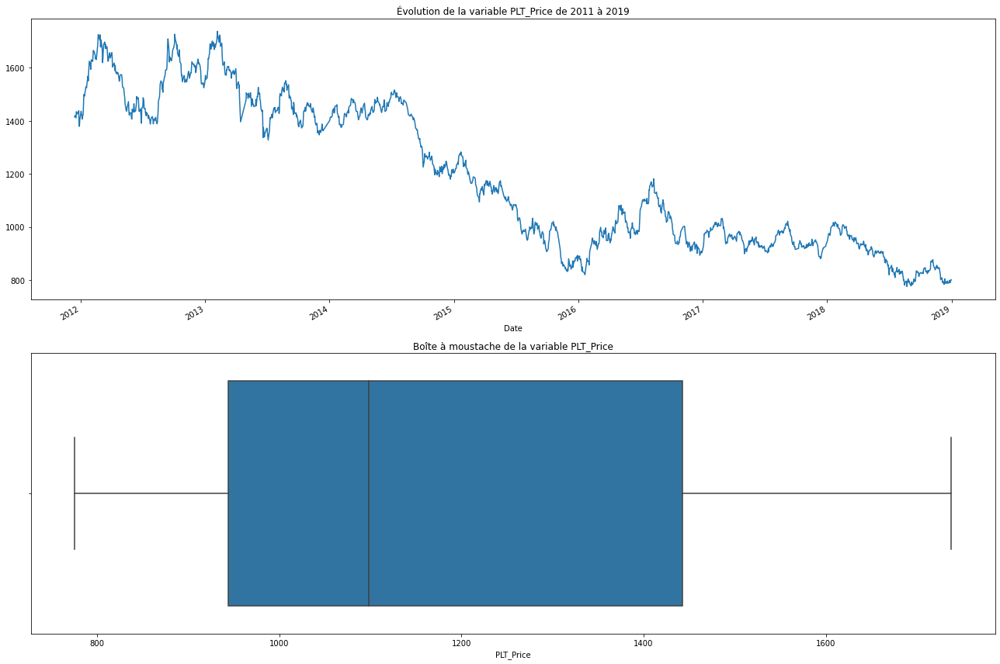

ÉTUDE DE LA VARIABLE "PLT_Open"


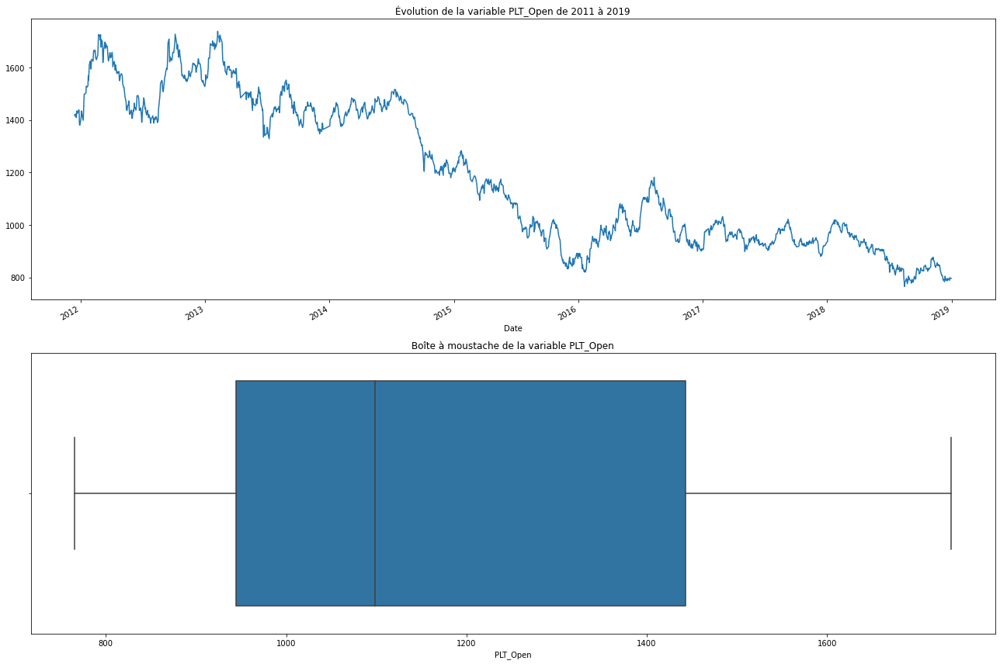

ÉTUDE DE LA VARIABLE "PLT_High"


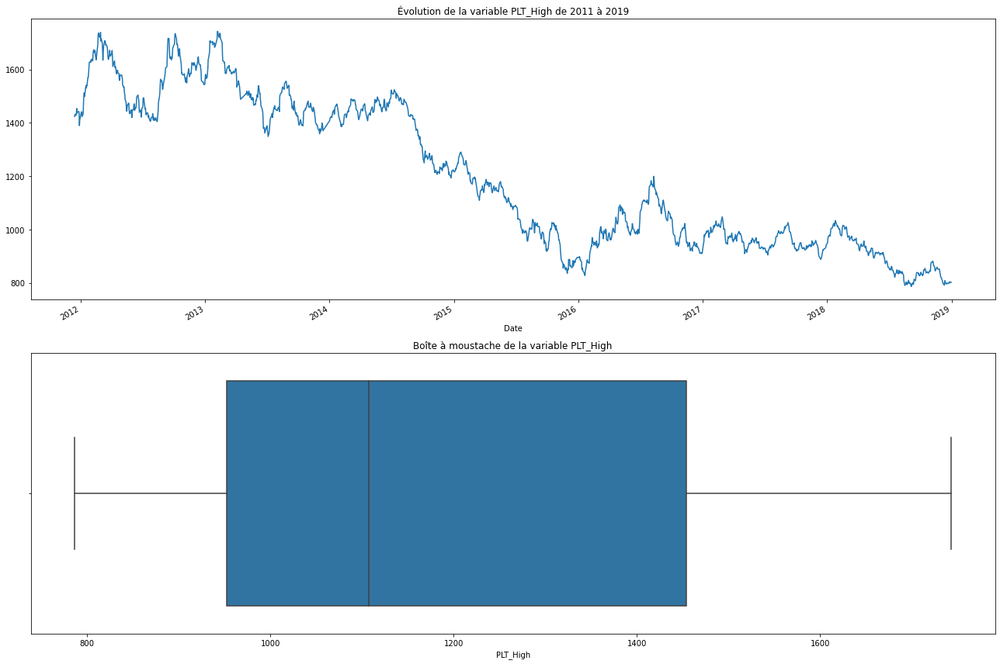

ÉTUDE DE LA VARIABLE "PLT_Low"


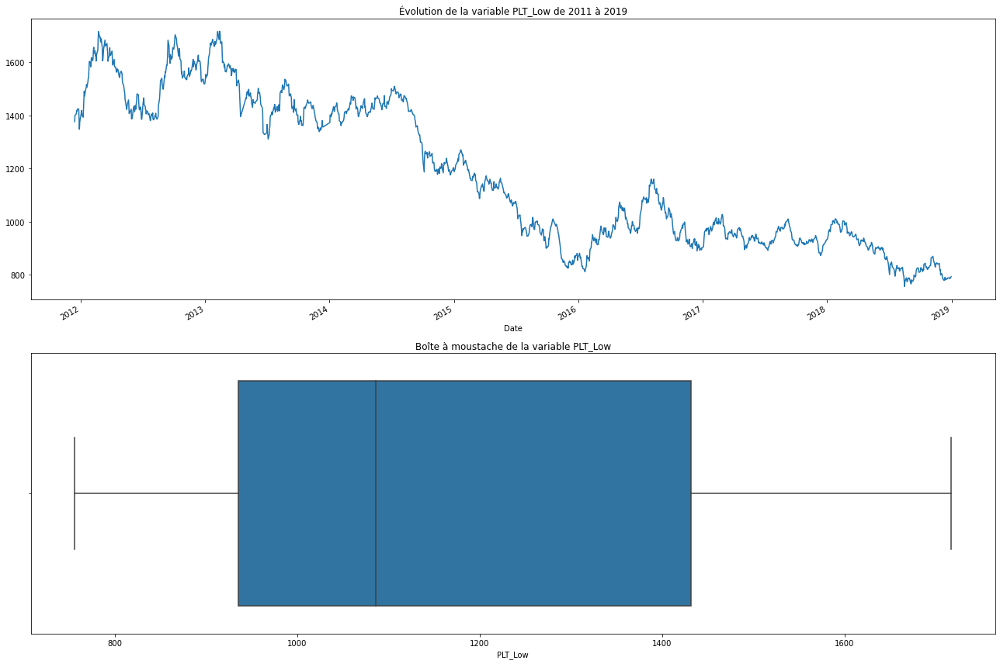

ÉTUDE DE LA VARIABLE "PLD_Price"


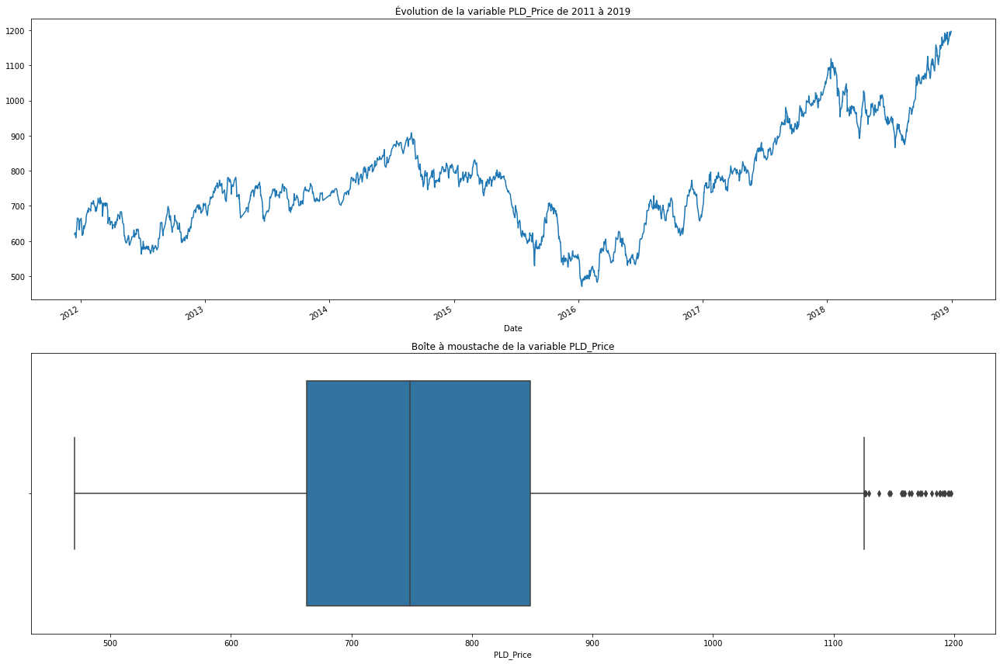

ÉTUDE DE LA VARIABLE "PLD_Open"


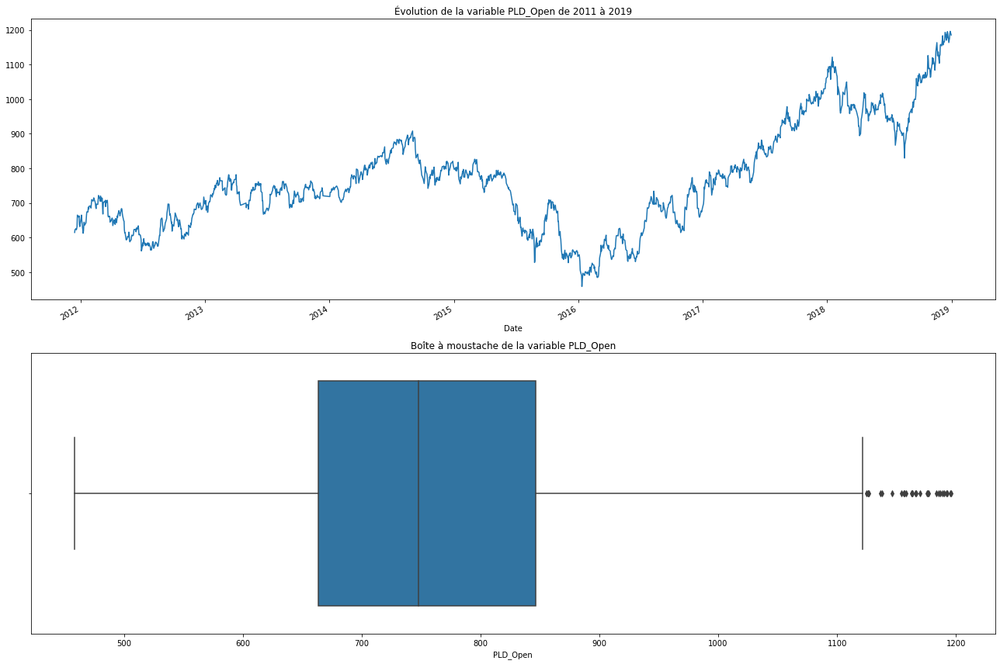

ÉTUDE DE LA VARIABLE "PLD_High"


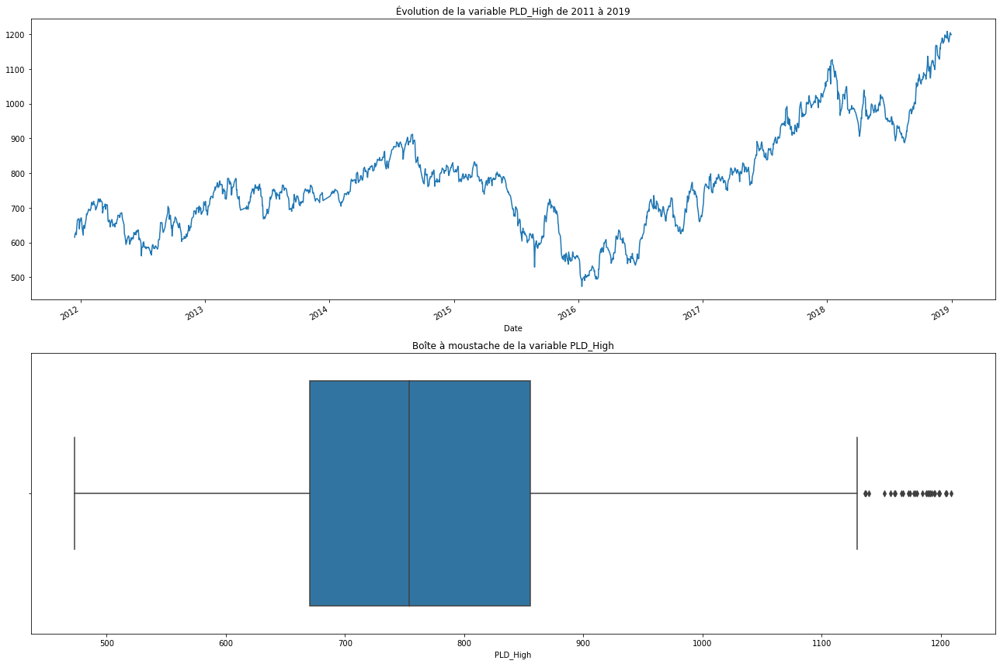

ÉTUDE DE LA VARIABLE "PLD_Low"


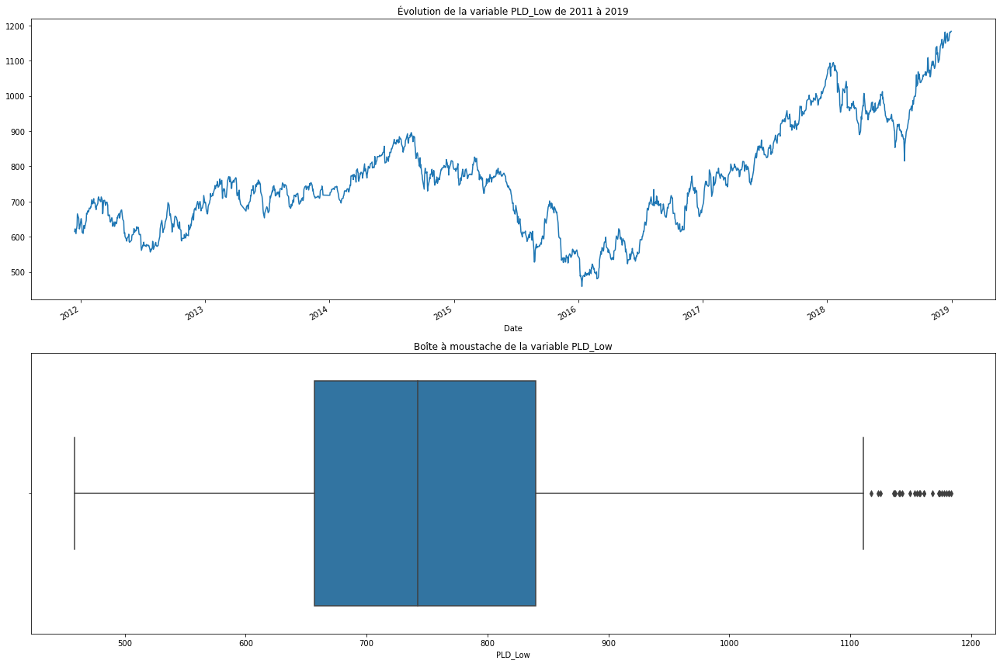

ÉTUDE DE LA VARIABLE "RHO_PRICE"


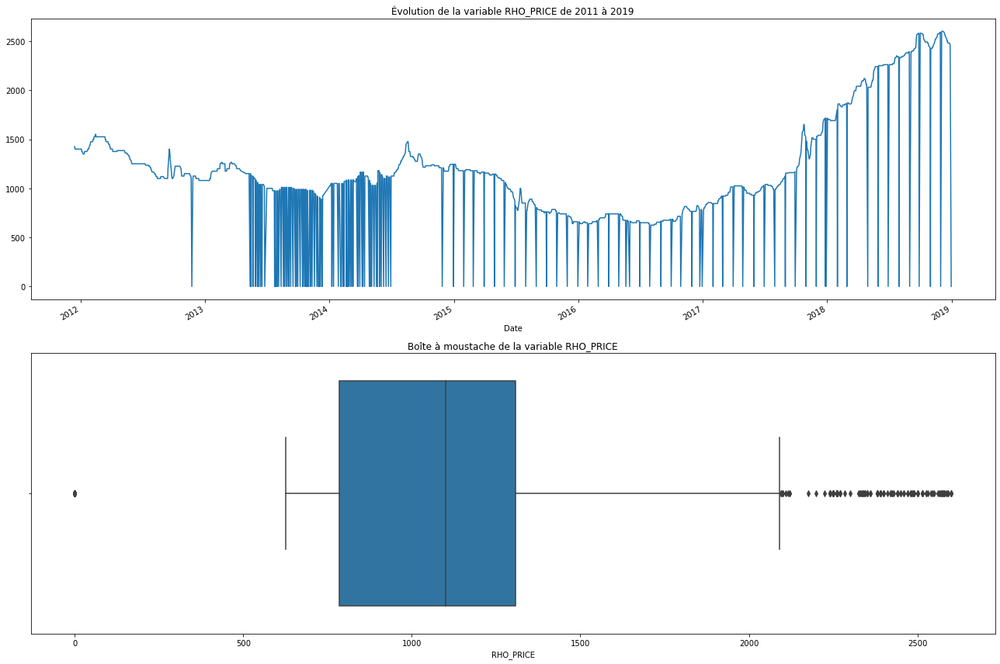

ÉTUDE DE LA VARIABLE "USDI_Price"


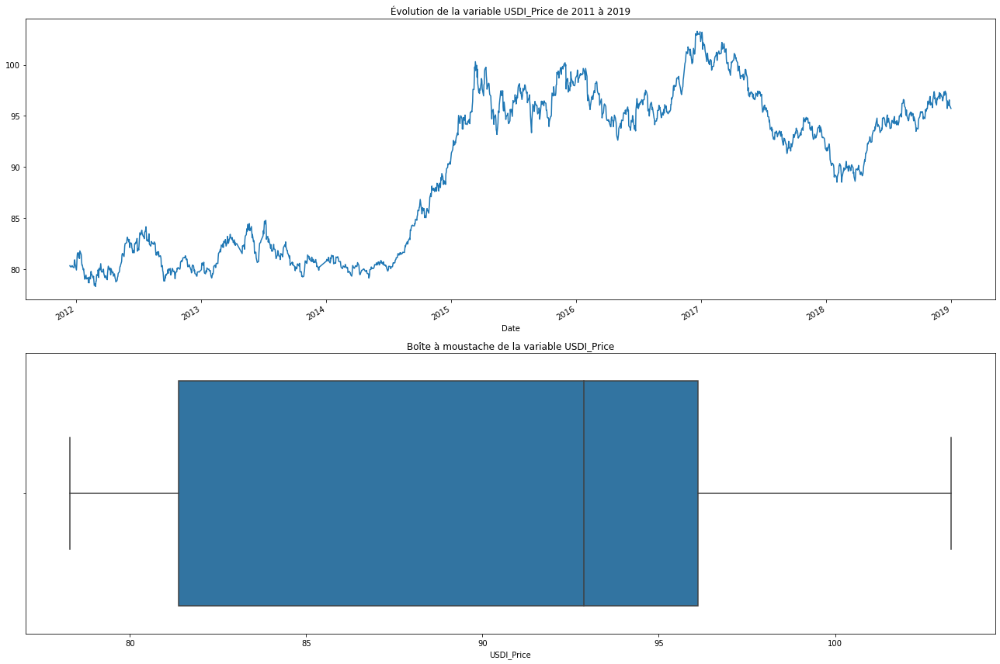

ÉTUDE DE LA VARIABLE "USDI_Open"


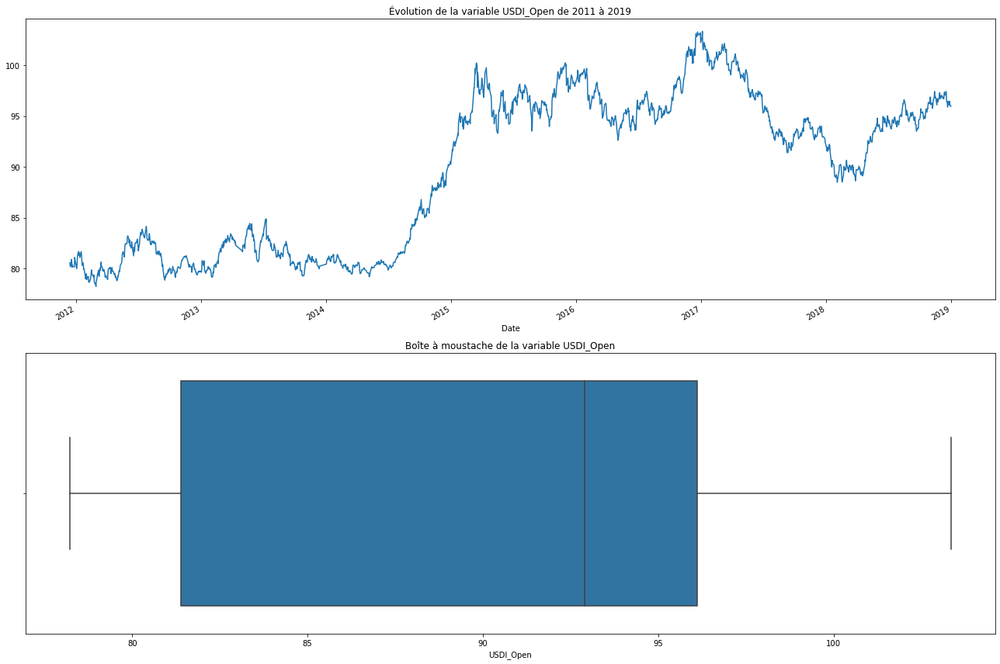

ÉTUDE DE LA VARIABLE "USDI_High"


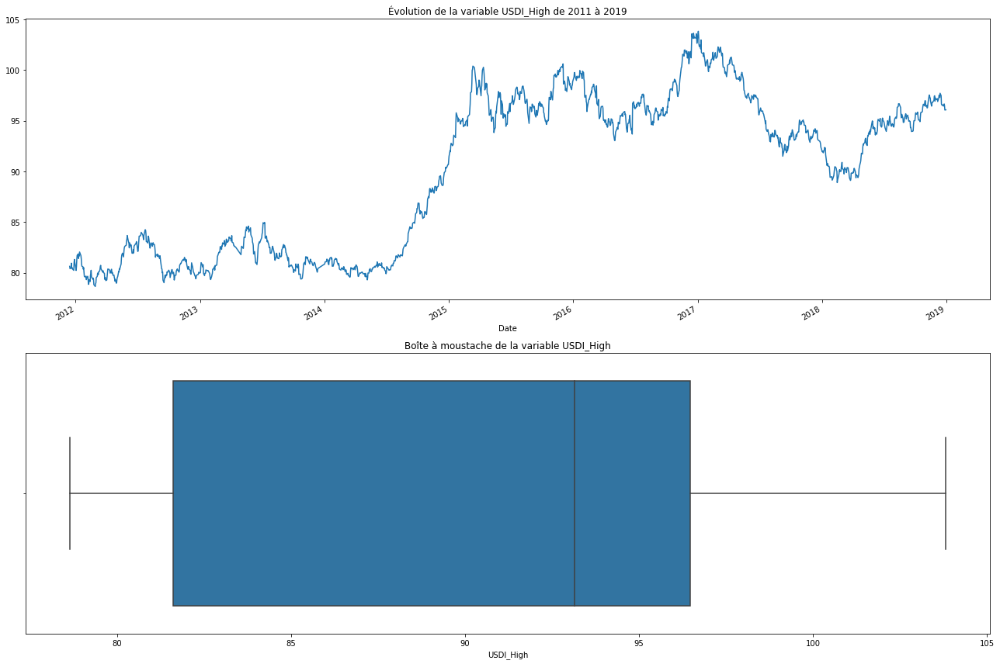

ÉTUDE DE LA VARIABLE "USDI_Low"


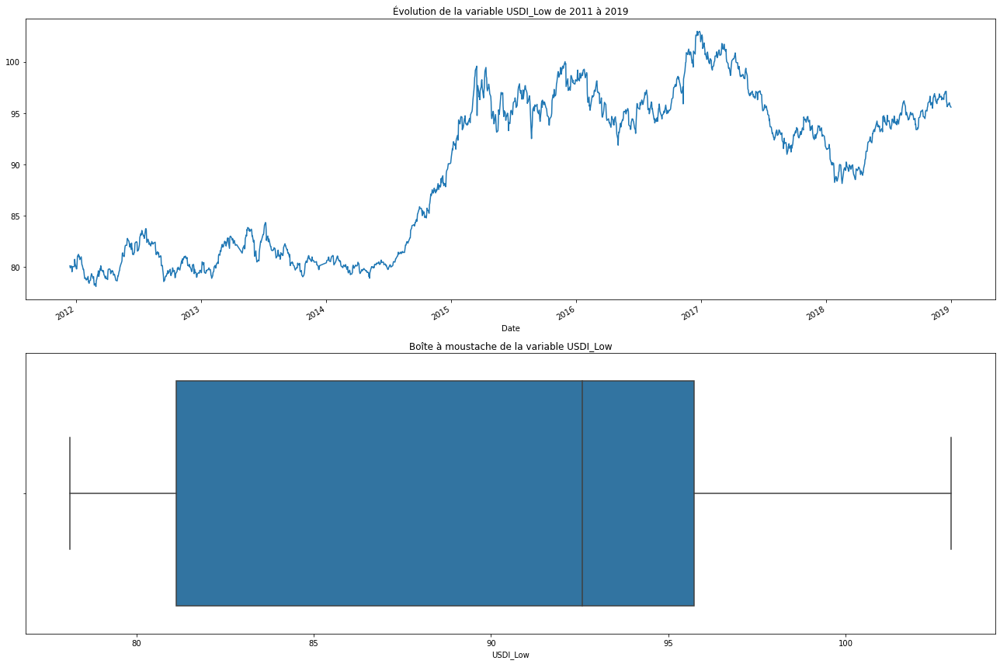

ÉTUDE DE LA VARIABLE "USDI_Volume"


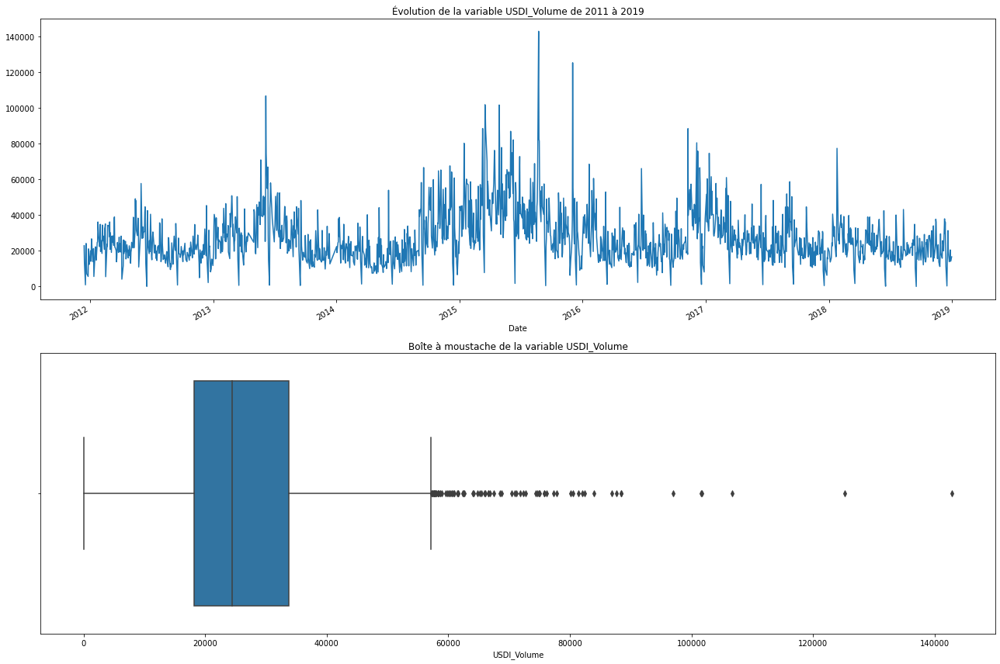

ÉTUDE DE LA VARIABLE "GDX_Open"


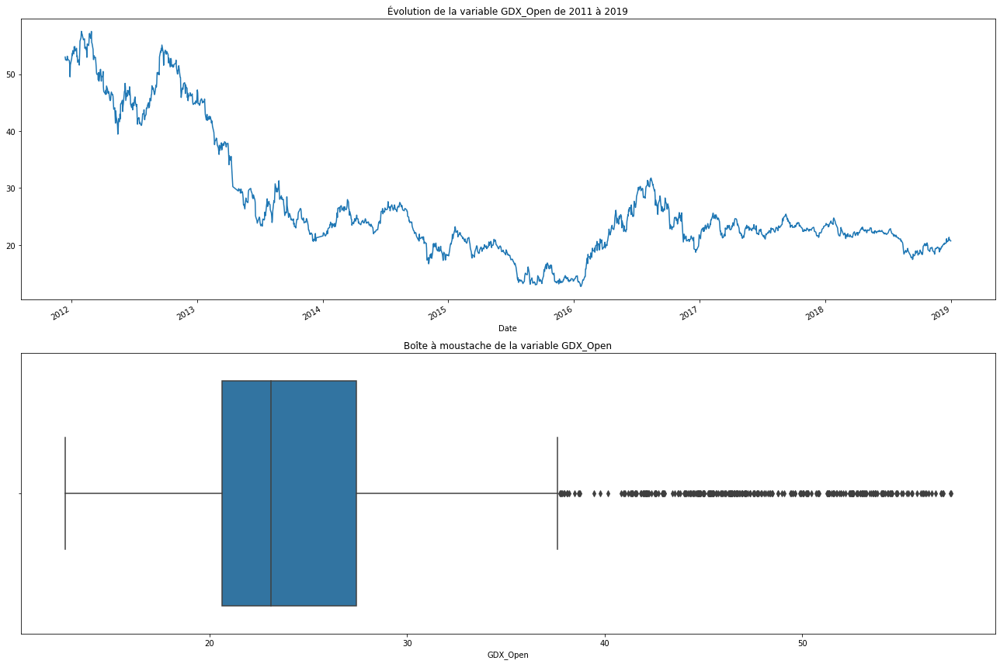

ÉTUDE DE LA VARIABLE "GDX_High"


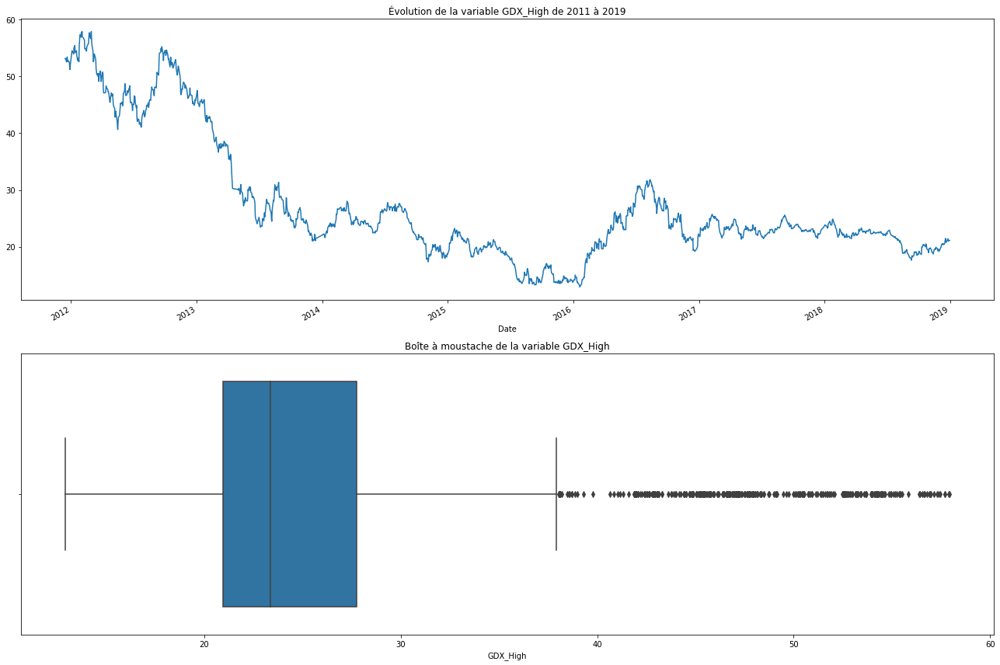

ÉTUDE DE LA VARIABLE "GDX_Low"


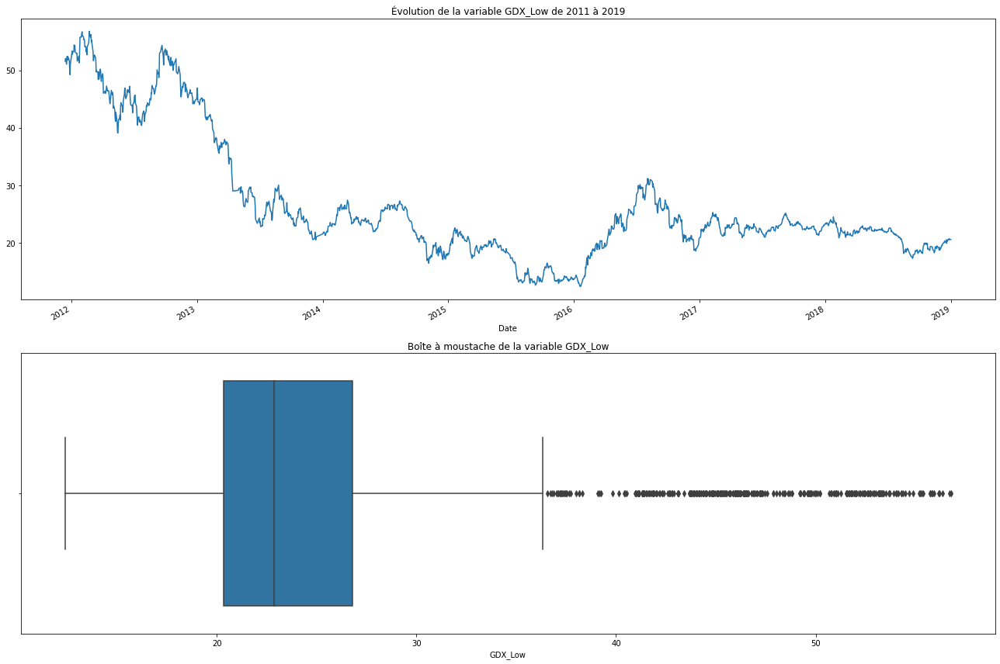

ÉTUDE DE LA VARIABLE "GDX_Close"


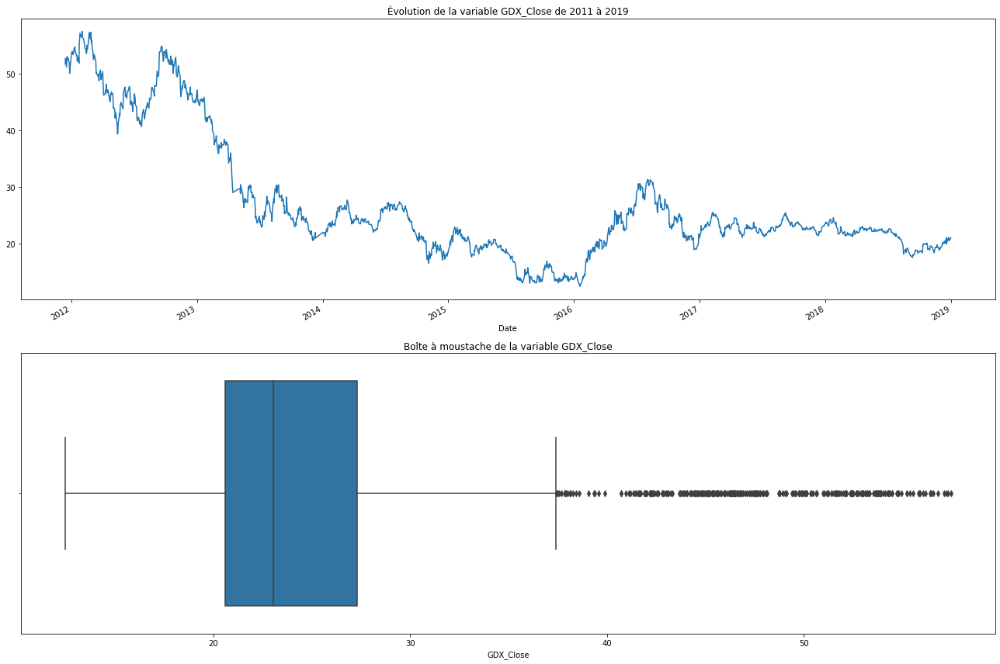

ÉTUDE DE LA VARIABLE "GDX_Adj Close"


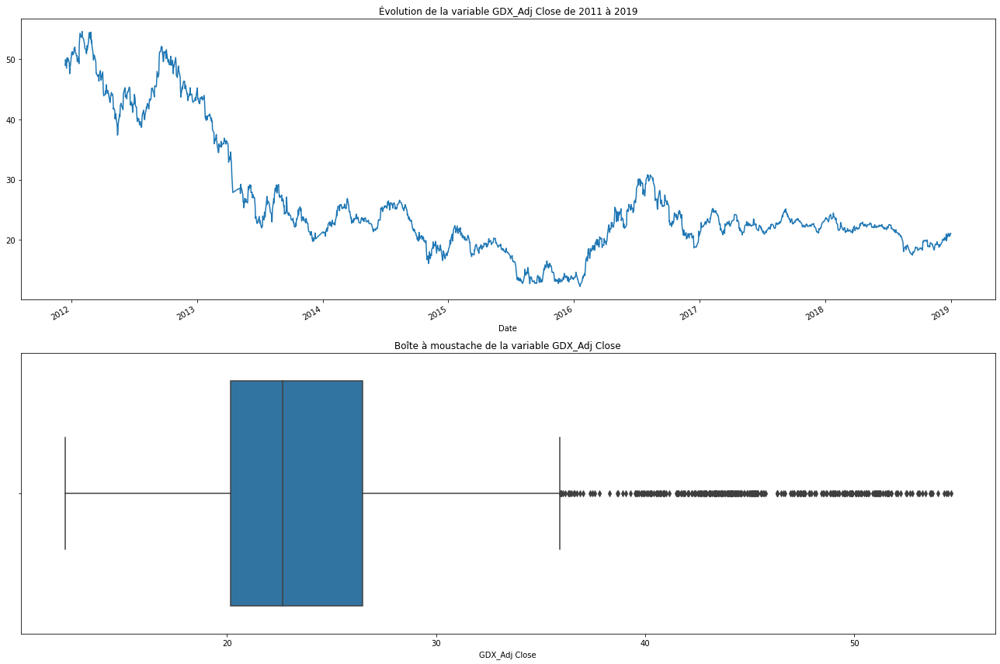

ÉTUDE DE LA VARIABLE "GDX_Volume"


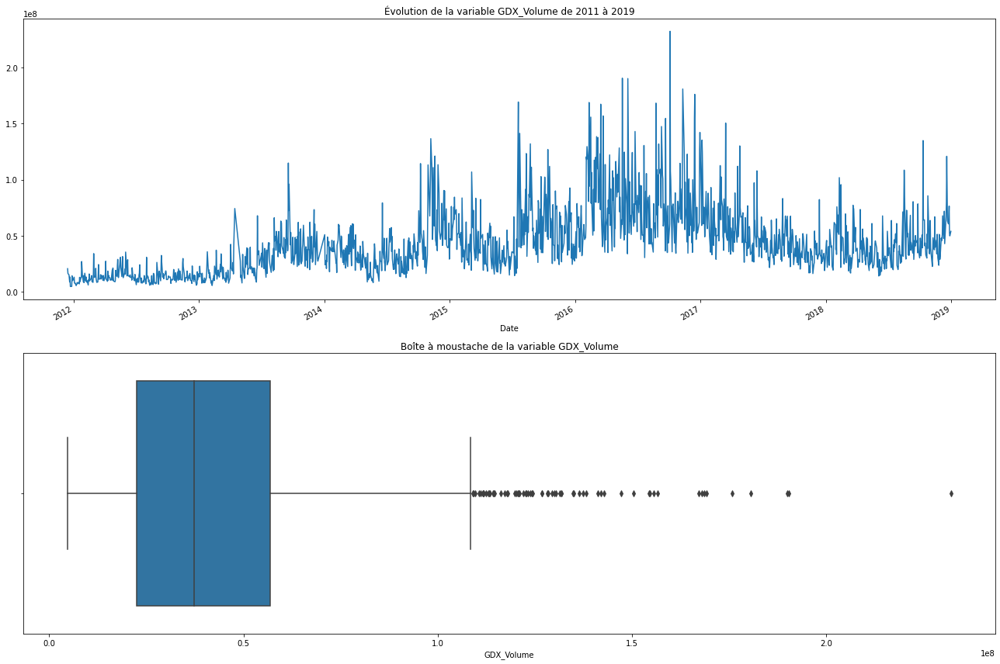

ÉTUDE DE LA VARIABLE "USO_Open"


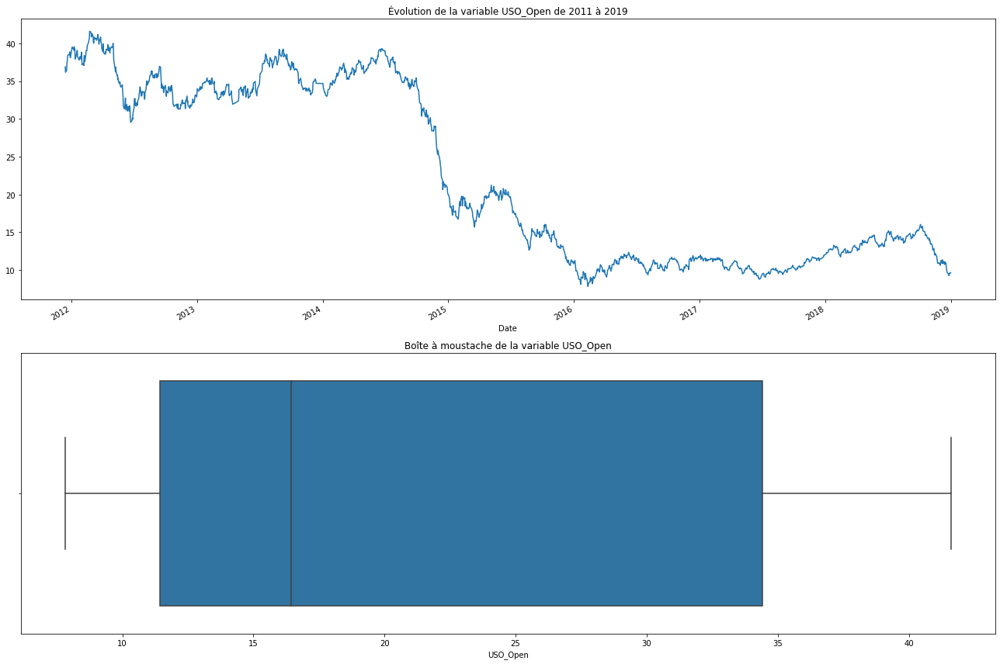

ÉTUDE DE LA VARIABLE "USO_High"


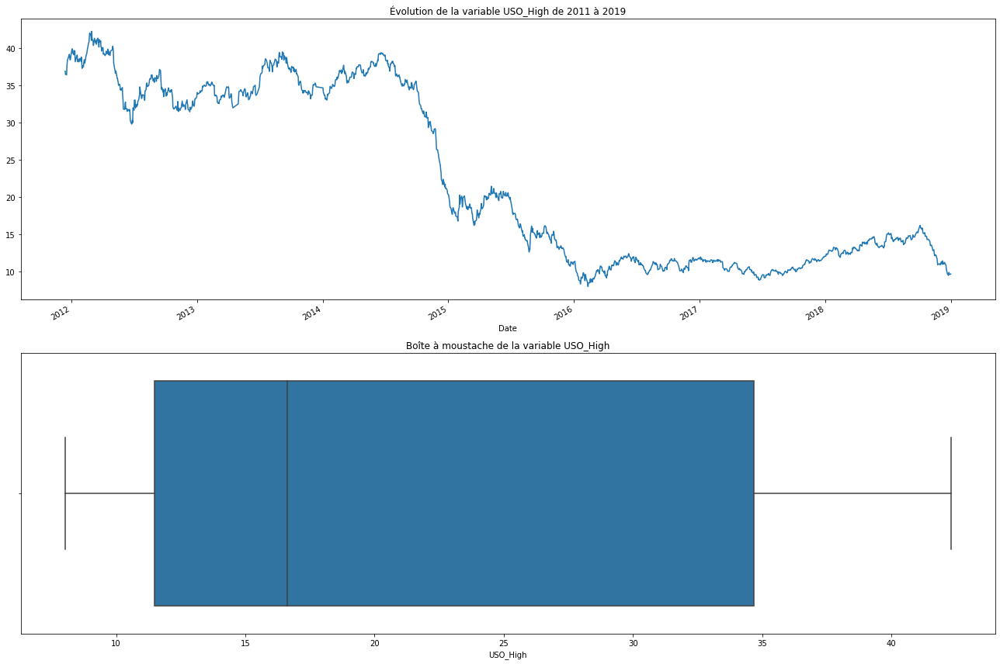

ÉTUDE DE LA VARIABLE "USO_Low"


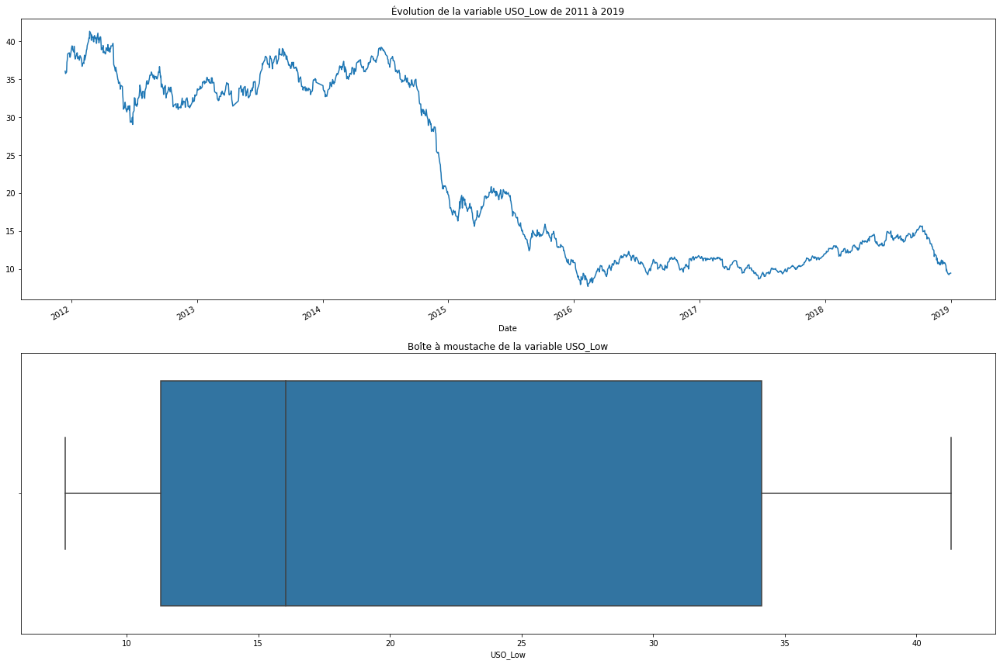

ÉTUDE DE LA VARIABLE "USO_Close"


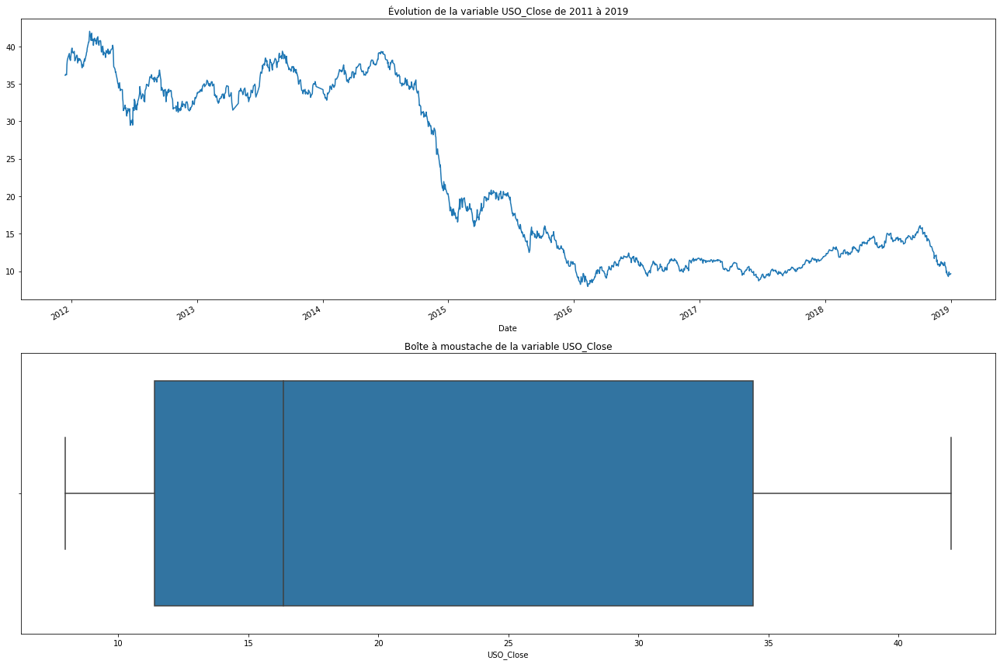

ÉTUDE DE LA VARIABLE "USO_Adj Close"


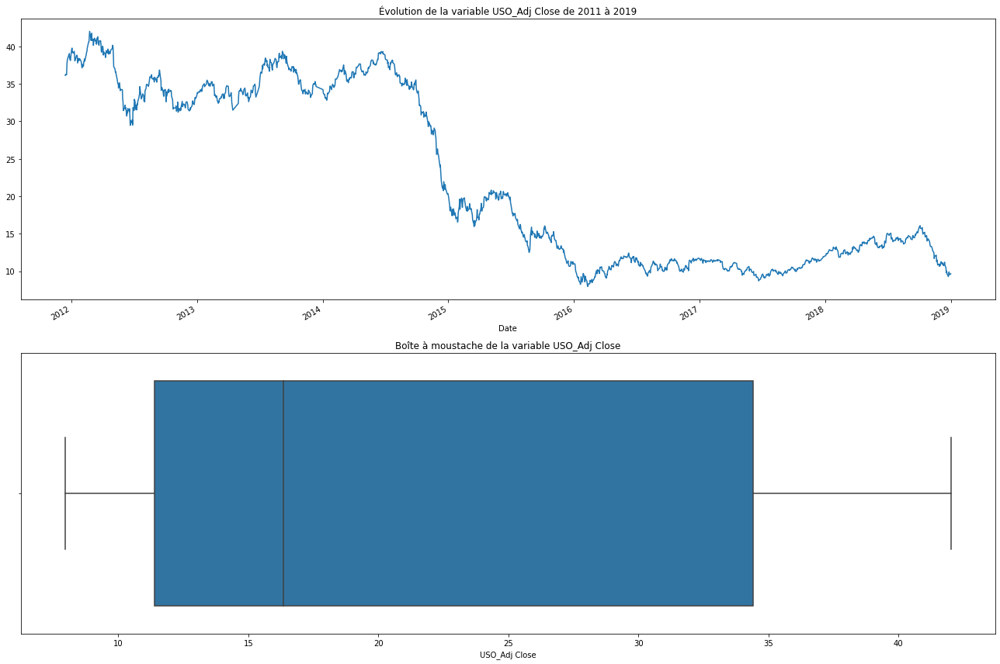

ÉTUDE DE LA VARIABLE "USO_Volume"


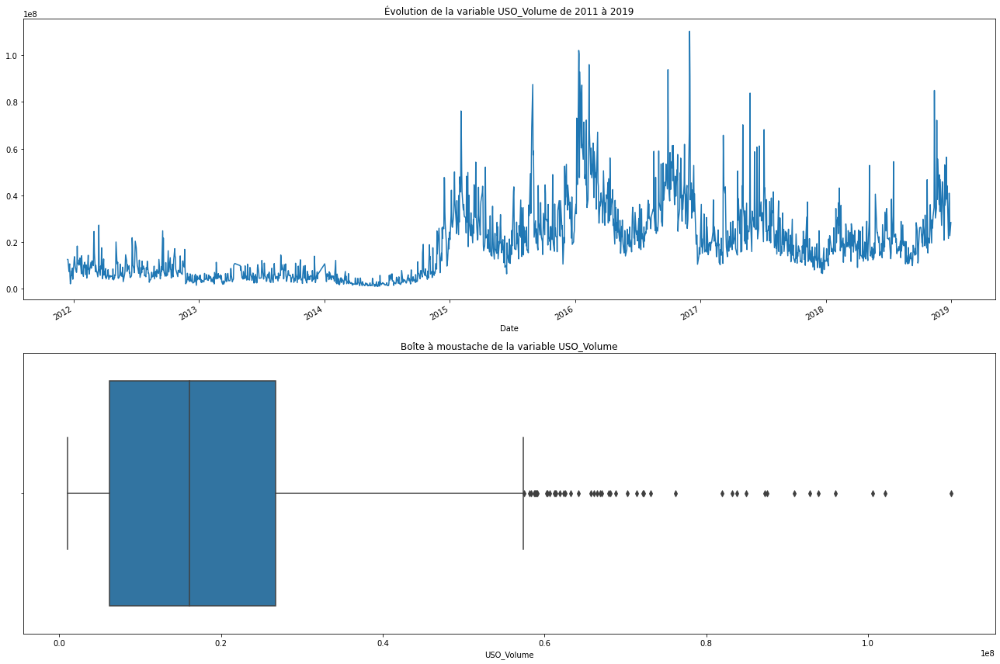

In [43]:
for i in features_list_quanti:    
    print("="*110)
    print(f'ÉTUDE DE LA VARIABLE "{i}"')

    #Représentation graphique de l'évolution d'une variable au cours du temps
    plt.subplot(211)
    df[i].plot(figsize = (18,12))
    plt.title(f'Évolution de la variable {i} de 2011 à 2019')

    #Boîte à moustache d'une variable
    plt.subplot(212)
    plt.title(f'Boîte à moustache de la variable {i}')
    sns.boxplot(data = df, x = i)

    plt.tight_layout()
    plt.show()

##### Étude de chaque variable quantitative discrète

Pour chacune de ces variables, les diagrammes circulaire et à barre nous aideront à mieux les comprendre.

In [85]:
#Liste des variables quantitatives discrètes
features_list_trend = ['EU_Trend','OF_Trend','OS_Trend','SF_Trend','USB_Trend','PLT_Trend','PLD_Trend','USDI_Trend']
len(features_list_trend)

8

ÉTUDE DE LA VARIABLE "EU_Trend"


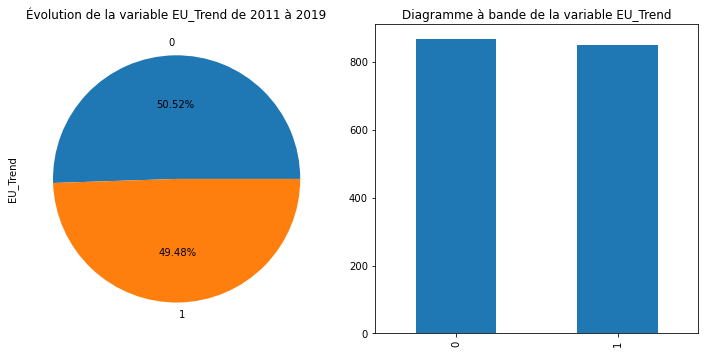

ÉTUDE DE LA VARIABLE "OF_Trend"


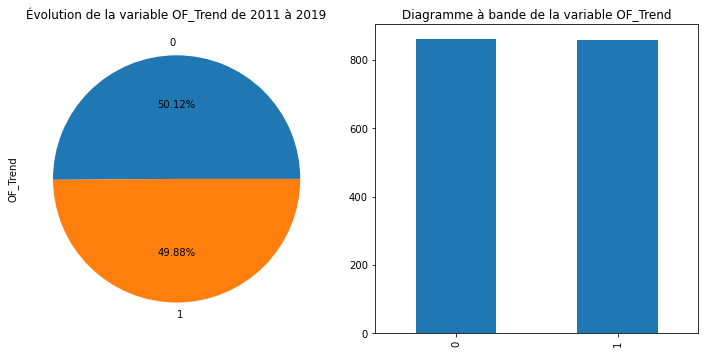

ÉTUDE DE LA VARIABLE "OS_Trend"


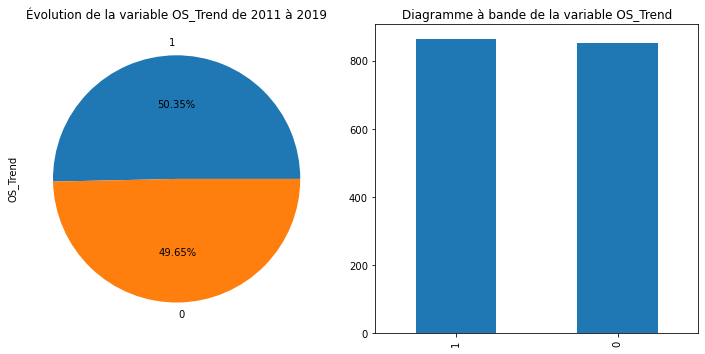

ÉTUDE DE LA VARIABLE "SF_Trend"


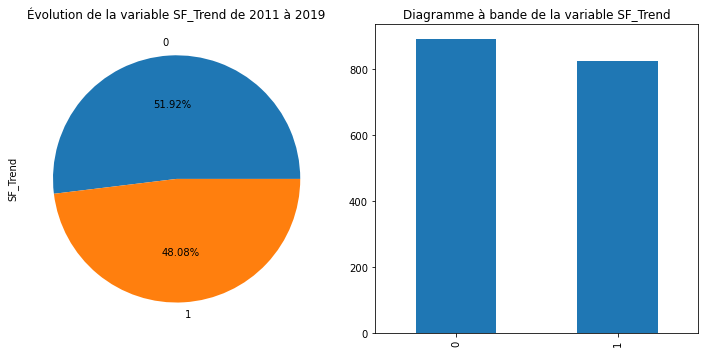

ÉTUDE DE LA VARIABLE "USB_Trend"


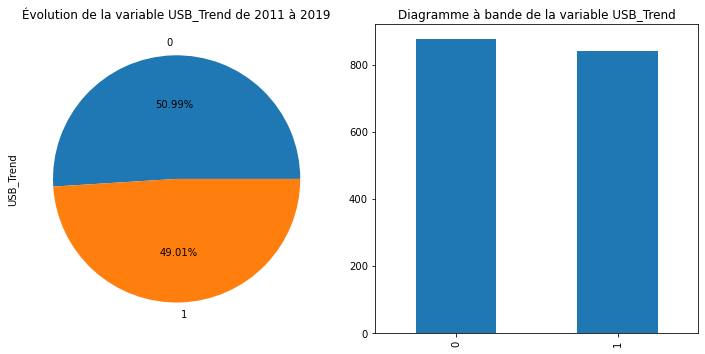

ÉTUDE DE LA VARIABLE "PLT_Trend"


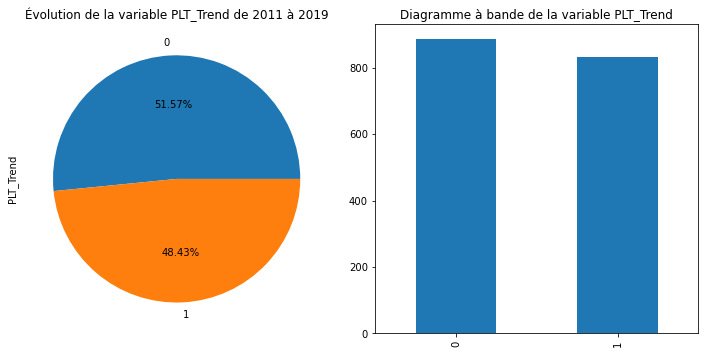

ÉTUDE DE LA VARIABLE "PLD_Trend"


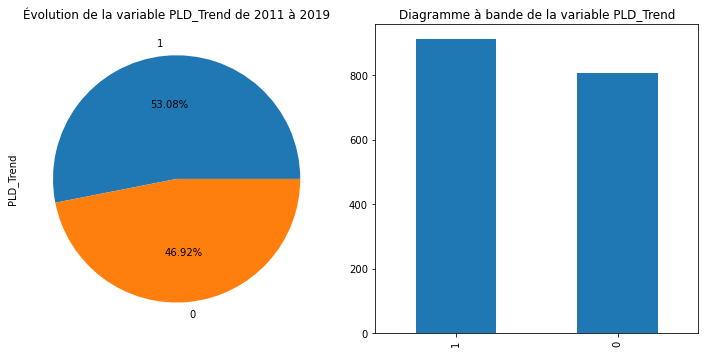

ÉTUDE DE LA VARIABLE "USDI_Trend"


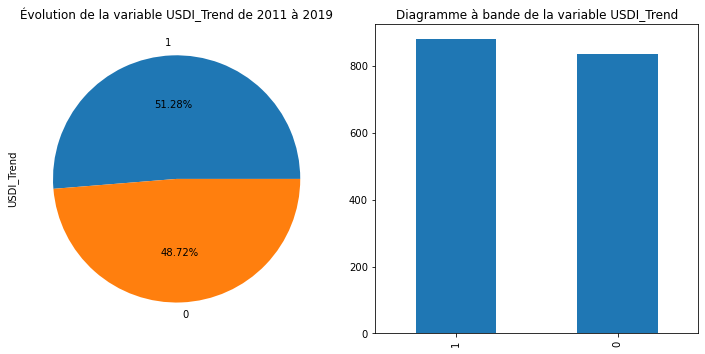

In [86]:
for i in features_list_trend:    
    print("="*110)
    print(f'ÉTUDE DE LA VARIABLE "{i}"')

    #Représentation graphique de l'évolution d'une variable au cours du temps
    plt.subplot(121)
    df[i].value_counts(normalize=True).plot(kind='pie',autopct= "%1.2f%%",figsize = (10,5))
    plt.title(f'Évolution de la variable {i} de 2011 à 2019')

    #Boîte à moustache d'une variable
    plt.subplot(122)
    plt.title(f'Diagramme à bande de la variable {i}')
    df[i].value_counts().plot.bar()
    
    plt.tight_layout()
    plt.show()

### g) Visualisation des relations : features/target

Pour visualiser et comprendre les relations feature/target il nous faudra:
<br> -tracer les graphiques de comparaison deux-à-deux (courbe comparative, nuage de points);
<br> -déterminer le coefficient de de correlation linéaire entre chaque 'feature' et la 'target'

##### Tracé des graphiques de comparaison deux-à-deux (courbe comparative, nuage de points)

VISUALISATION DE LA RELATION: Open / Adj Closed


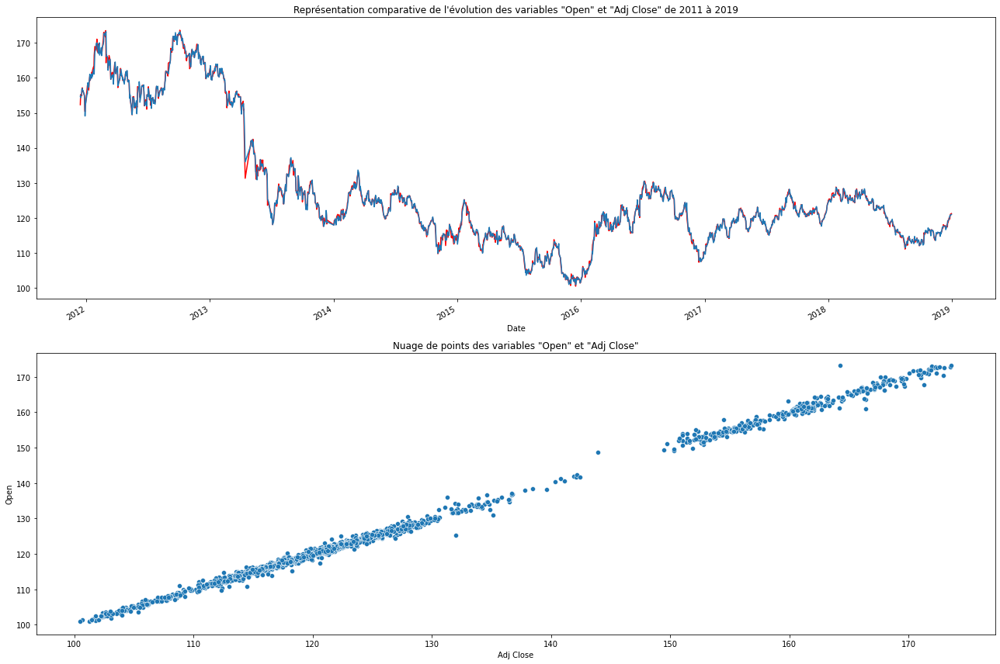

VISUALISATION DE LA RELATION: High / Adj Closed


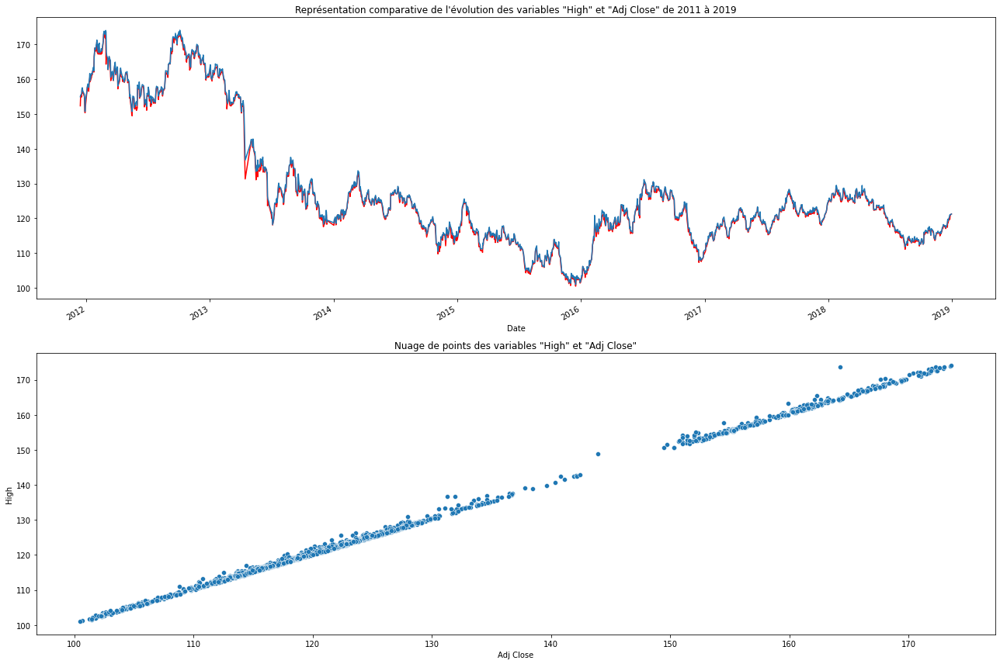

VISUALISATION DE LA RELATION: Low / Adj Closed


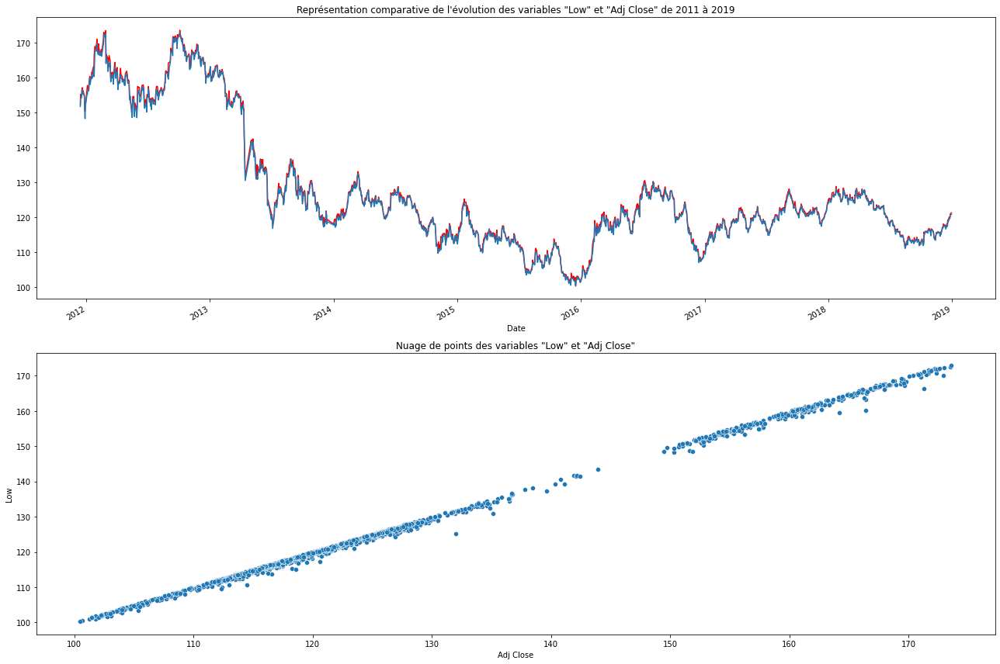

VISUALISATION DE LA RELATION: Close / Adj Closed


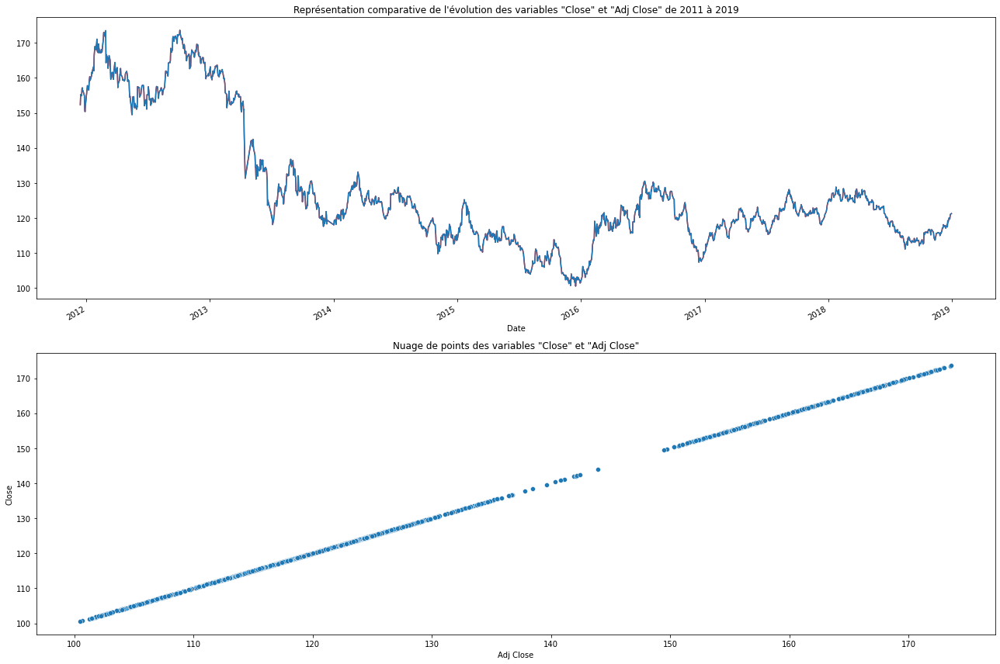

VISUALISATION DE LA RELATION: Volume / Adj Closed


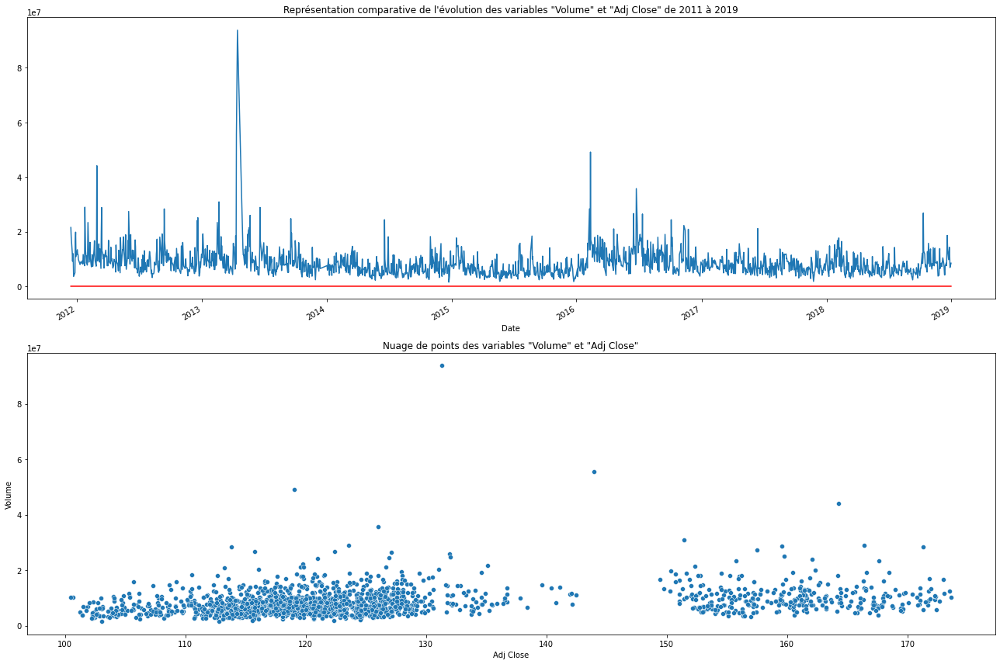

VISUALISATION DE LA RELATION: SP_open / Adj Closed


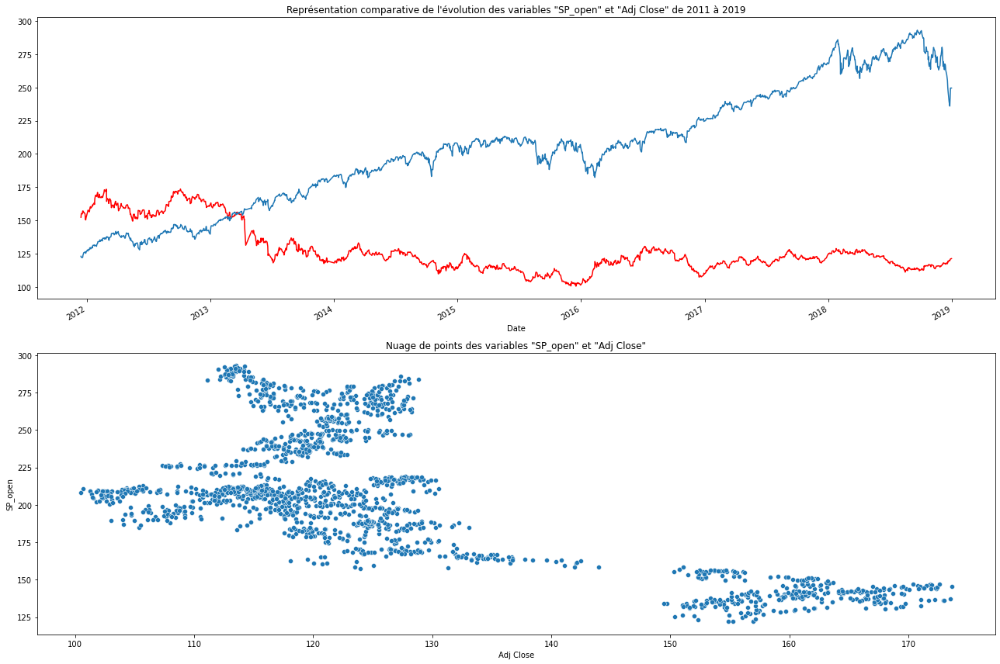

VISUALISATION DE LA RELATION: SP_high / Adj Closed


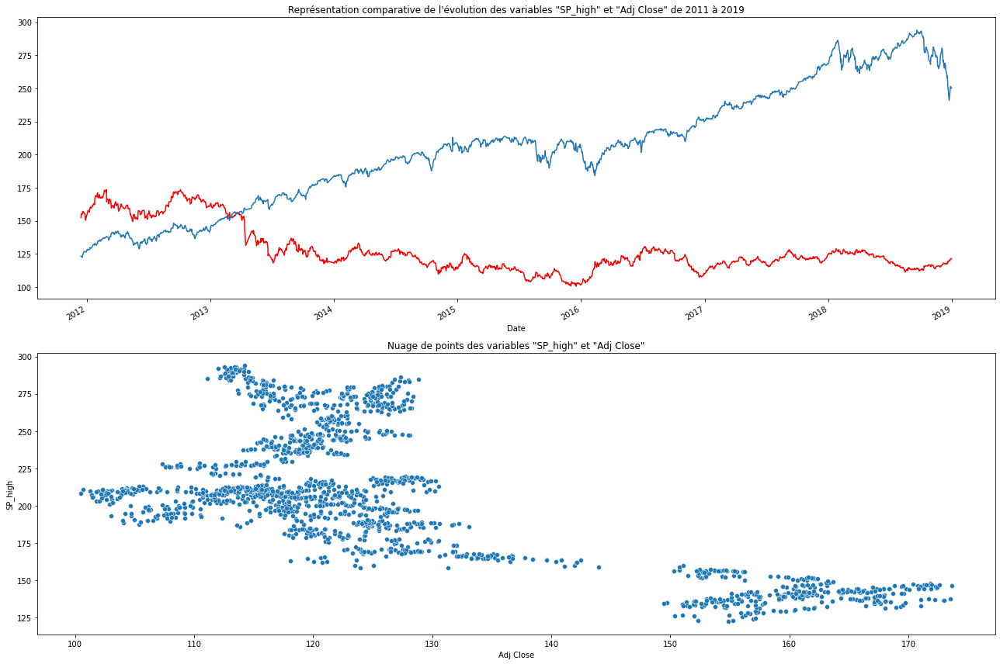

VISUALISATION DE LA RELATION: SP_low / Adj Closed


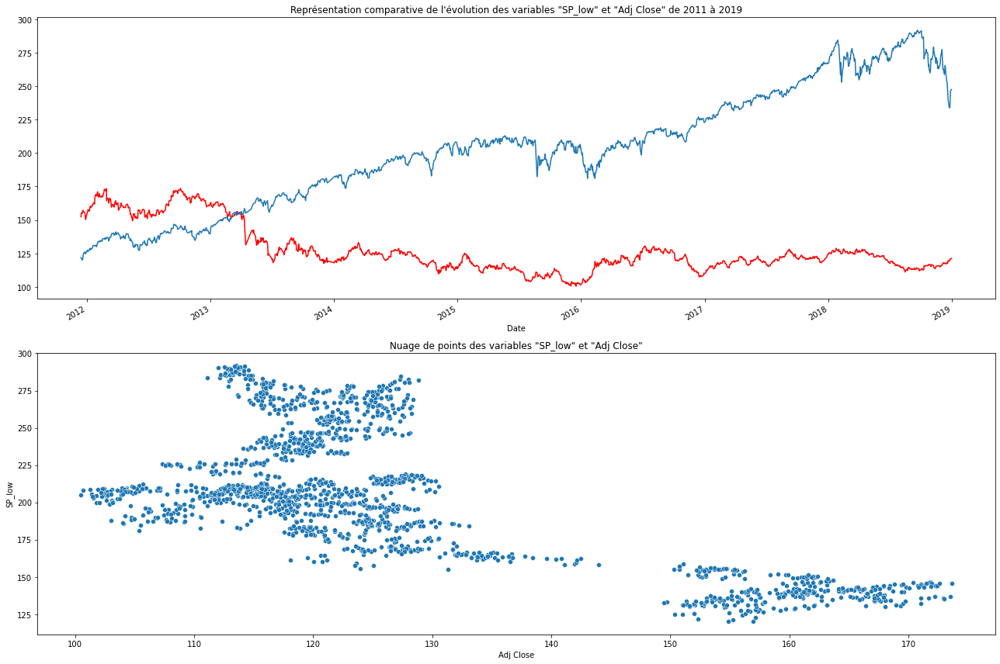

VISUALISATION DE LA RELATION: SP_close / Adj Closed


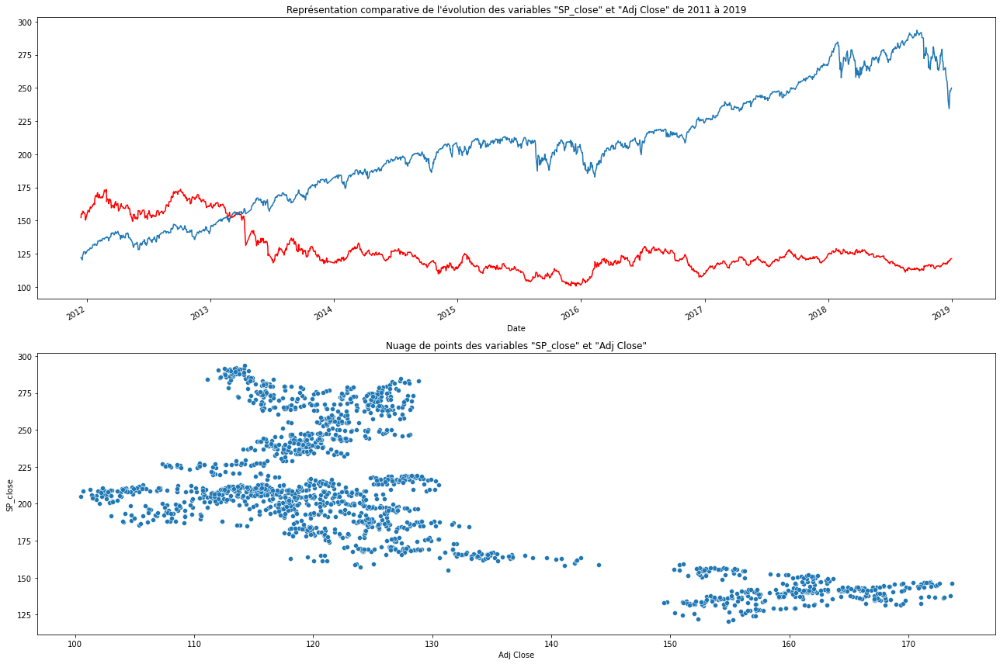

VISUALISATION DE LA RELATION: SP_Ajclose / Adj Closed


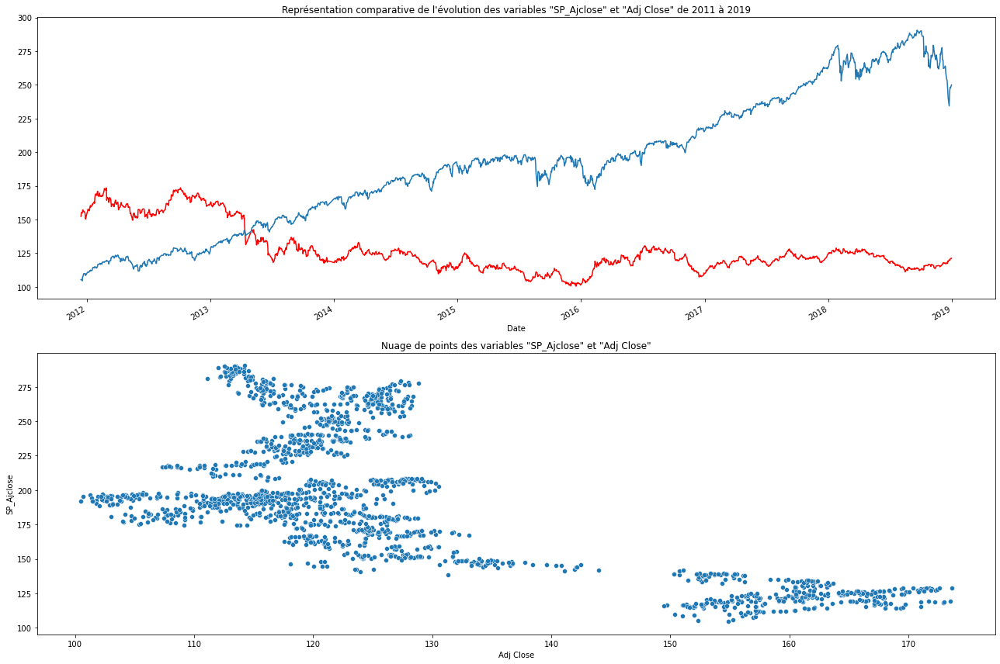

VISUALISATION DE LA RELATION: SP_volume / Adj Closed


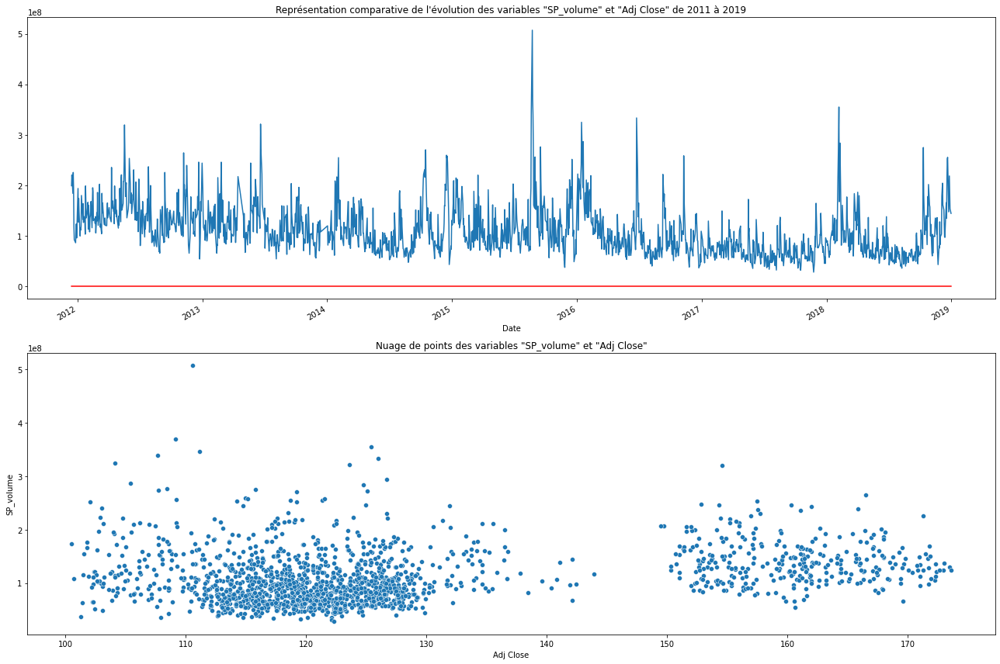

VISUALISATION DE LA RELATION: DJ_open / Adj Closed


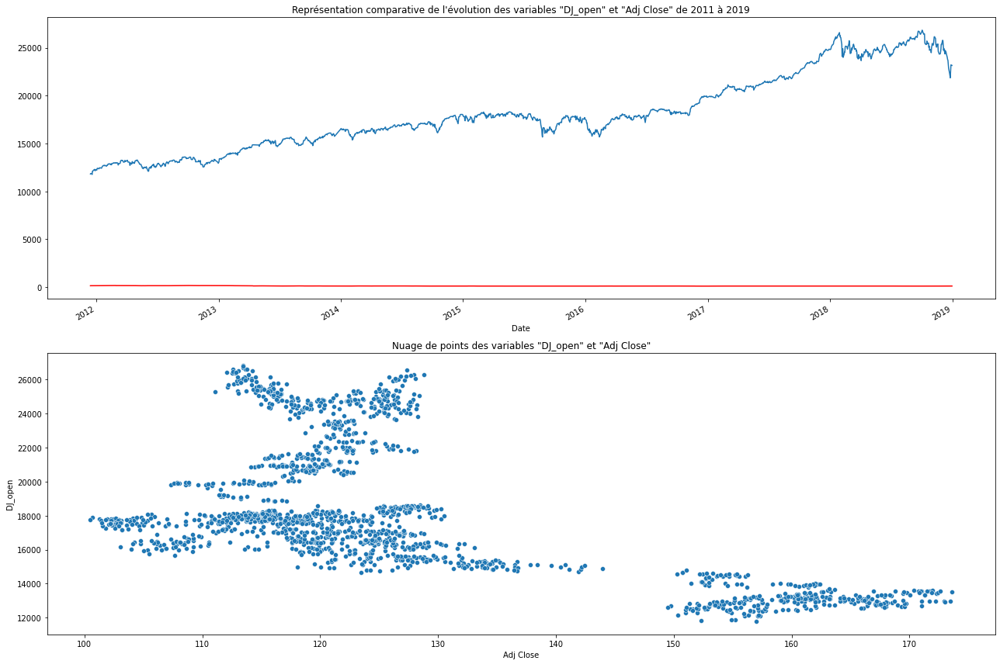

VISUALISATION DE LA RELATION: DJ_high / Adj Closed


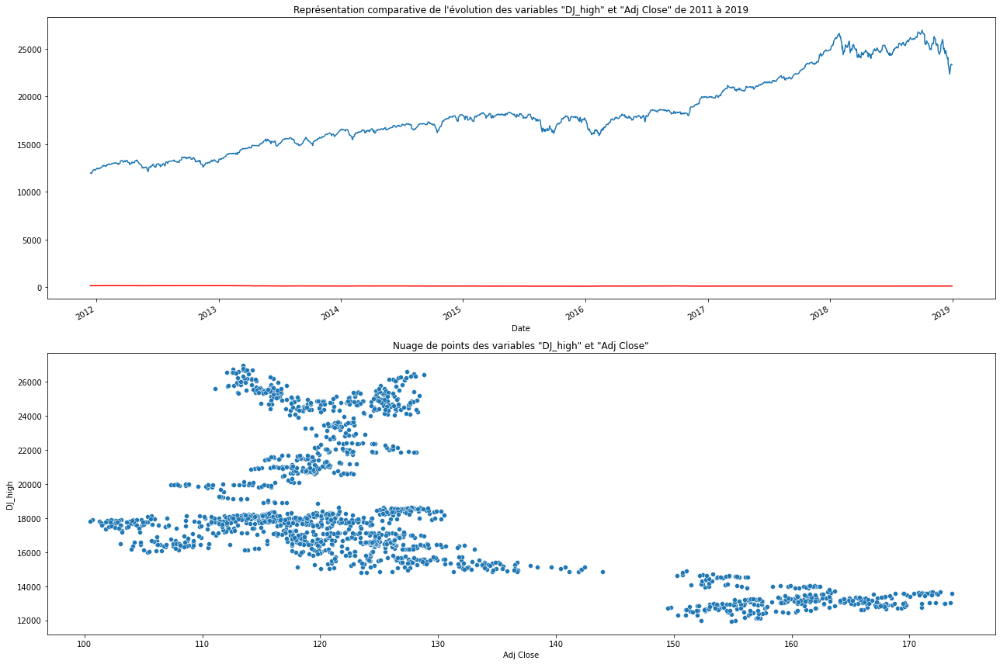

VISUALISATION DE LA RELATION: DJ_low / Adj Closed


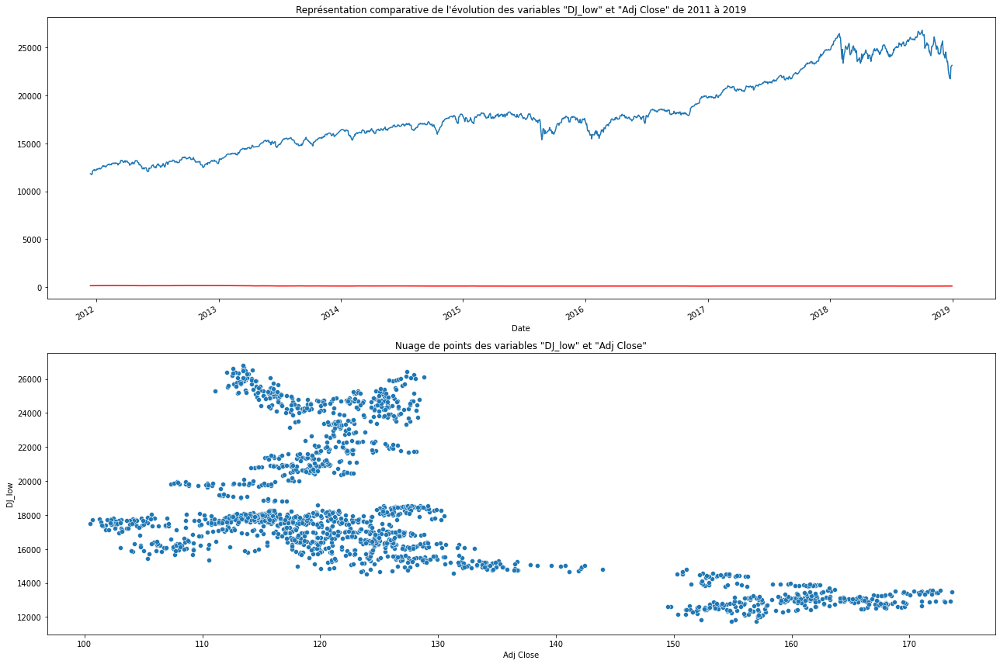

VISUALISATION DE LA RELATION: DJ_close / Adj Closed


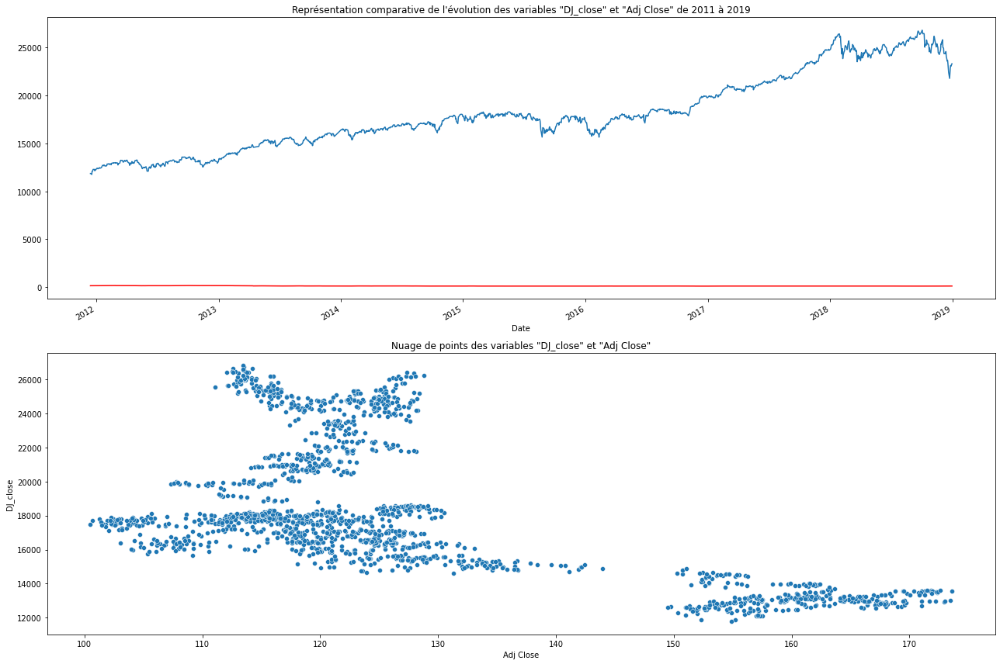

VISUALISATION DE LA RELATION: DJ_Ajclose / Adj Closed


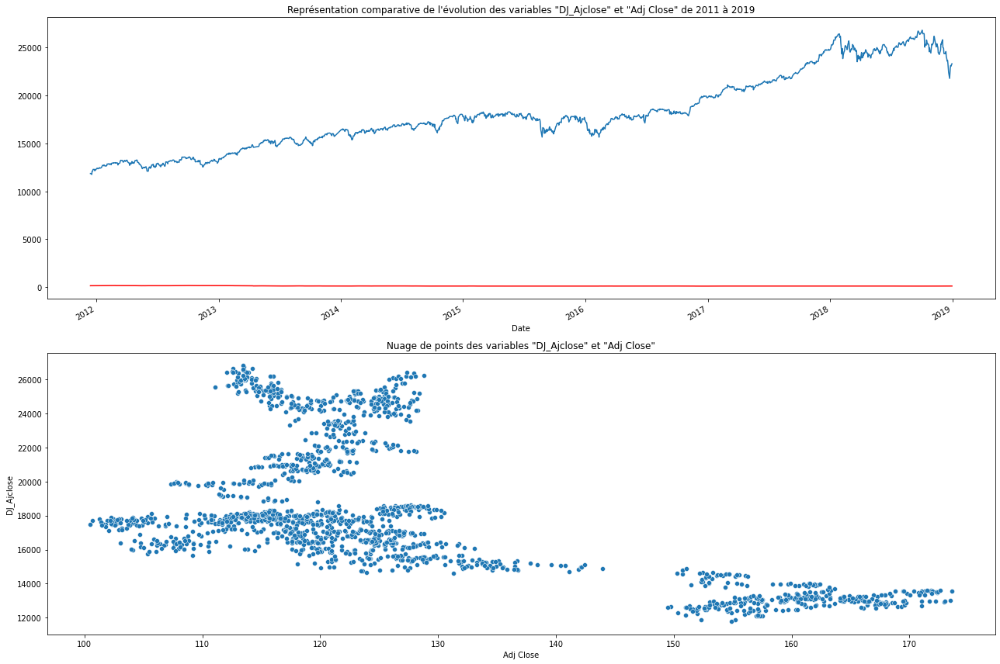

VISUALISATION DE LA RELATION: DJ_volume / Adj Closed


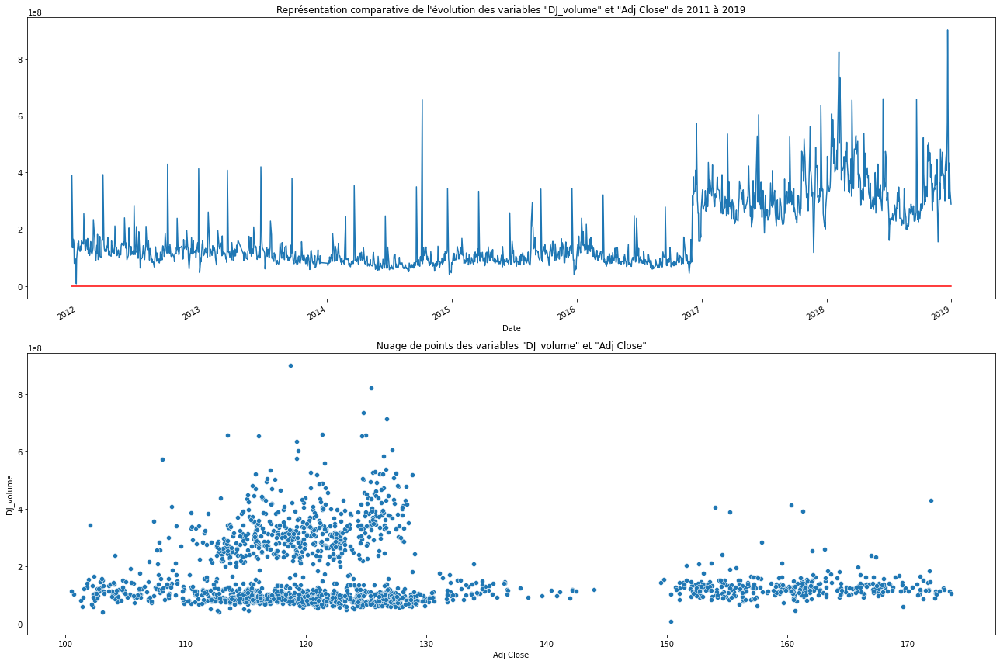

VISUALISATION DE LA RELATION: EG_open / Adj Closed


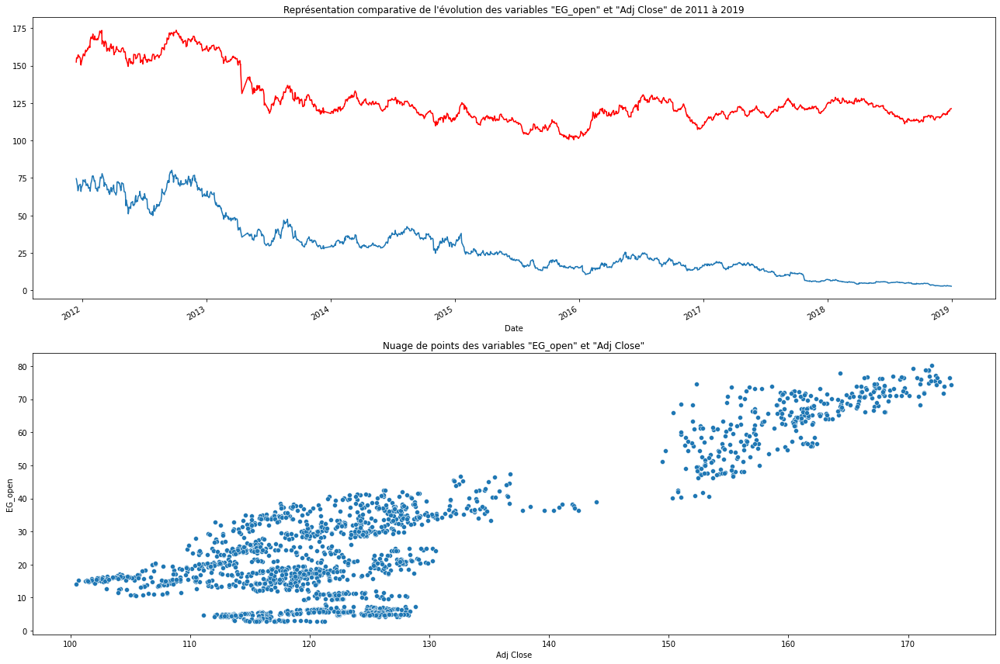

VISUALISATION DE LA RELATION: EG_high / Adj Closed


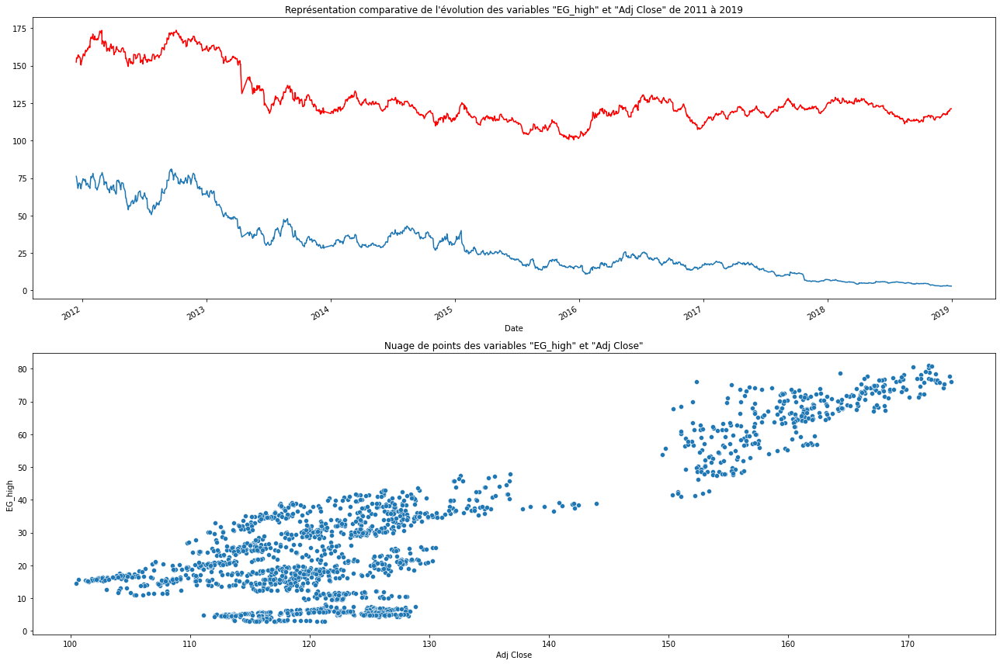

VISUALISATION DE LA RELATION: EG_low / Adj Closed


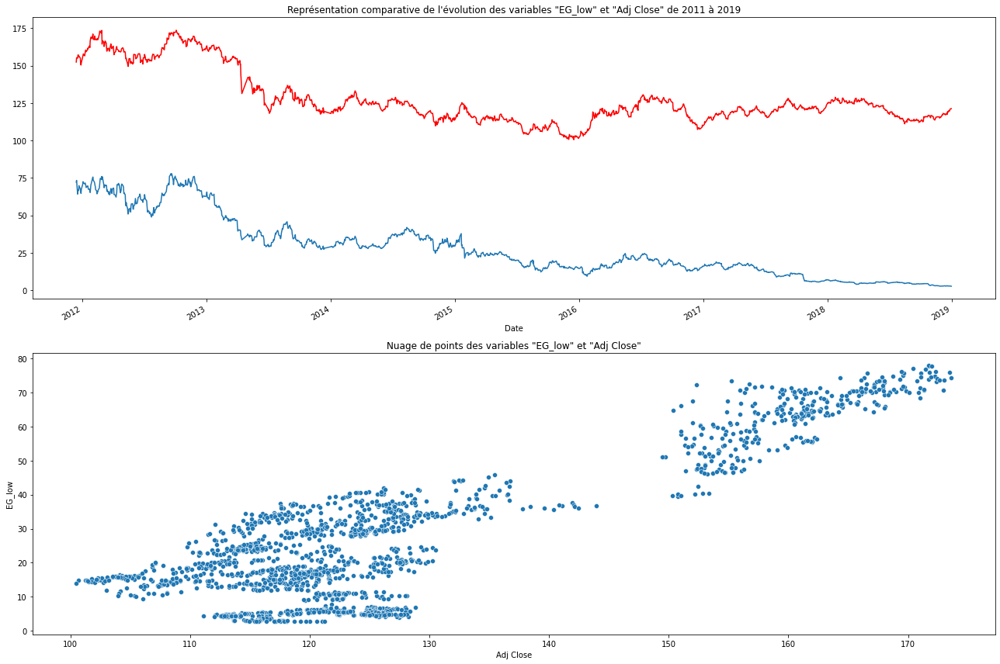

VISUALISATION DE LA RELATION: EG_close / Adj Closed


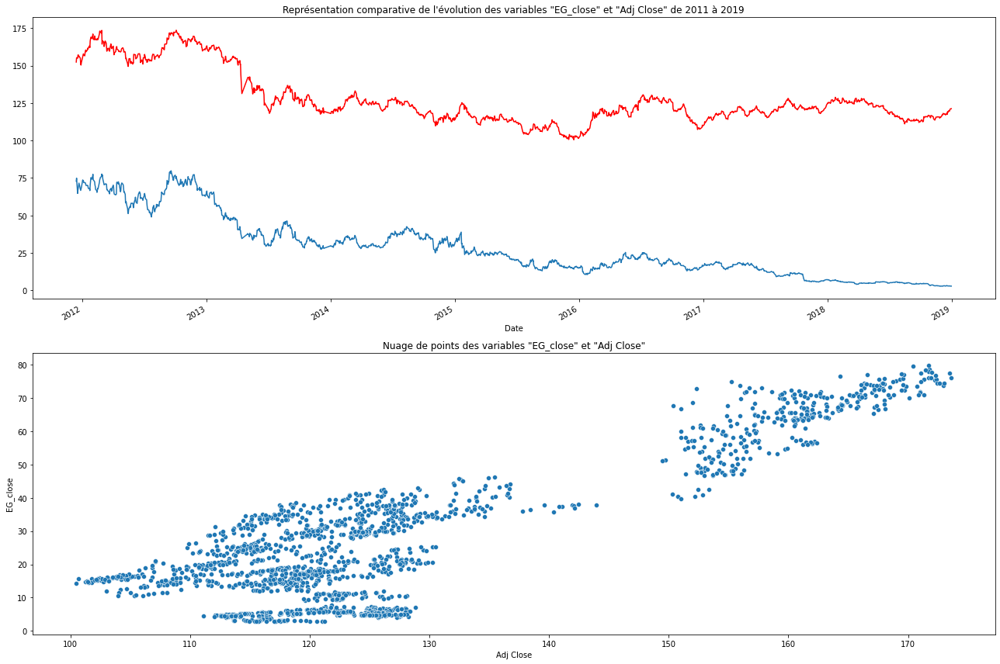

VISUALISATION DE LA RELATION: EG_Ajclose / Adj Closed


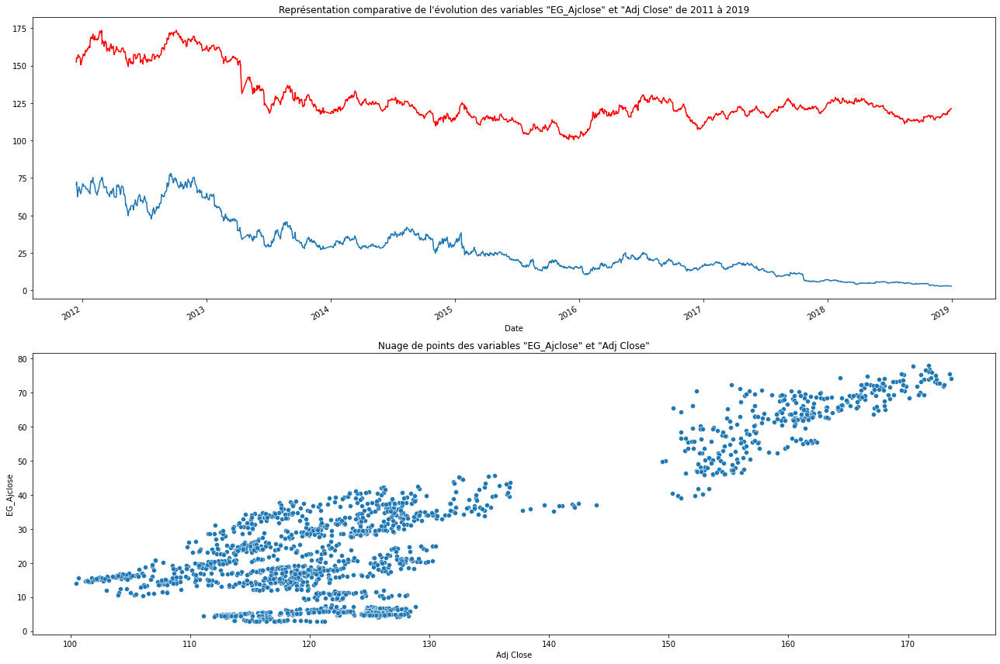

VISUALISATION DE LA RELATION: EG_volume / Adj Closed


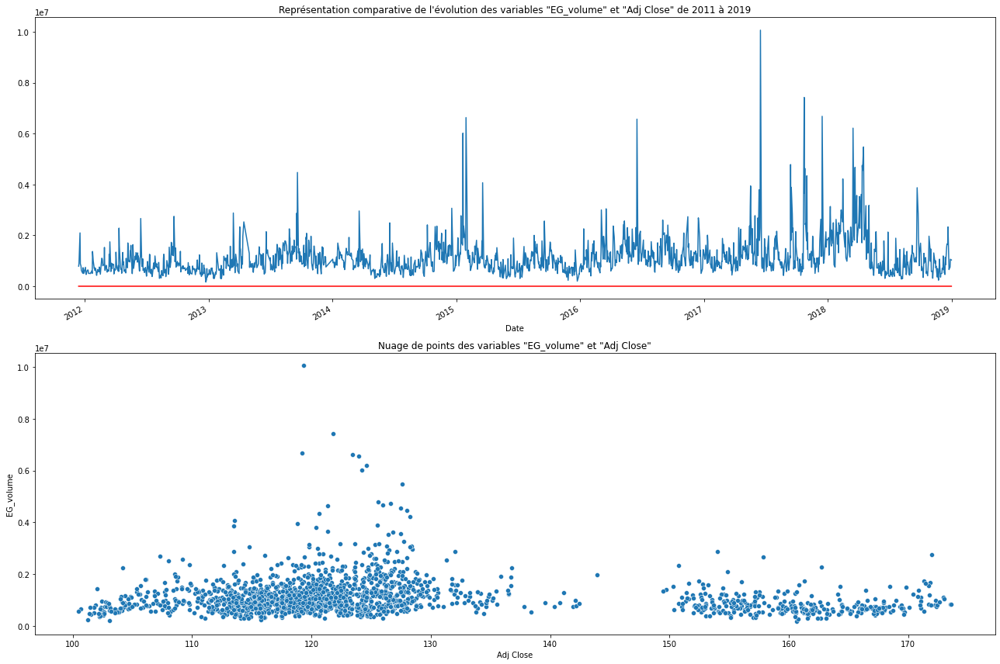

VISUALISATION DE LA RELATION: EU_Price / Adj Closed


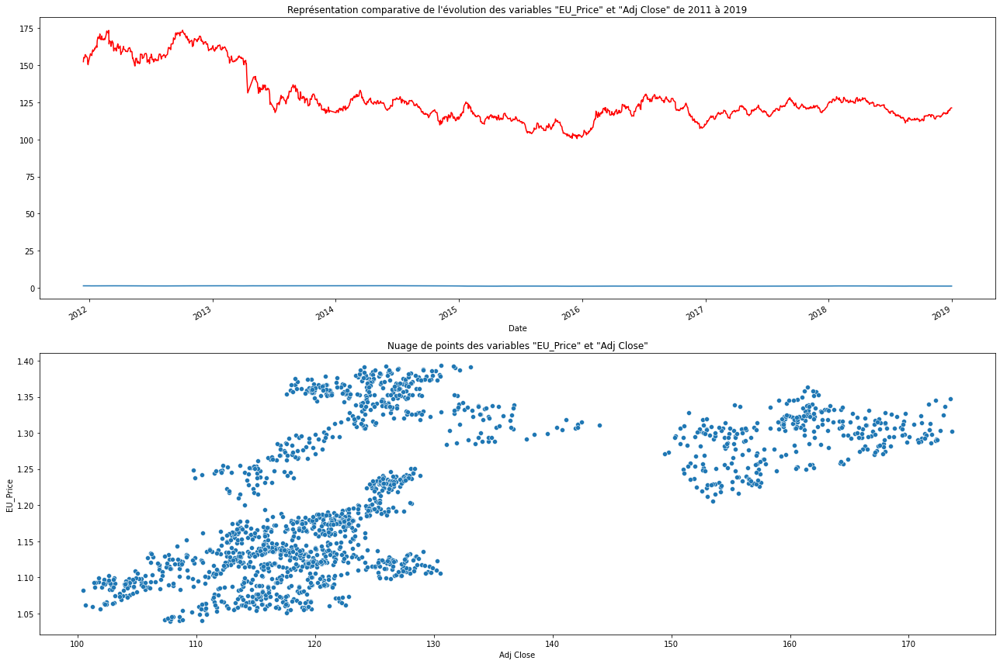

VISUALISATION DE LA RELATION: EU_open / Adj Closed


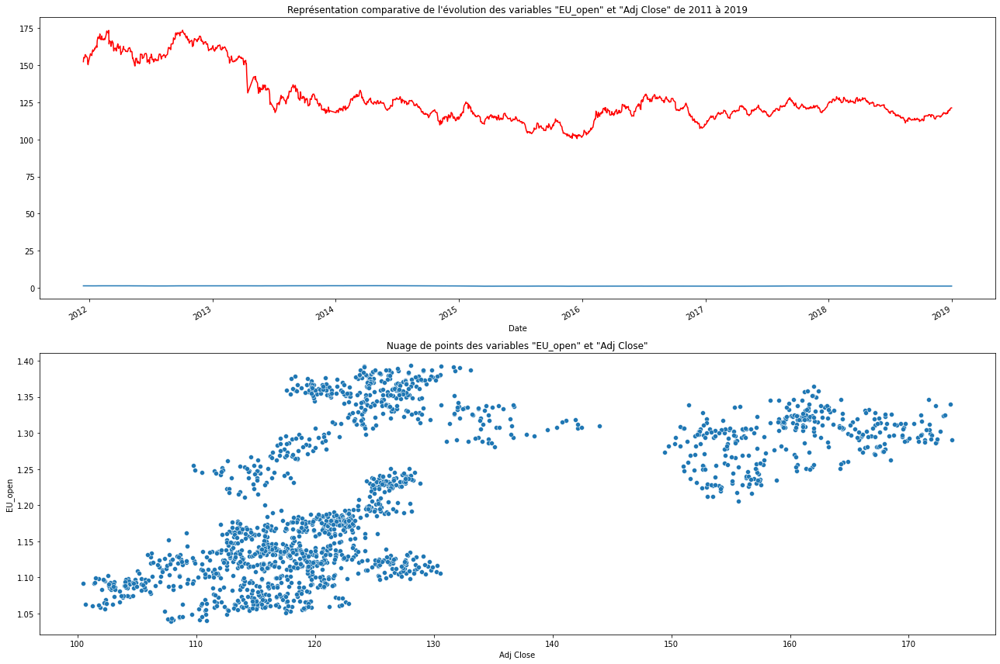

VISUALISATION DE LA RELATION: EU_high / Adj Closed


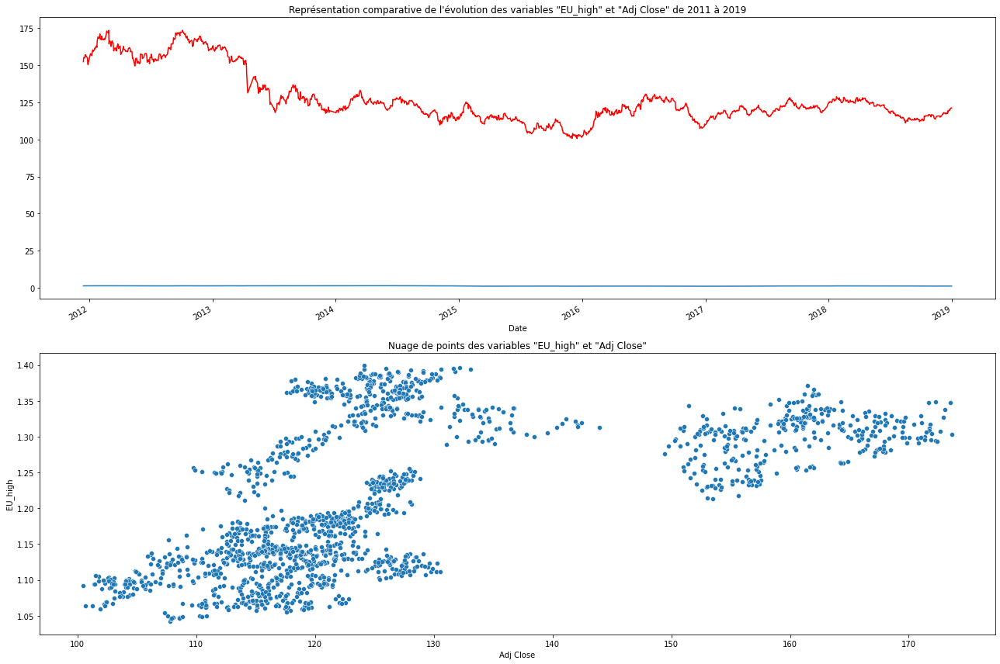

VISUALISATION DE LA RELATION: EU_low / Adj Closed


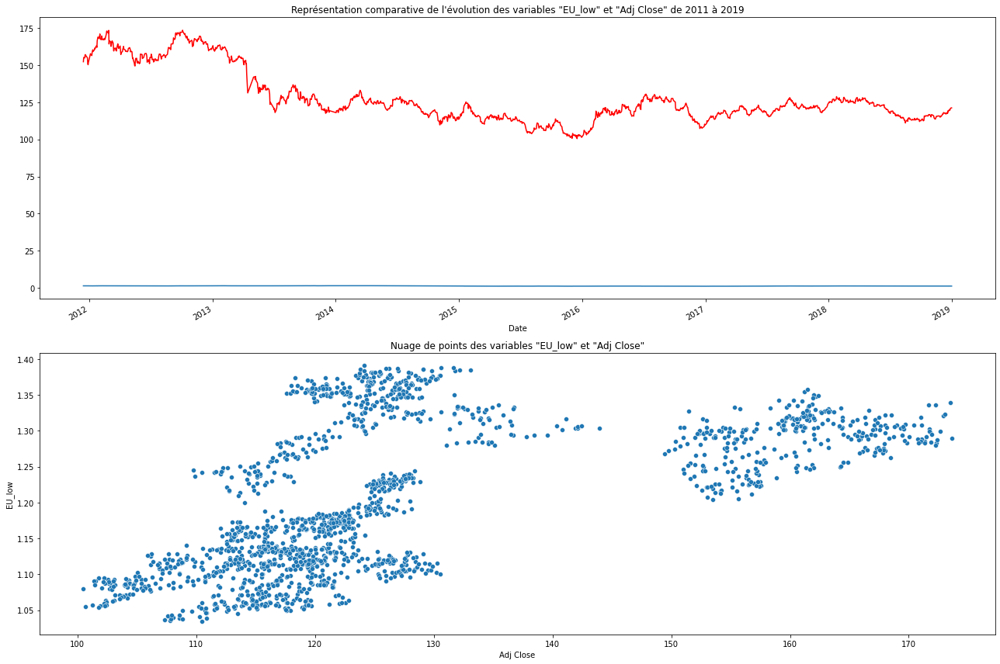

VISUALISATION DE LA RELATION: OF_Price / Adj Closed


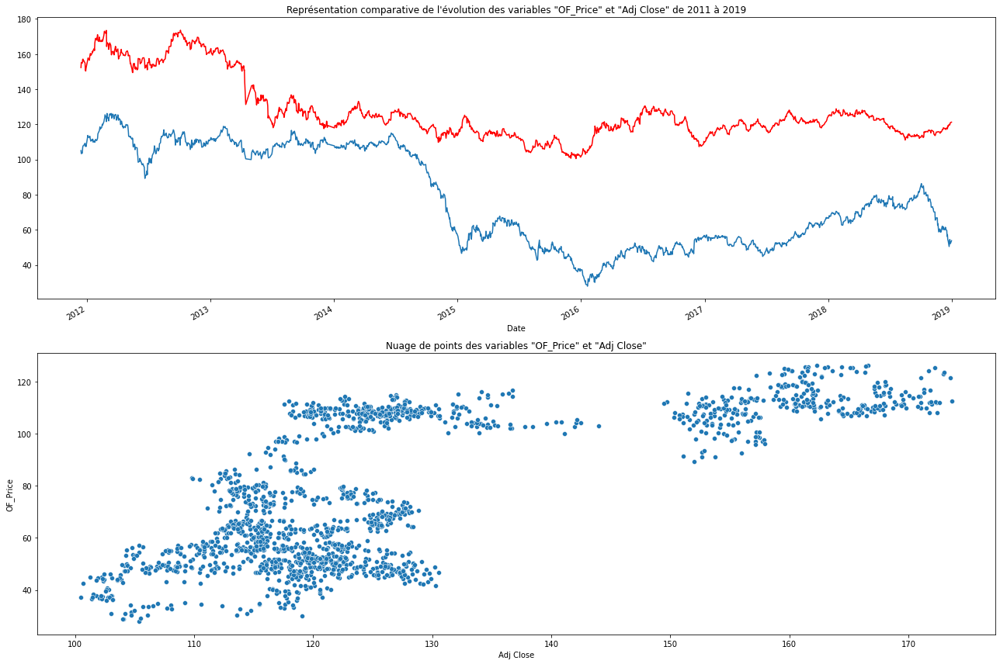

VISUALISATION DE LA RELATION: OF_Open / Adj Closed


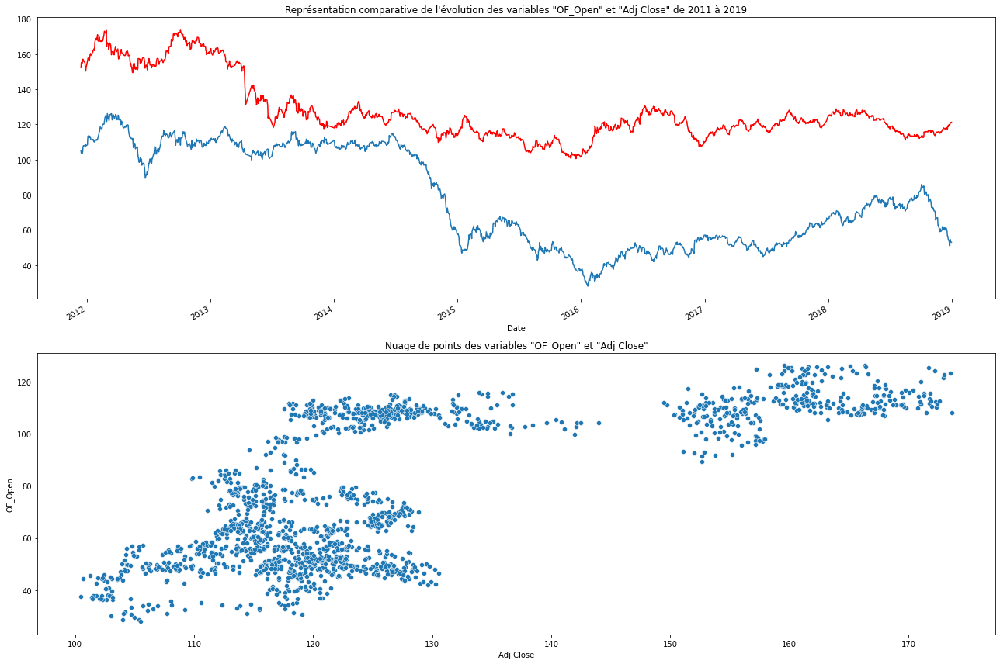

VISUALISATION DE LA RELATION: OF_High / Adj Closed


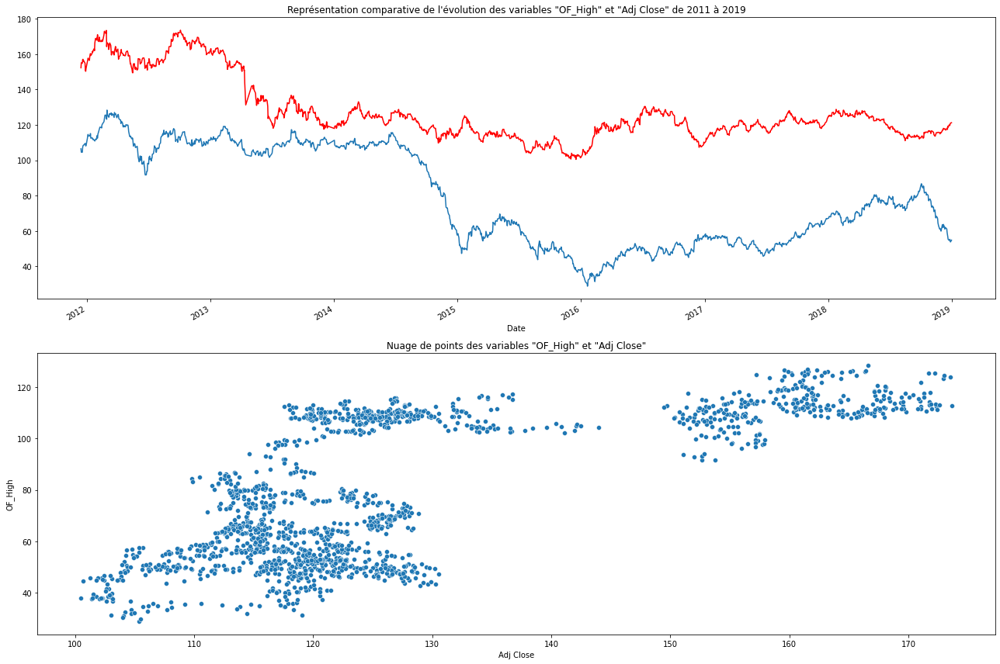

VISUALISATION DE LA RELATION: OF_Low / Adj Closed


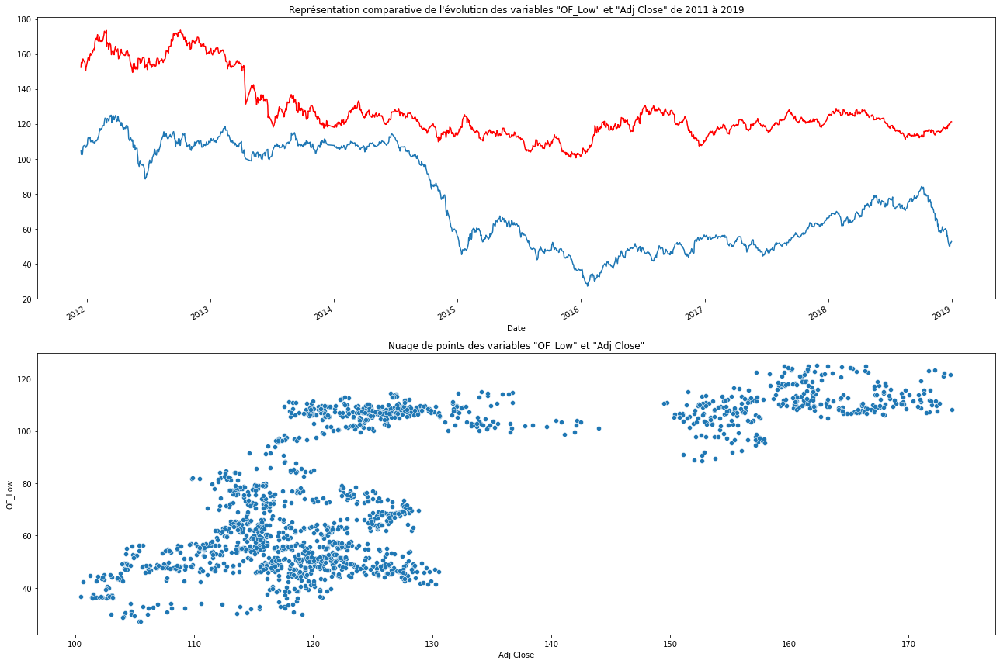

VISUALISATION DE LA RELATION: OF_Volume / Adj Closed


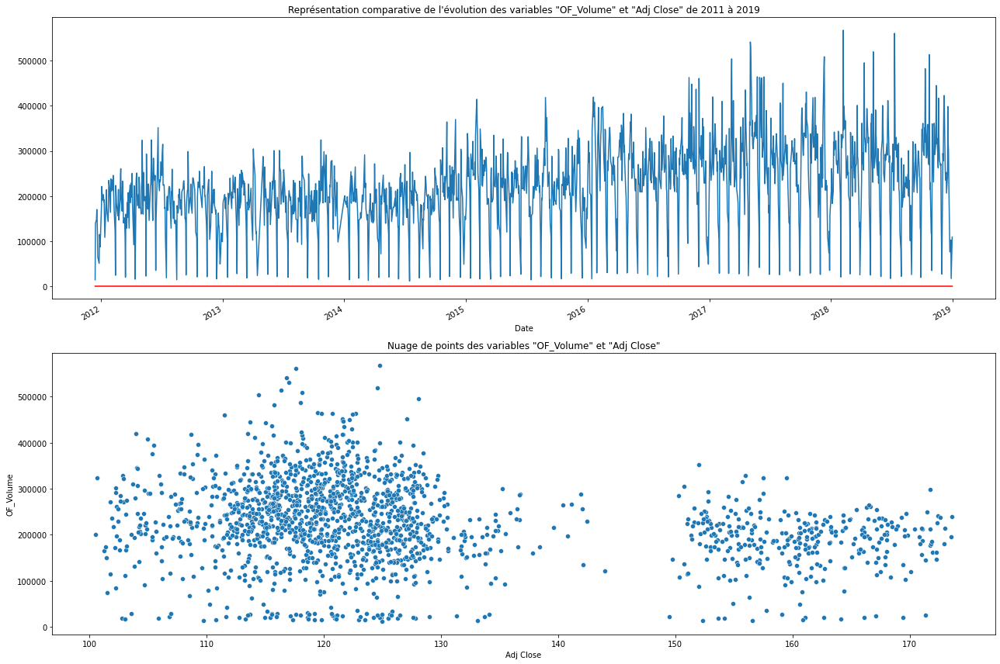

VISUALISATION DE LA RELATION: OS_Price / Adj Closed


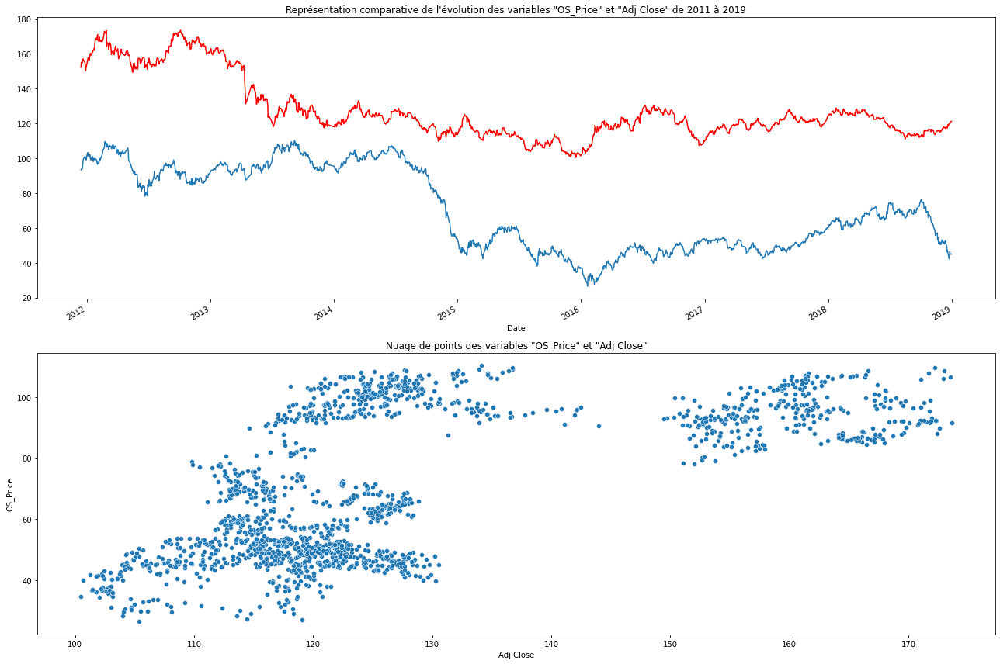

VISUALISATION DE LA RELATION: OS_Open / Adj Closed


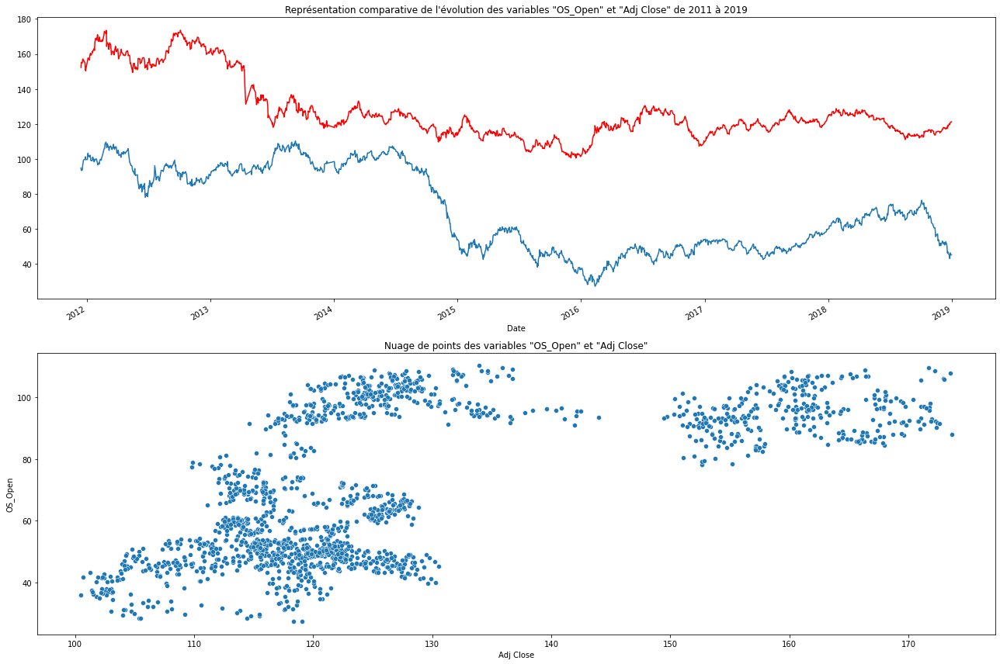

VISUALISATION DE LA RELATION: OS_High / Adj Closed


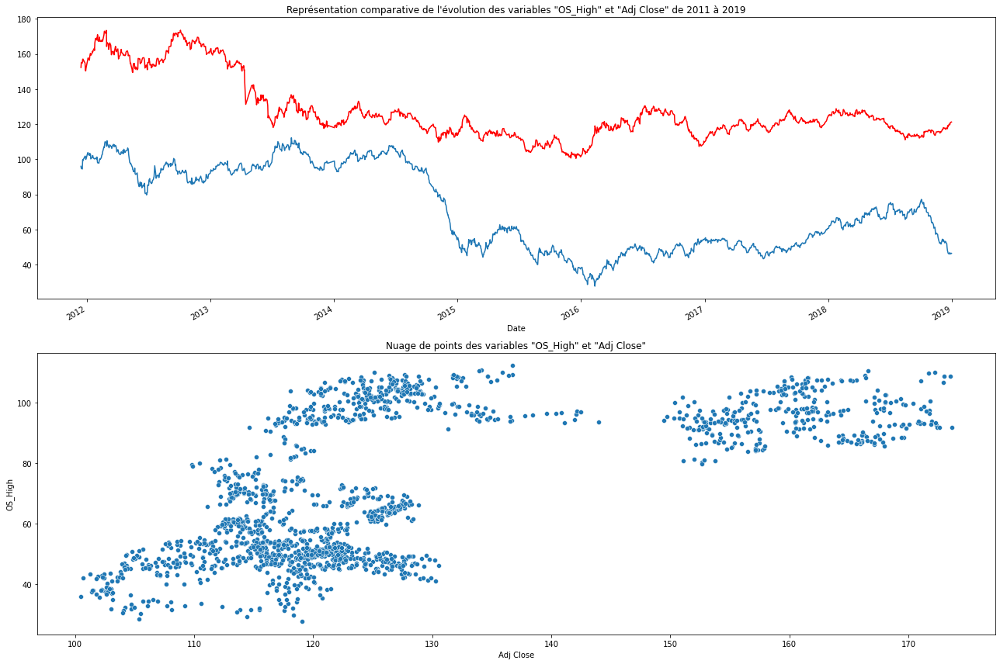

VISUALISATION DE LA RELATION: OS_Low / Adj Closed


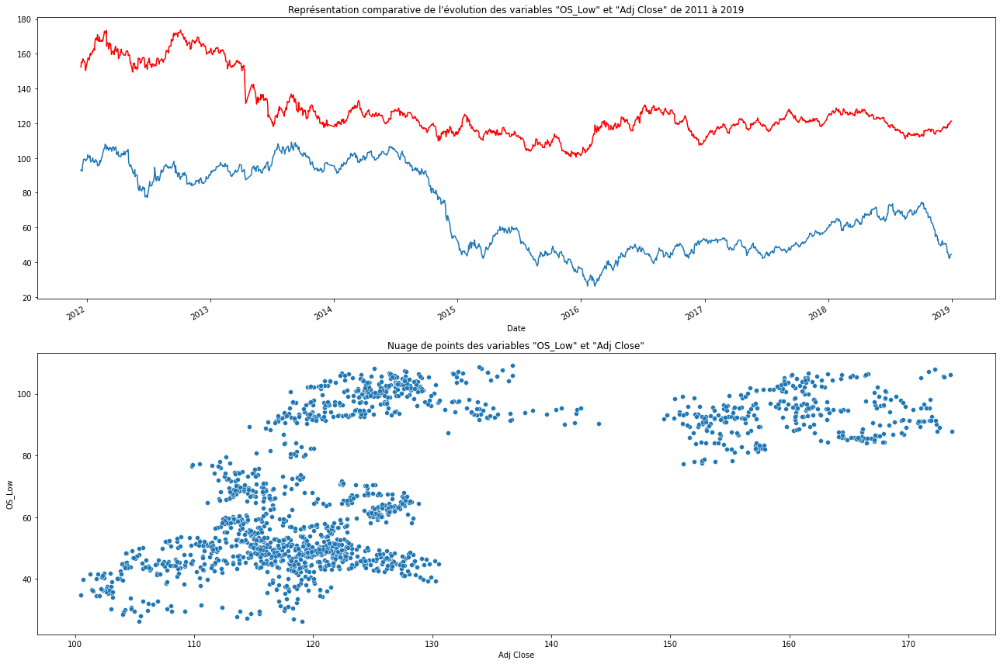

VISUALISATION DE LA RELATION: SF_Price / Adj Closed


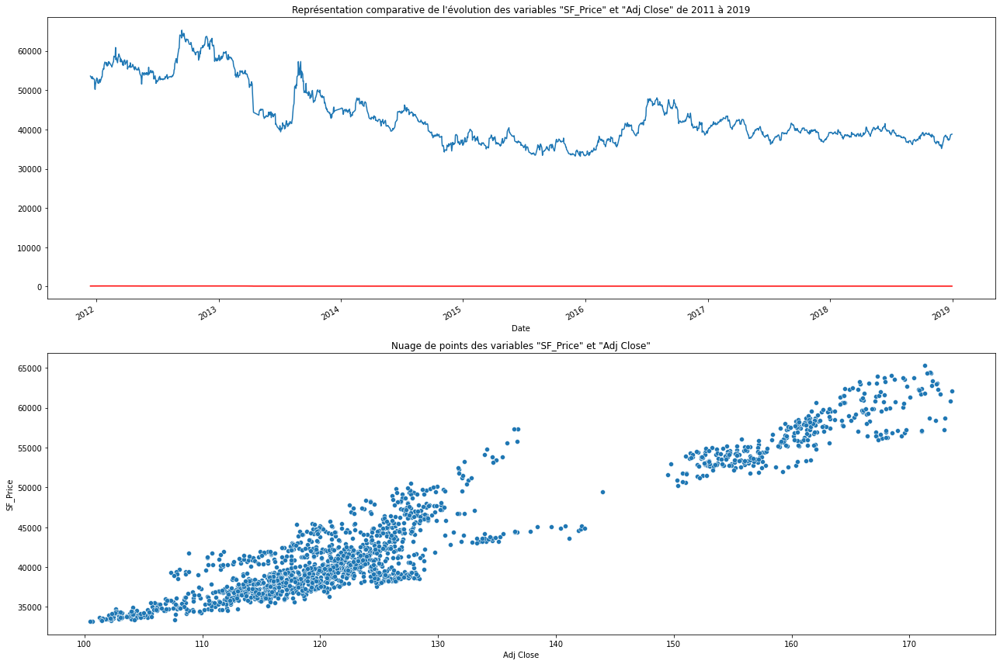

VISUALISATION DE LA RELATION: SF_Open / Adj Closed


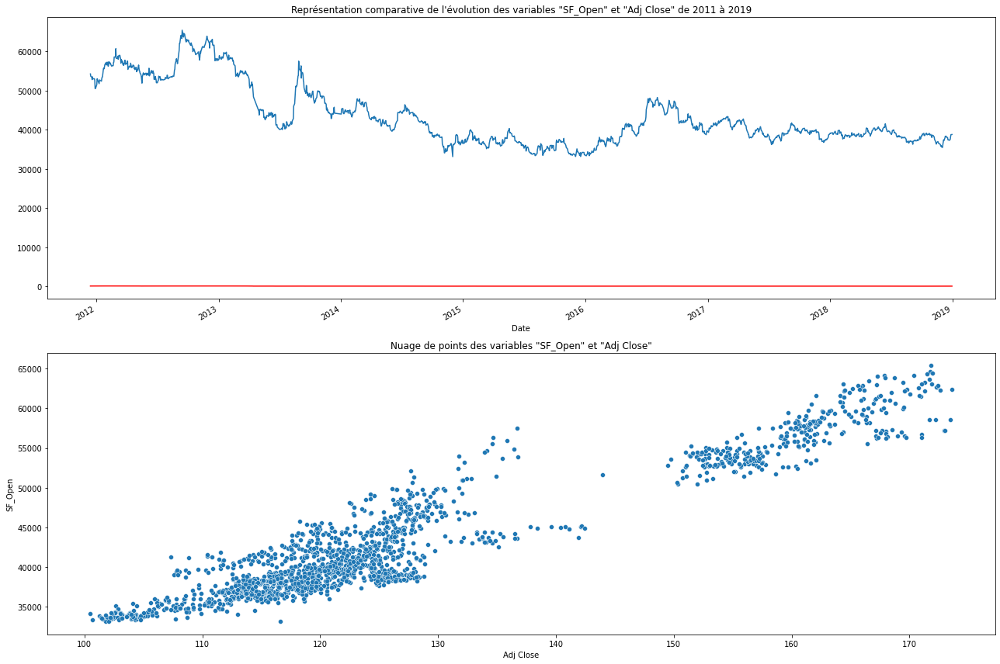

VISUALISATION DE LA RELATION: SF_High / Adj Closed


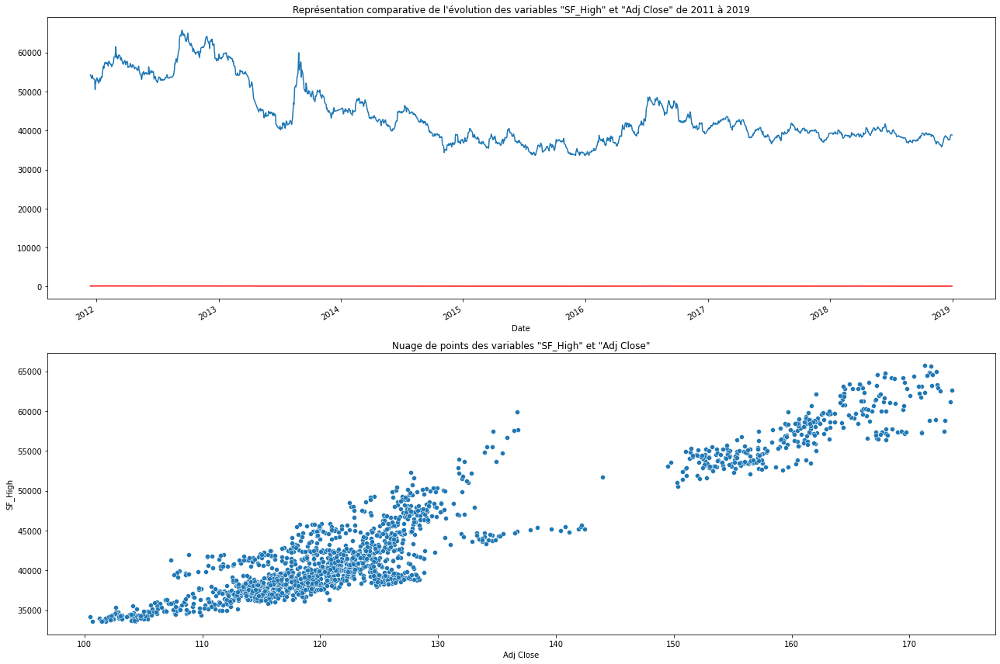

VISUALISATION DE LA RELATION: SF_Low / Adj Closed


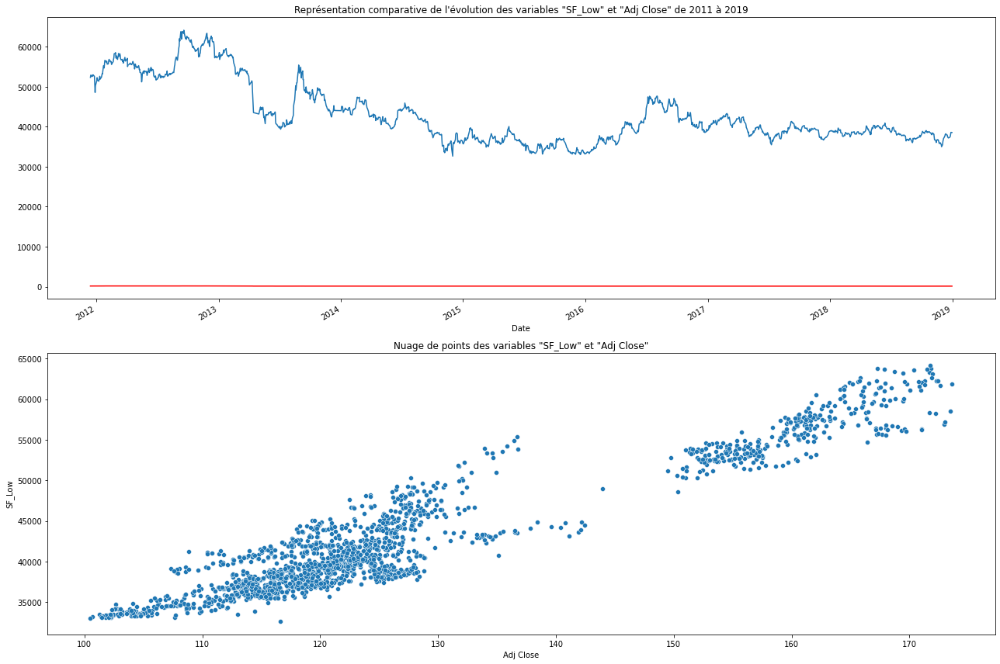

VISUALISATION DE LA RELATION: SF_Volume / Adj Closed


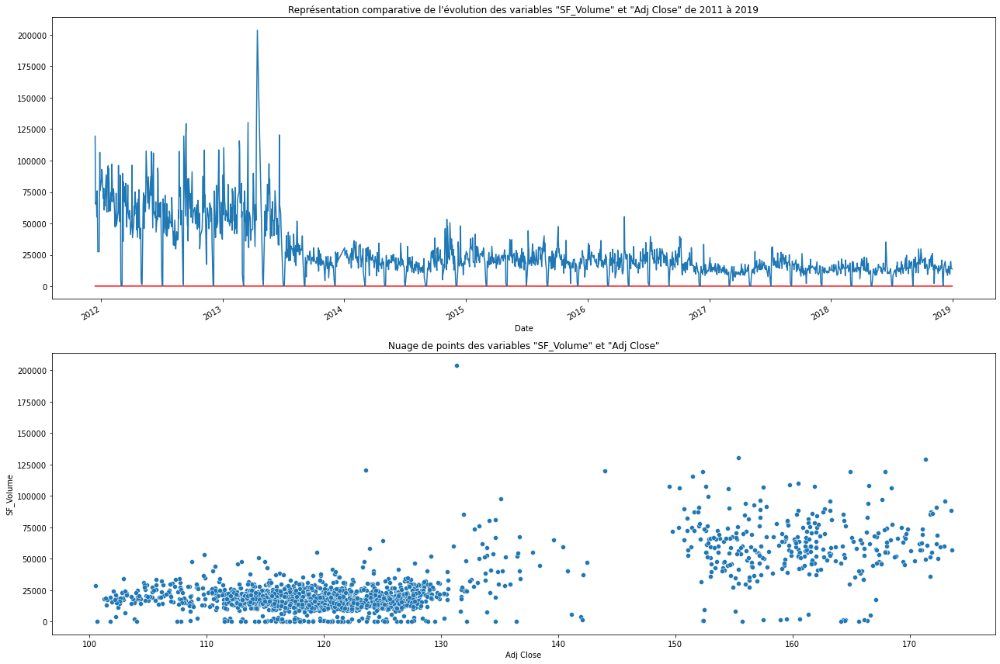

VISUALISATION DE LA RELATION: USB_Price / Adj Closed


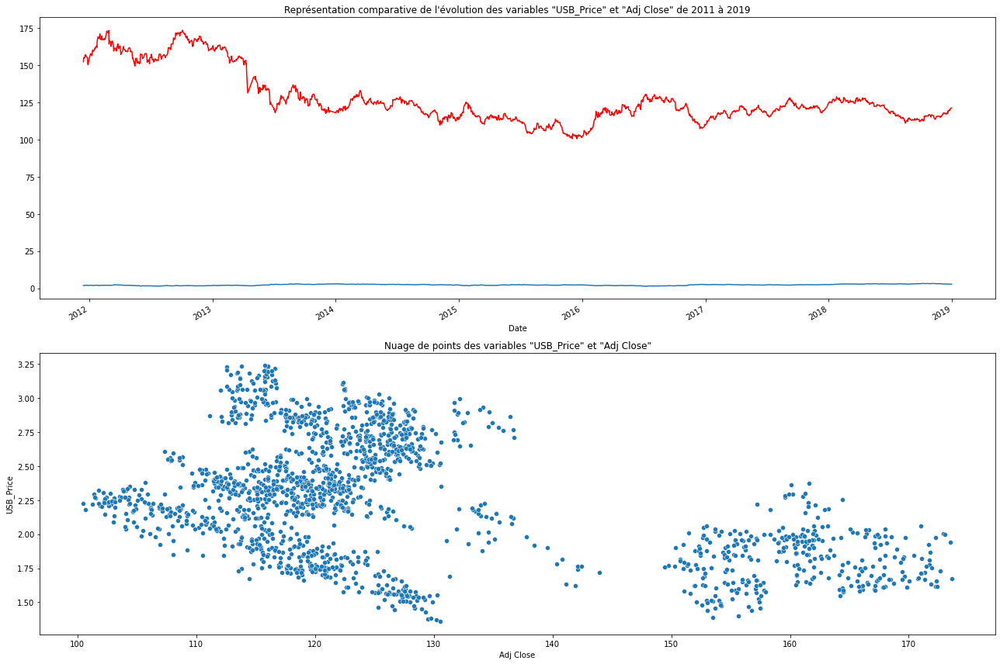

VISUALISATION DE LA RELATION: USB_Open / Adj Closed


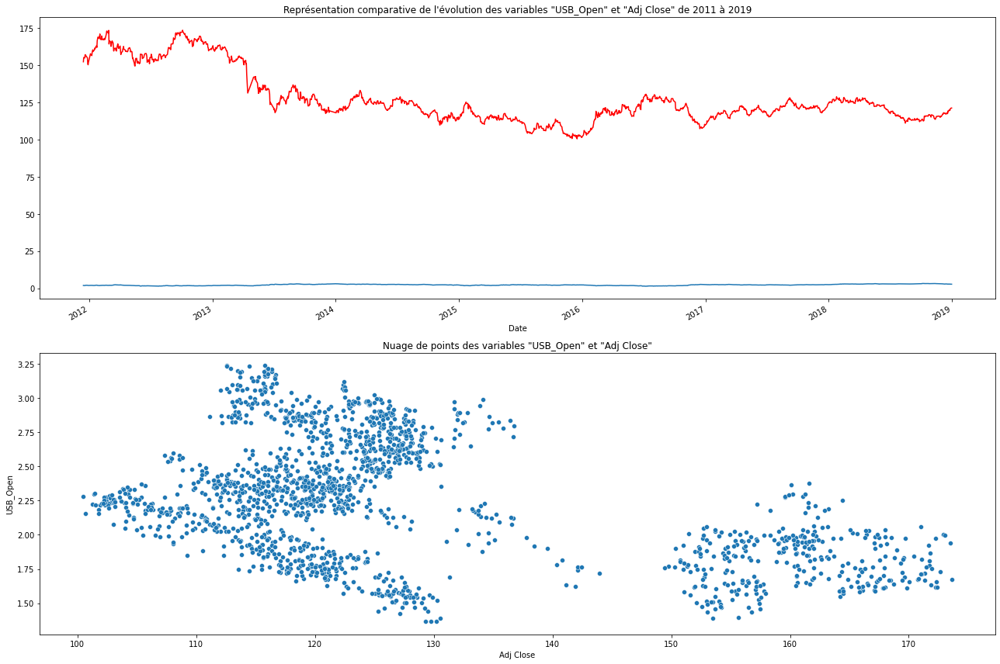

VISUALISATION DE LA RELATION: USB_High / Adj Closed


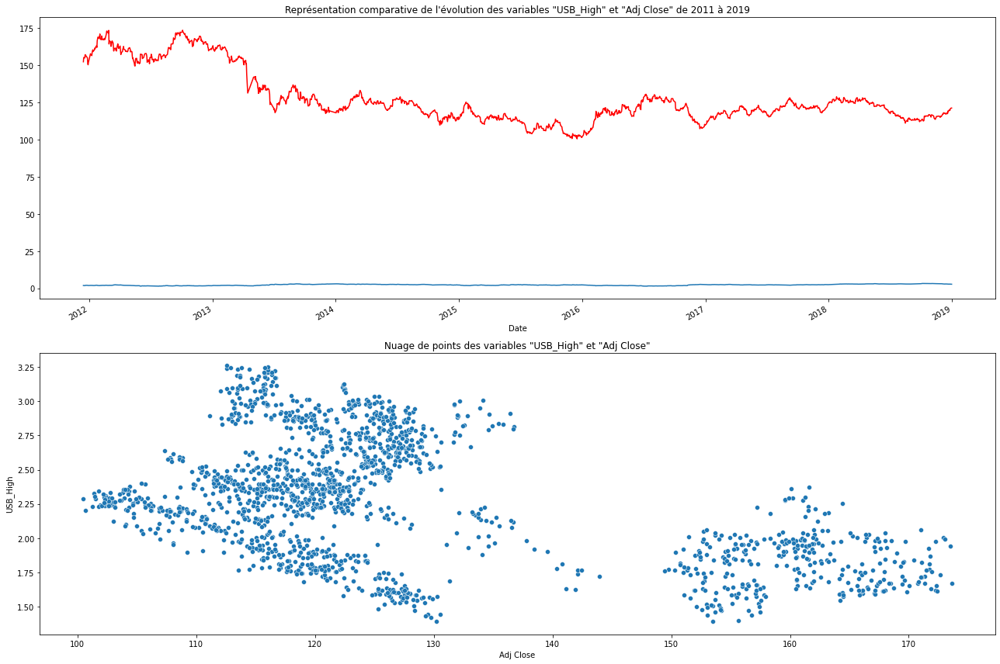

VISUALISATION DE LA RELATION: USB_Low / Adj Closed


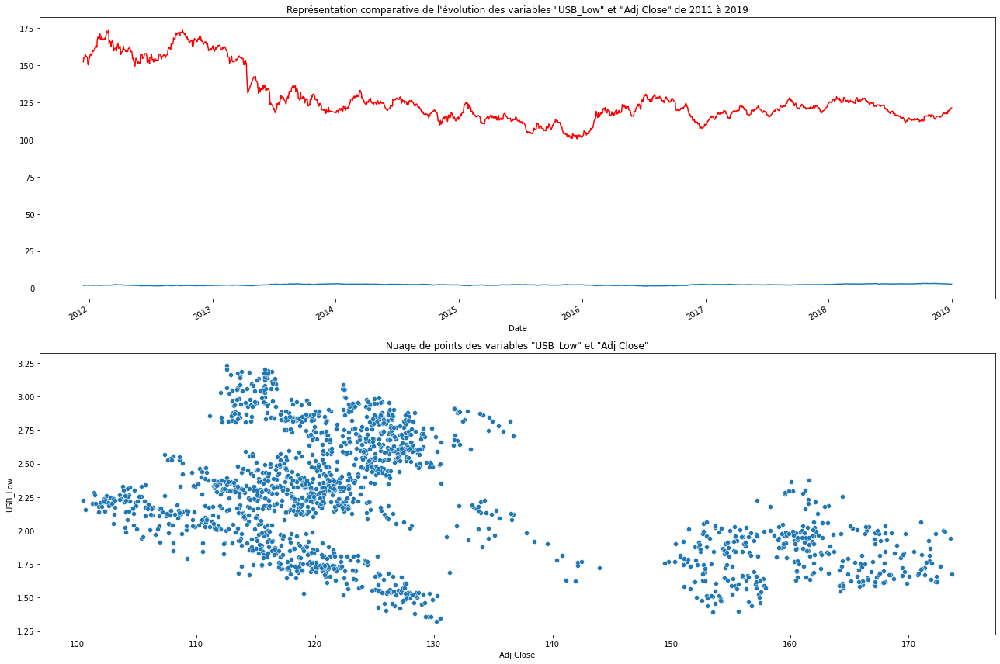

VISUALISATION DE LA RELATION: PLT_Price / Adj Closed


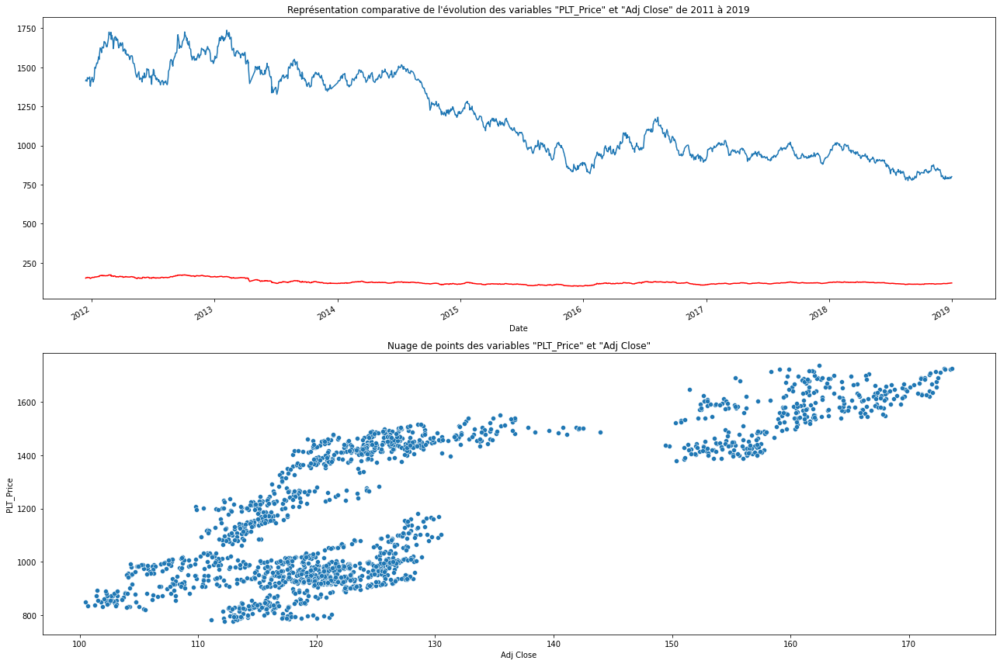

VISUALISATION DE LA RELATION: PLT_Open / Adj Closed


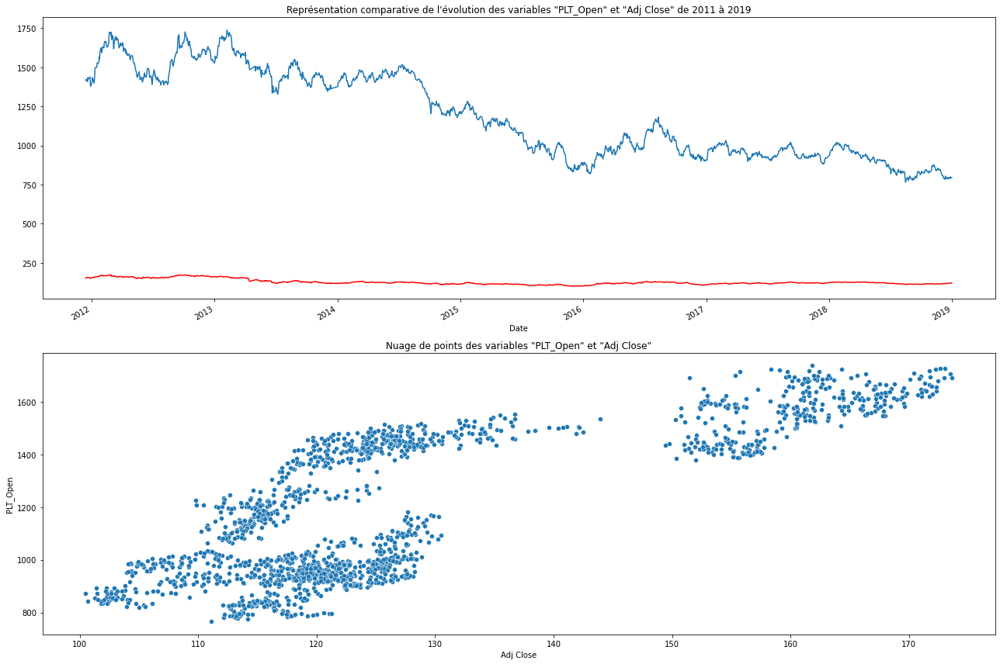

VISUALISATION DE LA RELATION: PLT_High / Adj Closed


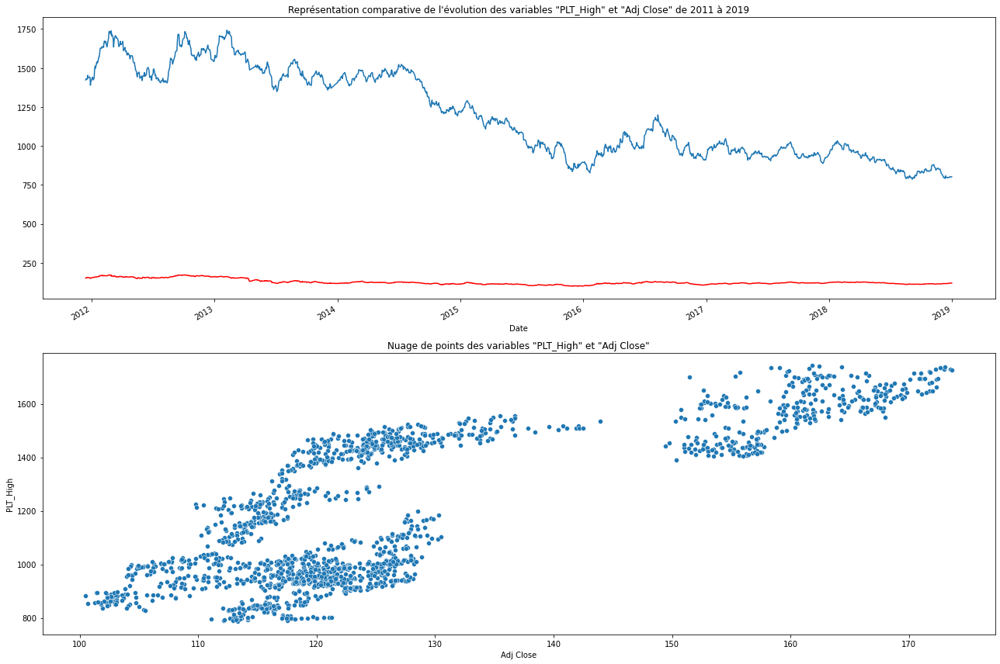

VISUALISATION DE LA RELATION: PLT_Low / Adj Closed


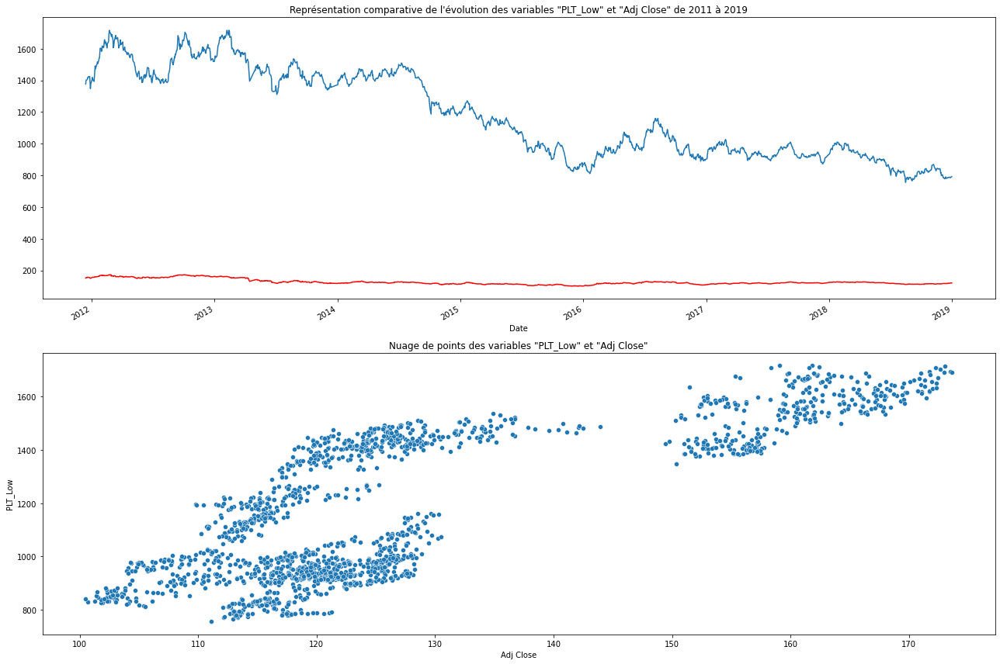

VISUALISATION DE LA RELATION: PLD_Price / Adj Closed


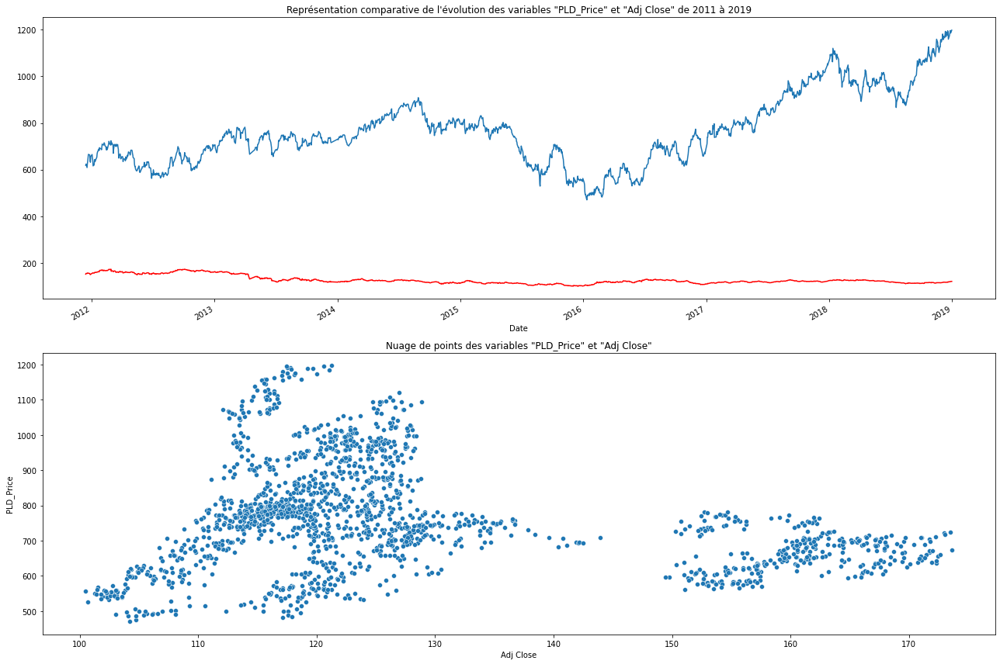

VISUALISATION DE LA RELATION: PLD_Open / Adj Closed


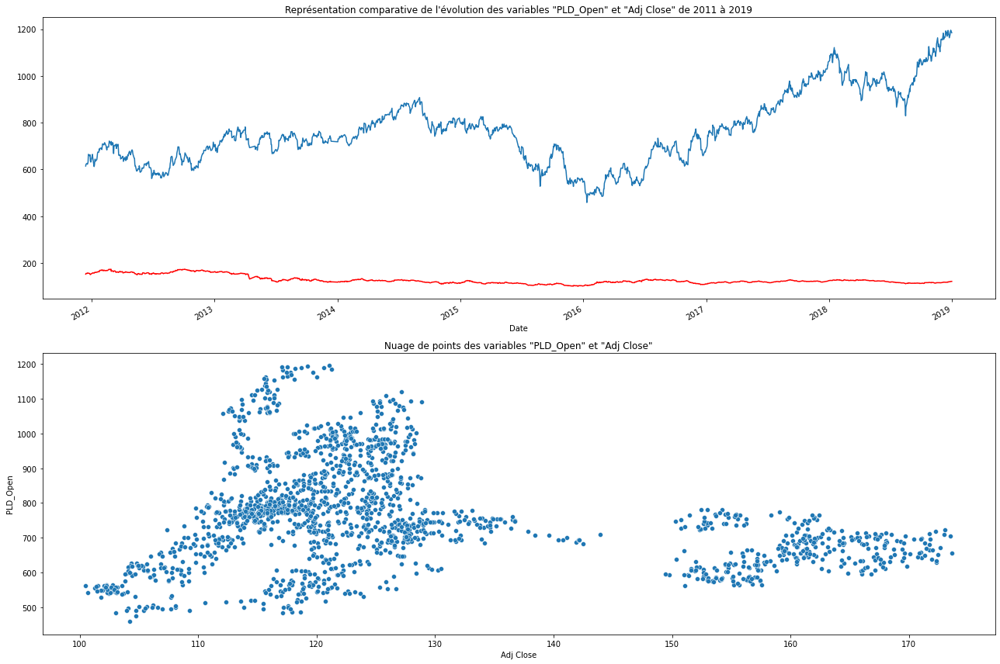

VISUALISATION DE LA RELATION: PLD_High / Adj Closed


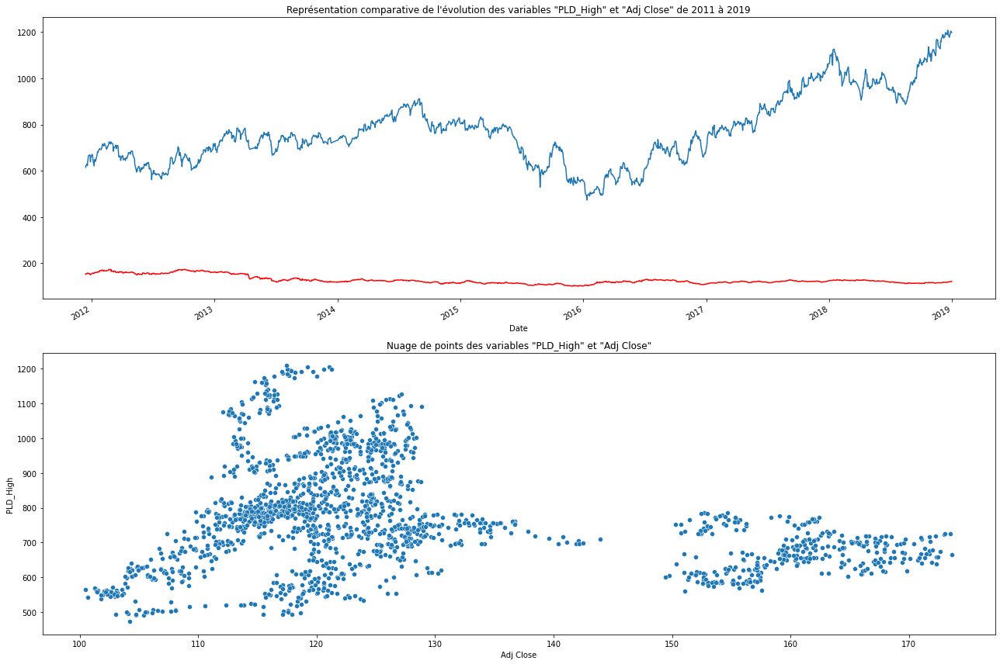

VISUALISATION DE LA RELATION: PLD_Low / Adj Closed


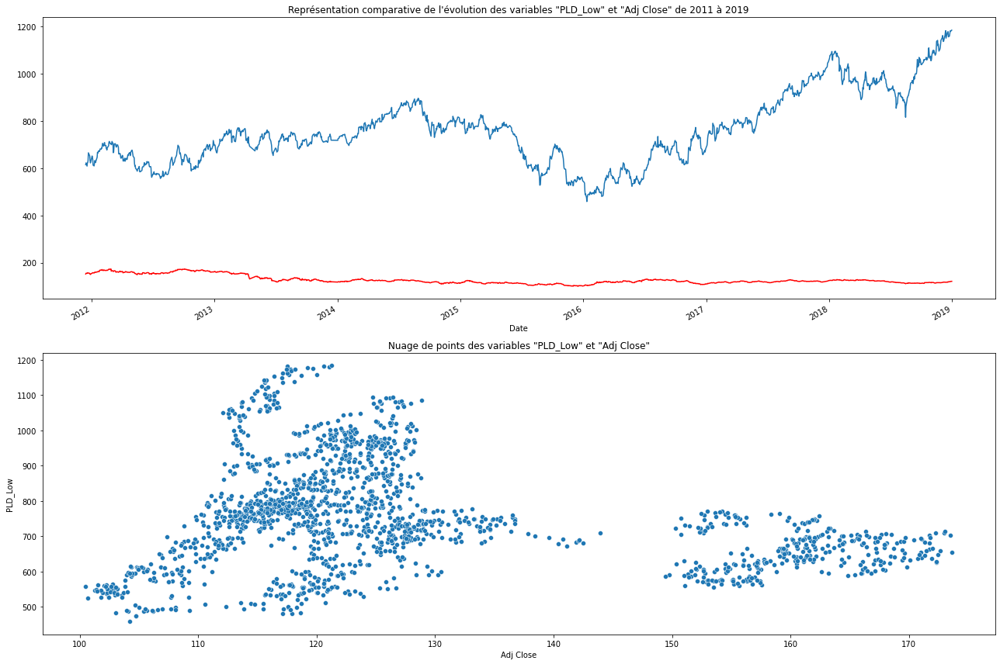

VISUALISATION DE LA RELATION: RHO_PRICE / Adj Closed


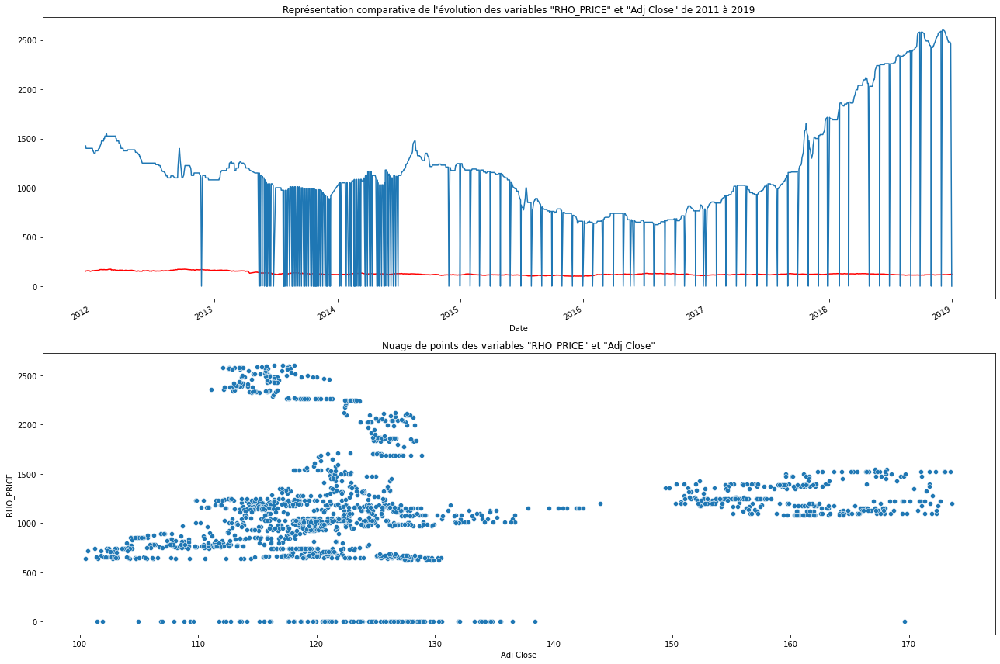

VISUALISATION DE LA RELATION: USDI_Price / Adj Closed


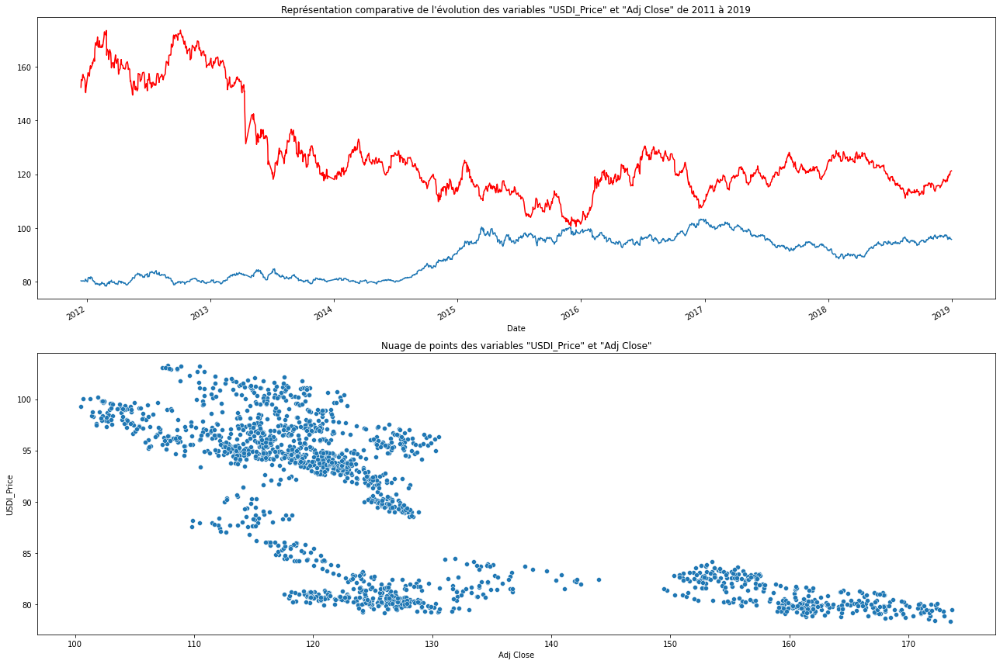

VISUALISATION DE LA RELATION: USDI_Open / Adj Closed


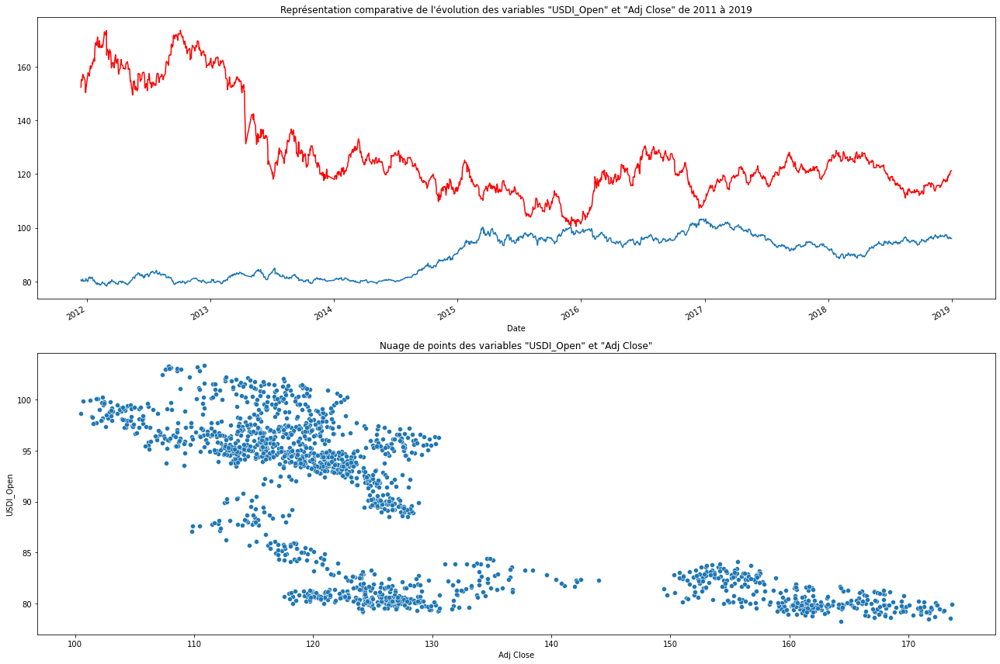

VISUALISATION DE LA RELATION: USDI_High / Adj Closed


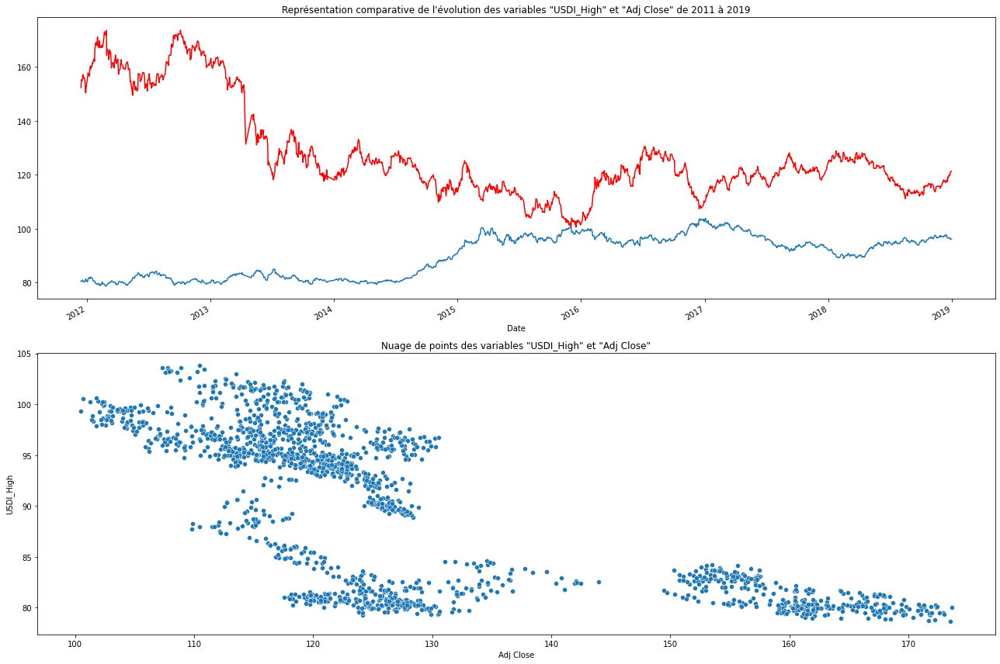

VISUALISATION DE LA RELATION: USDI_Low / Adj Closed


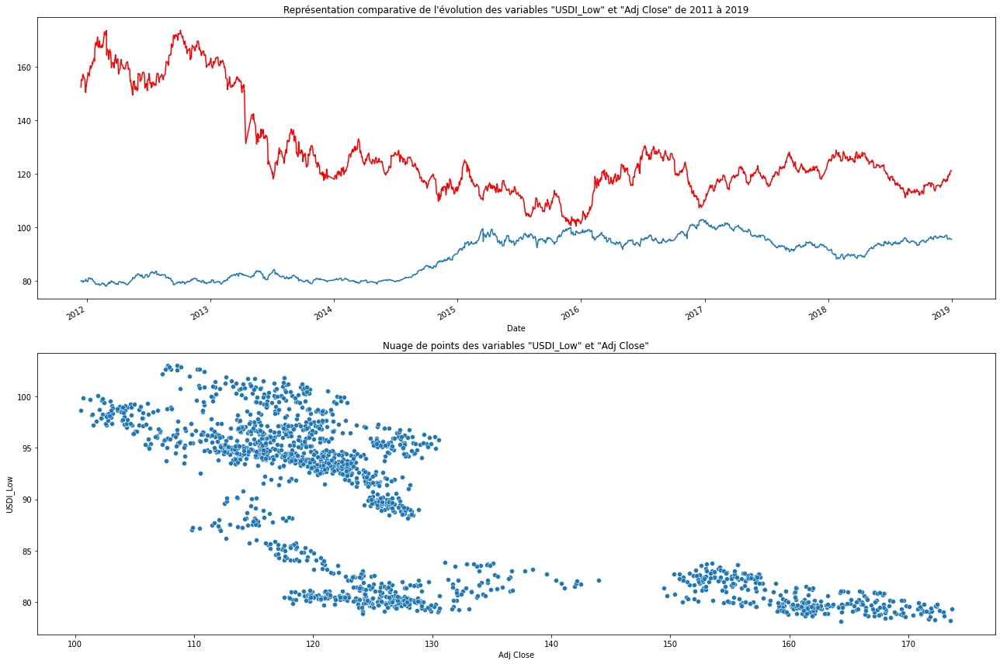

VISUALISATION DE LA RELATION: USDI_Volume / Adj Closed


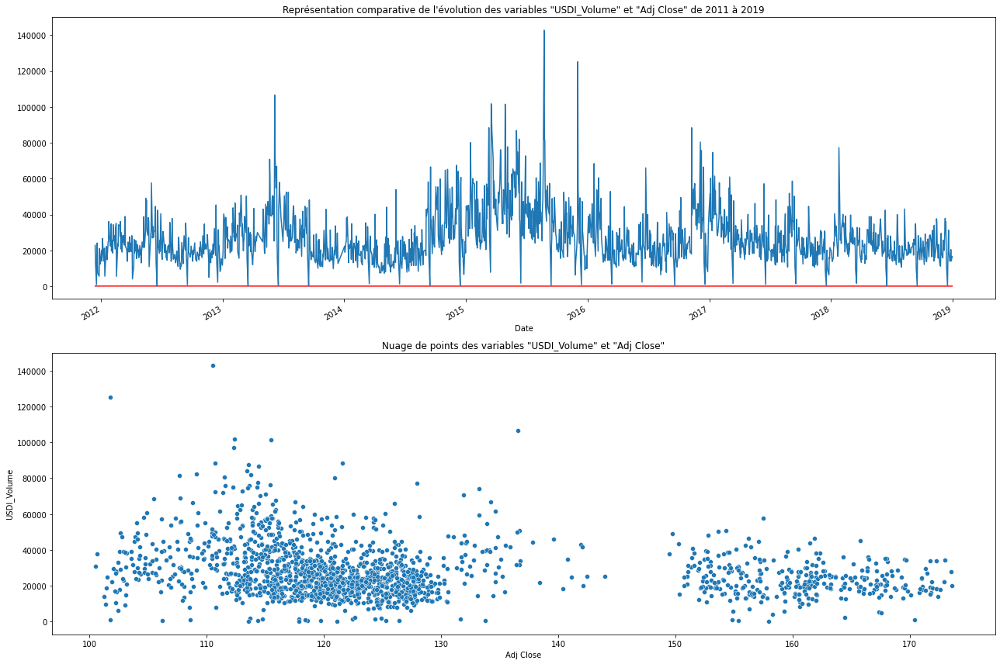

VISUALISATION DE LA RELATION: GDX_Open / Adj Closed


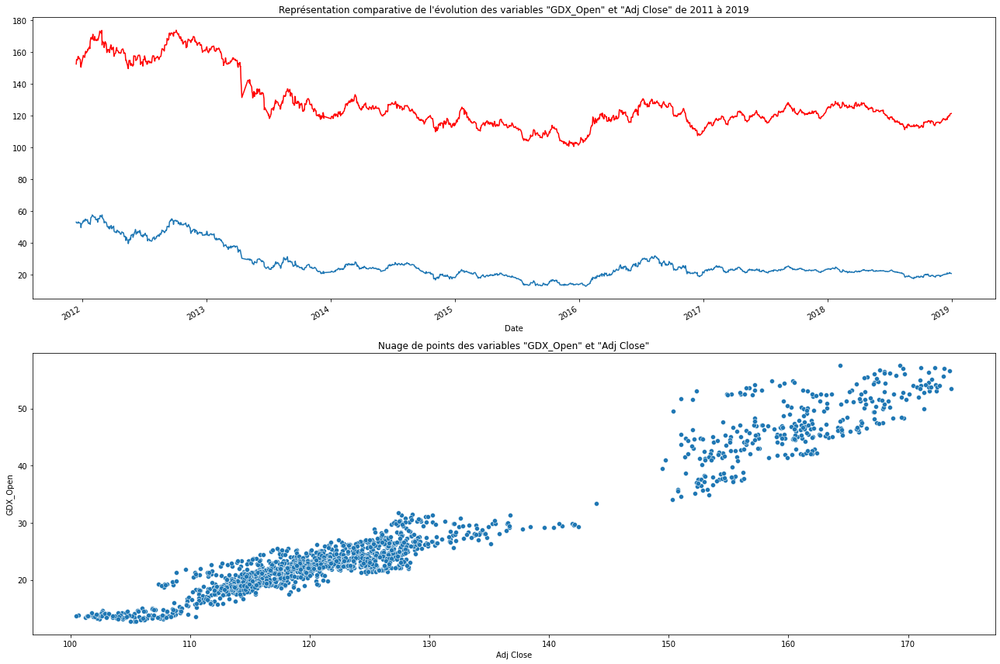

VISUALISATION DE LA RELATION: GDX_High / Adj Closed


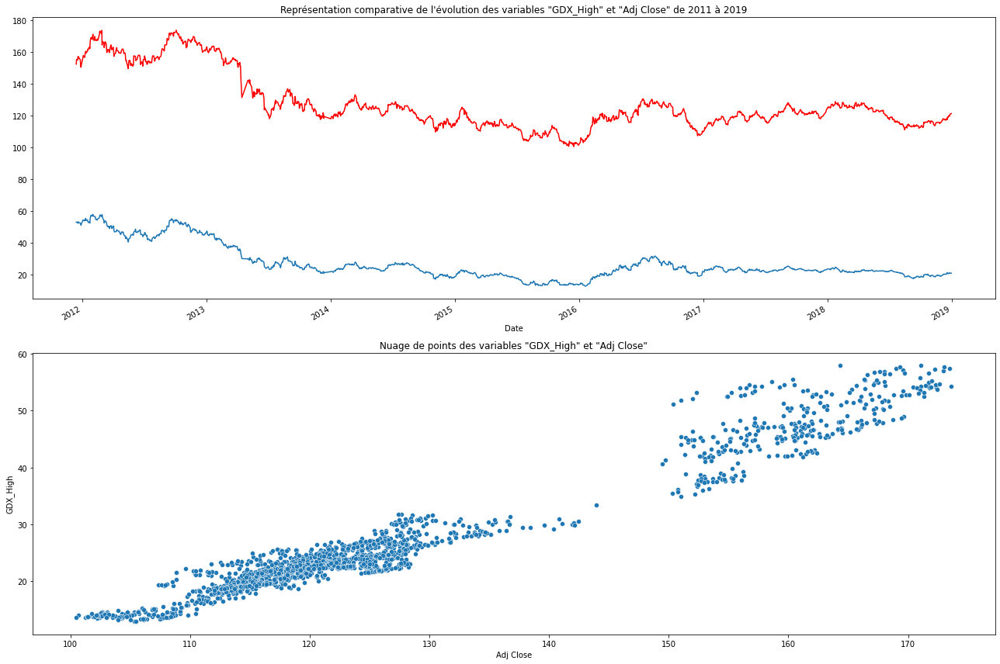

VISUALISATION DE LA RELATION: GDX_Low / Adj Closed


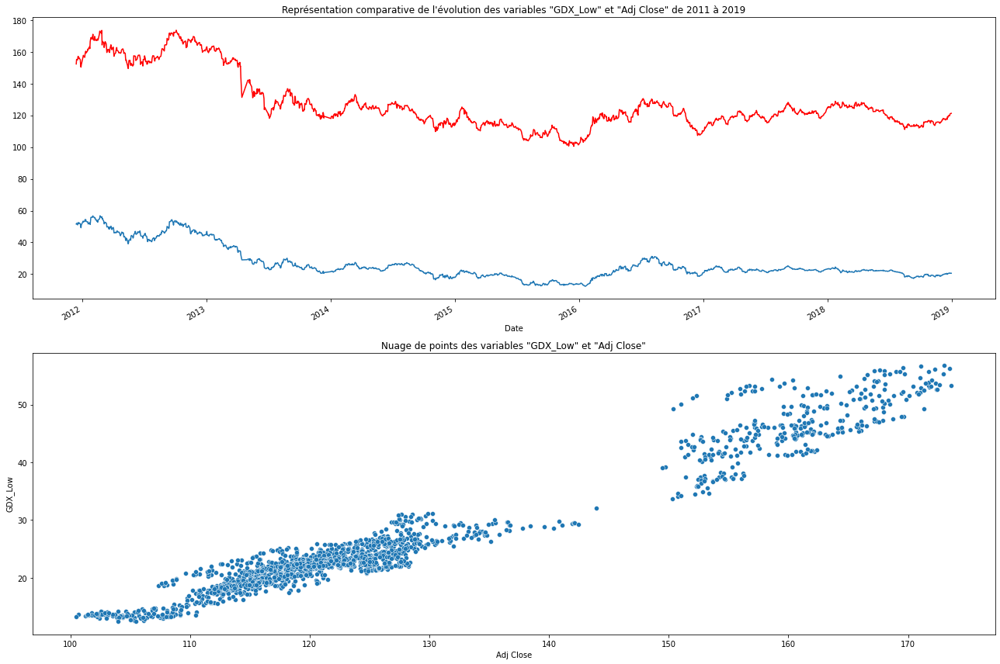

VISUALISATION DE LA RELATION: GDX_Close / Adj Closed


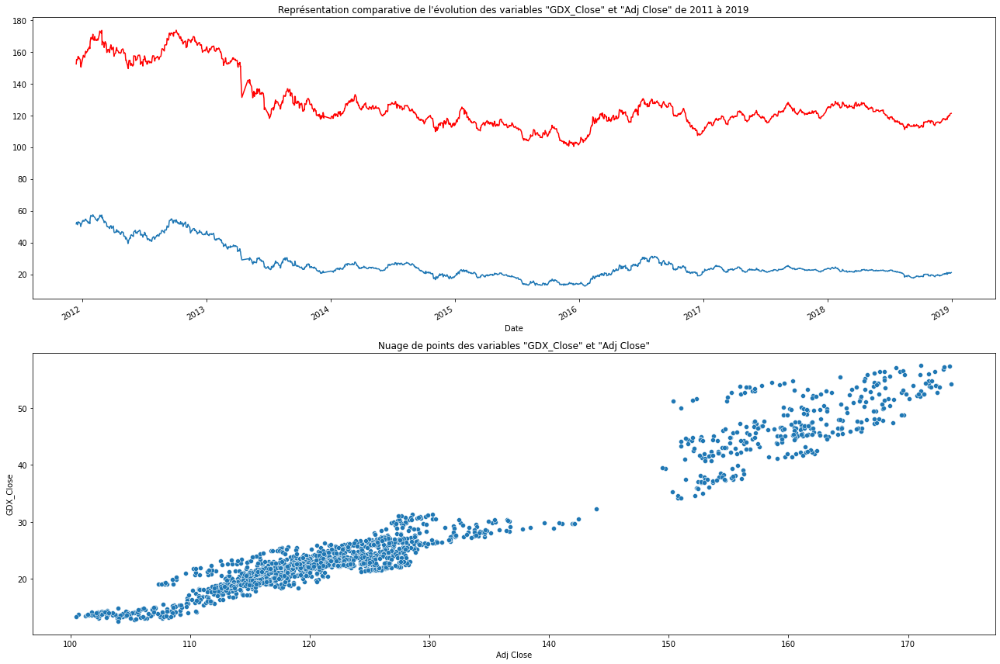

VISUALISATION DE LA RELATION: GDX_Adj Close / Adj Closed


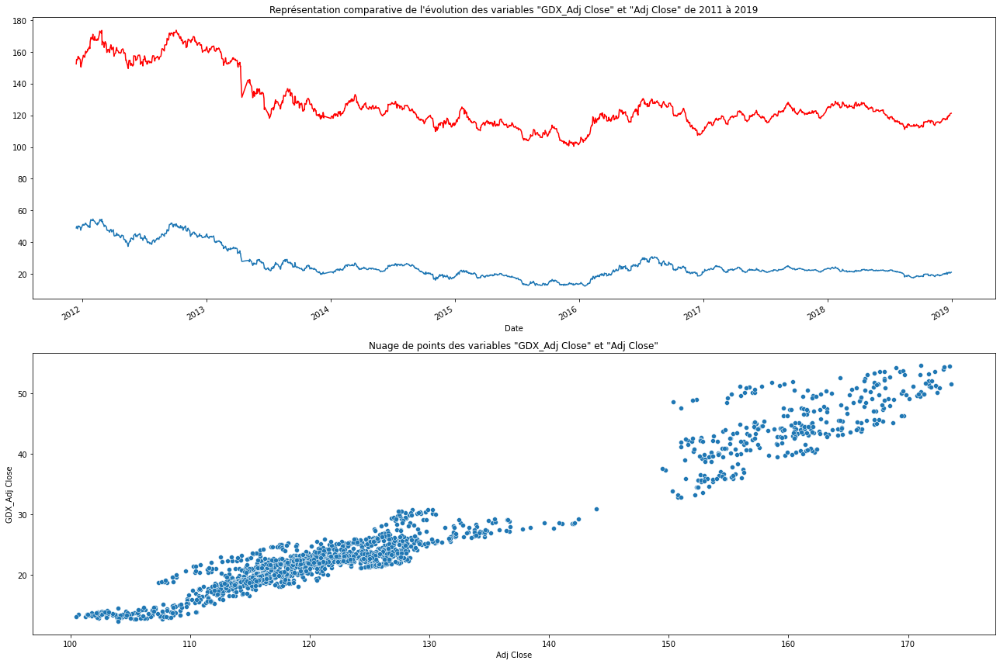

VISUALISATION DE LA RELATION: GDX_Volume / Adj Closed


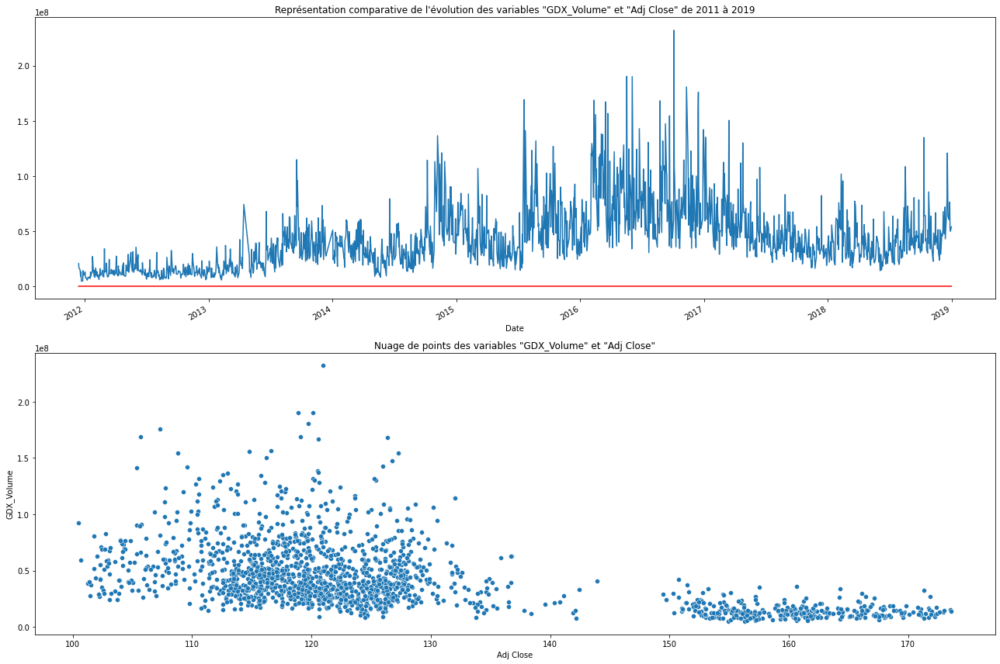

VISUALISATION DE LA RELATION: USO_Open / Adj Closed


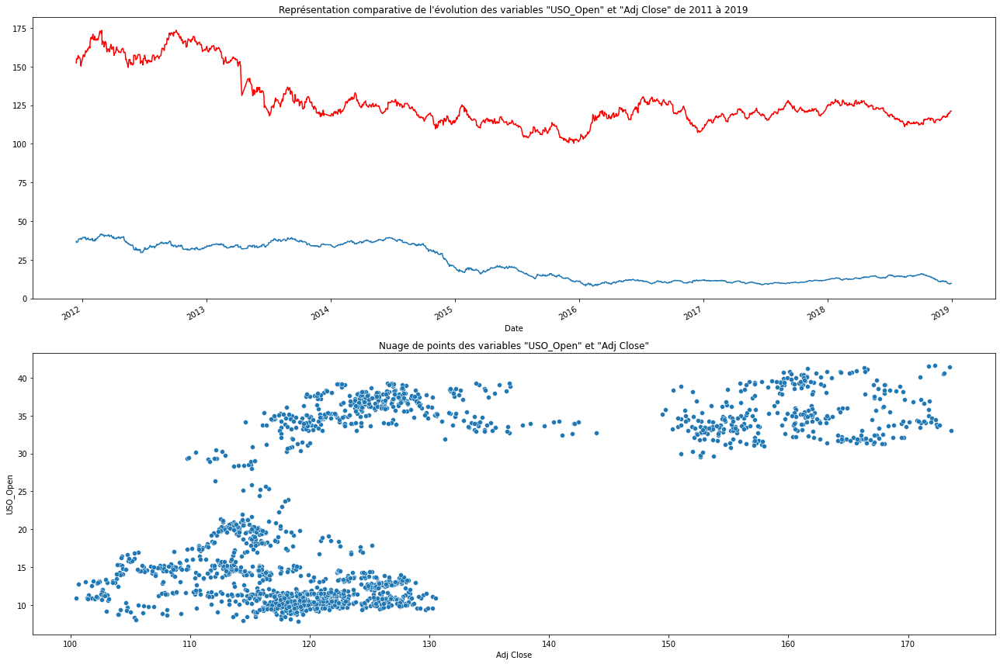

VISUALISATION DE LA RELATION: USO_High / Adj Closed


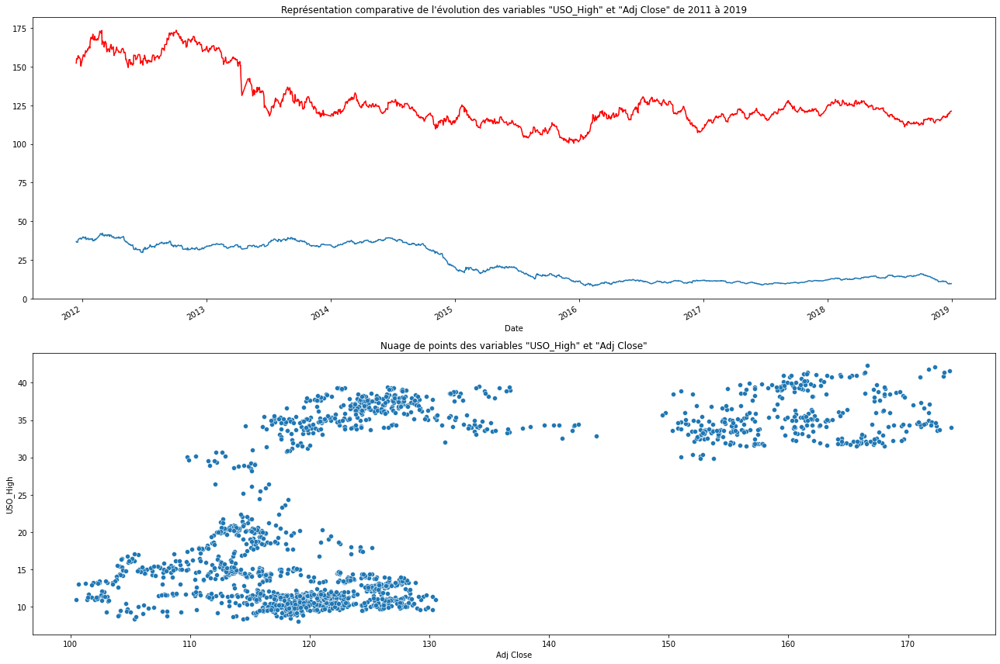

VISUALISATION DE LA RELATION: USO_Low / Adj Closed


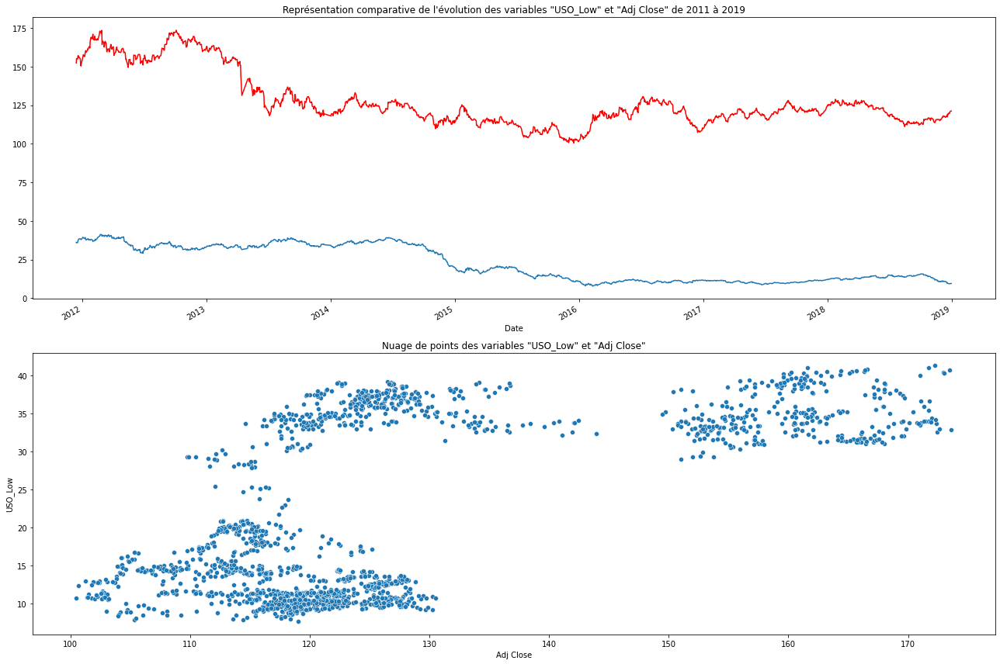

VISUALISATION DE LA RELATION: USO_Close / Adj Closed


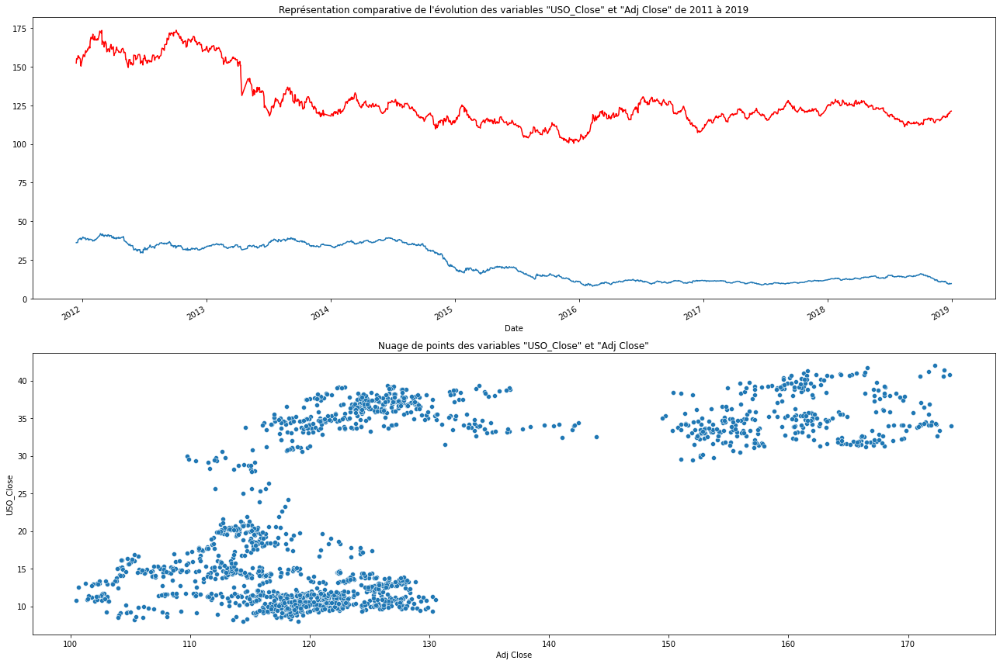

VISUALISATION DE LA RELATION: USO_Adj Close / Adj Closed


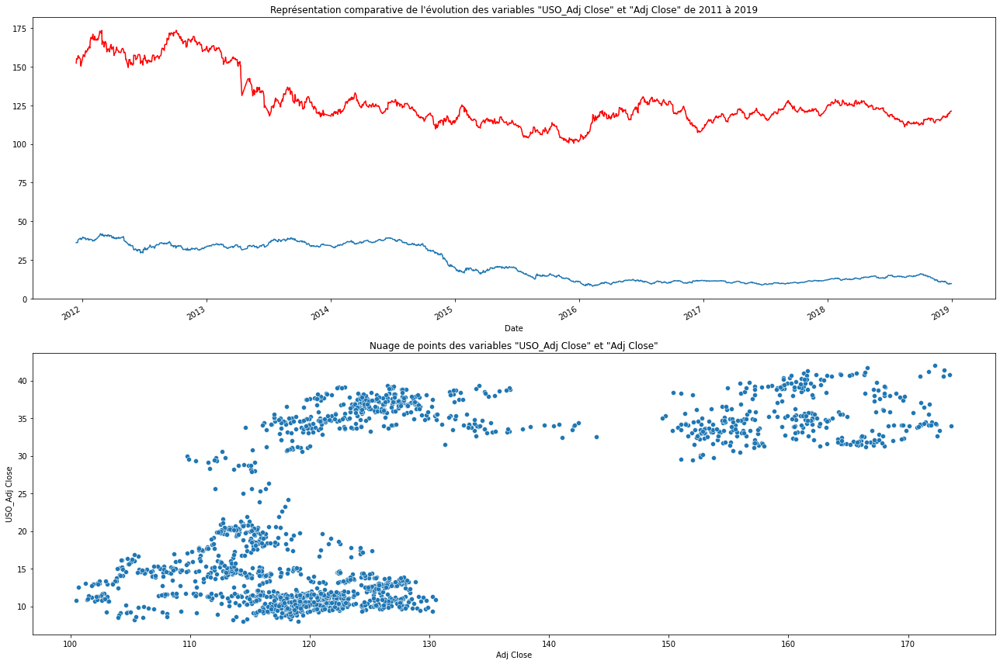

VISUALISATION DE LA RELATION: USO_Volume / Adj Closed


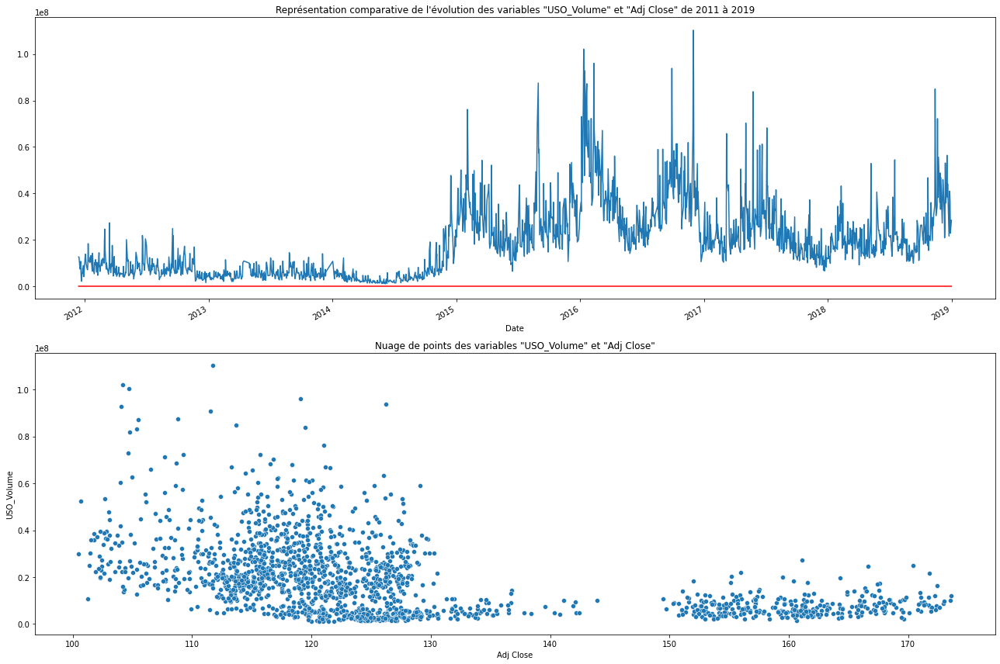

In [47]:
for i in features_list_quanti: 
    print("="*120)
    print(f'VISUALISATION DE LA RELATION: {i} / Adj Closed')
    
    #courbes d'une feature et de la target
    plt.subplot(211)
    plt.title(f'Représentation comparative de l\'évolution des variables "{i}" et "Adj Close" de 2011 à 2019')
    df["Adj Close"].plot(figsize = (18,12), color = 'red')
    df[i].plot()
    
    #Nuage de points d'une feature et de la target
    plt.subplot(212)
    plt.title(f'Nuage de points des variables "{i}" et "Adj Close"')
    sns.scatterplot(data = df, x = 'Adj Close', y = i)
    
    plt.tight_layout()
    plt.show()

In [87]:
#Tableau des coefficients de correlation de toutes les variables du dataset prises deux-à-deux
df_corr = df.corr()

#Affichage des cinq(5) premières lignes
df_corr.head()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume,EU_Price,EU_open,EU_high,EU_low,EU_Trend,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Open,1.000000,0.999515,0.999442,0.998976,0.998976,0.251921,-0.684314,-0.684597,-0.683464,-0.683998,-0.665788,0.242265,-0.588615,-0.588534,-0.587941,-0.588179,-0.588179,-0.155915,0.863226,0.861273,0.863740,0.862066,0.859143,-0.127269,0.580586,0.579304,0.582948,0.577043,0.010250,0.710348,0.708938,0.711079,0.708038,-0.225405,0.045286,0.630270,0.629795,0.631616,0.628710,0.056485,0.946923,0.946454,0.945632,0.948152,0.708413,0.017132,-0.441423,-0.441780,-0.464759,-0.417975,-0.018419,0.775265,0.774171,0.775528,0.774047,-0.002555,-0.213162,-0.215840,-0.217142,-0.214507,0.018274,0.096399,-0.721133,-0.720350,-0.720013,-0.721968,-0.207064,-0.007063,0.975510,0.975143,0.975479,0.974596,0.974098,-0.514230,0.634872,0.634864,0.634277,0.635138,0.635138,-0.455920
High,0.999515,1.000000,0.999262,0.999535,0.999535,0.261064,-0.688118,-0.688365,-0.687325,-0.687817,-0.669657,0.247883,-0.592459,-0.592376,-0.591864,-0.592072,-0.592072,-0.157978,0.864864,0.863336,0.865556,0.864276,0.861358,-0.124106,0.581787,0.580143,0.584050,0.577891,0.015209,0.711245,0.709720,0.711967,0.708806,-0.225274,0.046764,0.631470,0.630847,0.632808,0.629749,0.058236,0.947434,0.946187,0.945888,0.947901,0.712873,0.023581,-0.443377,-0.443266,-0.466330,-0.419765,-0.021915,0.777601,0.775989,0.777677,0.775923,0.004889,-0.216981,-0.219974,-0.221115,-0.218568,0.022405,0.093272,-0.722573,-0.721454,-0.721134,-0.723371,-0.201262,-0.011713,0.975429,0.975722,0.975650,0.975341,0.974746,-0.508782,0.637101,0.637208,0.636538,0.637483,0.637483,-0.454913
Low,0.999442,0.999262,1.000000,0.999532,0.999532,0.237031,-0.680911,-0.681242,-0.679988,-0.680567,-0.662325,0.235838,-0.585021,-0.585009,-0.584304,-0.584592,-0.584592,-0.153442,0.861282,0.859493,0.862220,0.860614,0.857697,-0.129967,0.580633,0.578906,0.582613,0.576936,0.016249,0.710616,0.709057,0.711224,0.708290,-0.225901,0.047973,0.630436,0.629721,0.631587,0.628832,0.058875,0.947373,0.946032,0.945280,0.948437,0.701648,0.023881,-0.438559,-0.438496,-0.461766,-0.414710,-0.022045,0.774112,0.772421,0.773877,0.772672,0.005959,-0.208824,-0.211947,-0.213075,-0.210420,0.024138,0.098648,-0.720684,-0.719513,-0.719438,-0.721184,-0.212337,-0.013227,0.974725,0.974587,0.975337,0.974568,0.974182,-0.519988,0.633591,0.633623,0.633140,0.633994,0.633994,-0.457628
Close,0.998976,0.999535,0.999532,1.000000,1.000000,0.246778,-0.684618,-0.684904,-0.683750,-0.684284,-0.666071,0.241949,-0.588800,-0.588778,-0.588157,-0.588411,-0.588411,-0.155526,0.862900,0.861479,0.863917,0.862770,0.859850,-0.126586,0.581036,0.579036,0.582969,0.577000,0.019913,0.710693,0.709096,0.711334,0.708266,-0.225436,0.048205,0.630817,0.630046,0.632001,0.629083,0.059510,0.947420,0.945557,0.945203,0.947842,0.706505,0.028100,-0.441347,-0.440822,-0.464116,-0.417352,-0.025933,0.775861,0.773760,0.775481,0.773993,0.011355,-0.213179,-0.216426,-0.217490,-0.214919,0.026536,0.095782,-0.721569,-0.720140,-0.720023,-0.722078,-0.205954,-0.016641,0.974824,0.975255,0.975561,0.975459,0.974980,-0.514616,0.635197,0.635311,0.634732,0.635675,0.635675,-0.456193
Adj Close,0.998976,0.999535,0.999532,1.000000,1.000000,0.246778,-0.684618,-0.684904,-0.683750,-0.684284,-0.666071,0.241949,-0.588800,-0.588778,-0.588157,-0.588411,-0.588411,-0.155526,0.862900,0.861479,0.863917,0.862770,0.859850,-0.126586,0.581036,0.579036,0.582969,

##### Tableau de correlation entre les features et la varible cible  "Adj Close"

In [89]:
pd.set_option('display.max_rows', None) #pour afficher toutes les lignes
pd.DataFrame(df_corr['Adj Close'])

,Adj Close
Open,0.998976
High,0.999535
Low,0.999532
Close,1.000000
Adj Close,1.000000
Volume,0.246778
SP_open,-0.684618
SP_high,-0.684904
SP_low,-0.683750
SP_close,-0.684284


##### Affichage des corrélations avec des features avec la variable cible

<AxesSubplot:title={'center':'Correlation with Adj Close'}>

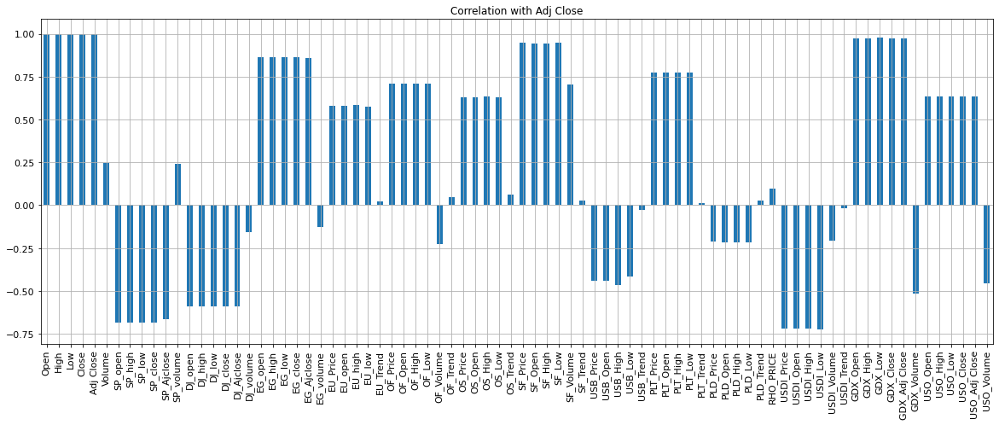

In [98]:
df.corrwith(df['Adj Close']).plot.bar(
        figsize = (20, 7), title = "Correlation with Adj Close", fontsize = 11,
        rot = 90, grid = True)

### h) Identification des outliers (valeurs aberrantes)

Pour visualiser s'il y a des valeurs aberrantes parmi les données du dataset, on utilisera les boîtes à moustaches de chaque variable quantitative continue. <br>
Ces valeurs seront visiblement des points situés après les extrémités de la boîte à moustache. <br>
Ensuite, on les déterminera après calcul.

##### Boîte à moustache de chaque variable

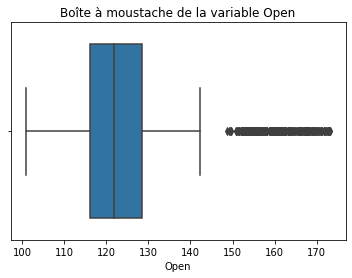

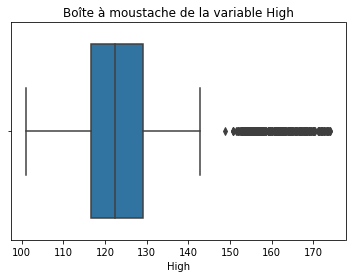

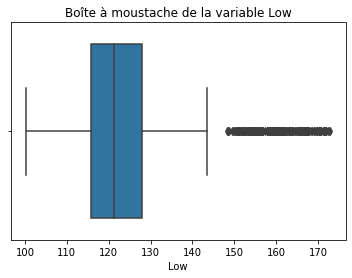

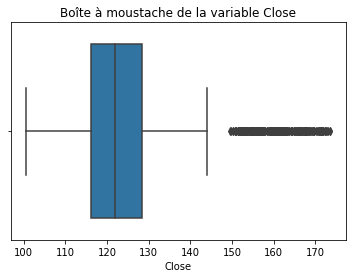

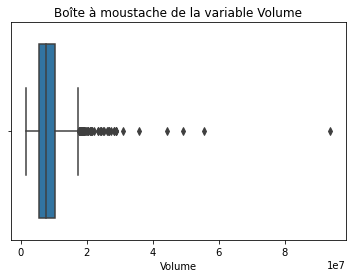

...

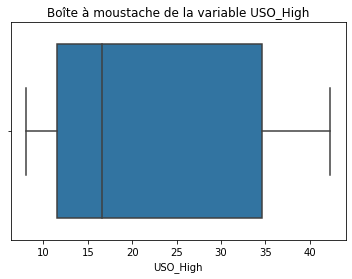

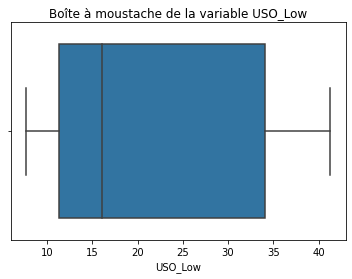

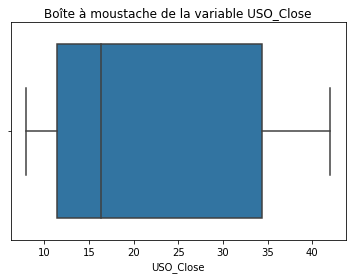

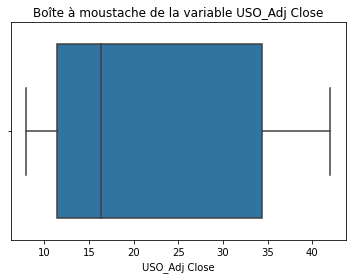

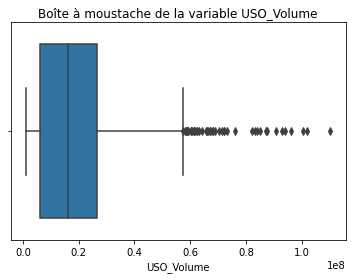

In [50]:
for i in features_list_quanti:    
    print("="*110)

    #Boîte à moustache d'une variable
    plt.title(f'Boîte à moustache de la variable {i}')
    sns.boxplot(data = df, x = i)
    plt.show()

##### Détermination des valeurs aberrantes (outliers) pour chaque variable

In [95]:
#Fonction d'extraction des outliers des variables d'un dataframe

def outliers_extraction(dataframe):
    for col in dataframe.columns:
        #On calcule Q1
        q1 = dataframe[col].quantile(0.25)
        q1
        #On calcule Q3
        q3 = dataframe[col].quantile(0.75)
        q3
        #On calcule l'écart interquartile (IQR)
        iqr = q3-q1
        iqr
        #On calcule la borne inférieure à l'aide du Q1 et de l'écart interquartile
        borne_inf = q1-1.5*iqr

        #On calcule la borne supérieure à l'aide du Q3 et de l'écart interquartile
        borne_sup = q3 +1.5*iqr

        outliers = []
        outliers_index = []
        
        for i in dataframe[col]:
            if (i > borne_sup) or (i < borne_inf):
                outliers.append(i) #ajout des outliers dans une liste
                outliers_index.append(dataframe[dataframe[col] == i].index.tolist()) #récupération dans des dates des outliers
        
        #aplatir la liste de listes (outliers_index)
        index = []
        for item in outliers_index:
            index += item 
        
        #Création d'un dataframe avec les outliers et leurs dates correspondantes
        df_outliers = pd.DataFrame((zip(index,outliers)), columns=['Date',col])
        
        #Affichage des résultats pour chaque variable
        print("="*110)
        if len(df_outliers) == 0 :
            print(f'La variable "{col}" possède {len(df_outliers)} valeurs aberrantes (outliers).')
            print(df_outliers)
        else :
            print(f'La variable "{col}" possède {len(df_outliers)} valeurs aberrantes (outliers).')
            print(f'Les valeurs aberrantes (outliers) pour la variable "{col}" sont: \n')
            print(df_outliers)

In [93]:
outliers_extraction(df)

La variable "Open" possède 326 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "Open" sont: 

          Date        Open
0   2011-12-15  154.740005
1   2011-12-16  154.309998
2   2011-12-19  155.479996
3   2011-12-20  156.820007
4   2011-12-21  156.979996
5   2011-12-22  156.350006
6   2011-12-23  156.350006
7   2011-12-22  155.080002
8   2011-12-23  154.050003
9   2011-12-27  149.089996
10  2011-12-28  152.139999
11  2011-12-29  154.759995
12  2011-12-30  155.429993
13  2012-01-03  155.369995
14  2012-01-04  158.589996
15  2012-01-05  157.360001
16  2012-01-06  158.970001
17  2012-01-09  159.339996
18  2012-01-10  161.020004
19  2012-01-11  159.320007
20  2012-01-12  161.169998
21  2012-01-13  159.940002
22  2012-01-17  160.960007
23  2012-01-18  160.500000
24  2012-01-19  162.320007
25  2012-01-20  161.809998
26  2012-01-23  161.070007
27  2012-01-24  167.440002
28  2012-01-25  168.190002
29  2012-01-27  169.770004
30  2012-01-30  169.750000
31  2012

La variable "High" possède 326 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "High" sont: 

          Date        High
0   2011-12-15  154.949997
1   2012-05-21  155.369995
2   2011-12-16  155.860001
3   2011-12-19  157.429993
4   2011-12-20  157.529999
5   2011-12-21  156.800003
6   2011-12-22  156.490005
7   2013-02-26  155.550003
8   2011-12-23  154.259995
9   2011-12-27  150.720001
10  2012-07-02  153.750000
11  2011-12-28  156.300003
12  2011-12-29  157.380005
13  2011-12-30  158.029999
14  2012-01-03  158.630005
15  2012-01-04  157.589996
16  2012-01-05  159.470001
17  2012-04-04  160.050003
18  2012-01-06  161.619995
19  2012-01-09  159.589996
20  2012-01-10  161.649994
21  2012-01-11  161.639999
22  2013-02-12  161.449997
23  2012-01-12  162.089996
24  2012-01-13  163.470001
25  2012-01-17  162.369995
26  2012-01-18  166.550003
27  2012-01-19  169.000000
28  2012-01-20  168.539993
29  2012-01-23  169.860001
30  2012-01-24  170.179993
31  2012

La variable "Low" possède 325 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "Low" sont: 

          Date         Low
0   2011-12-15  151.710007
1   2011-12-16  153.899994
2   2013-03-12  154.360001
3   2011-12-19  156.580002
4   2013-03-25  156.130005
5   2011-12-20  155.330002
6   2012-04-04  155.820007
7   2011-12-21  154.539993
8   2011-12-22  150.660004
9   2011-12-23  148.270004
10  2011-12-27  151.789993
11  2011-12-28  154.550003
12  2011-12-29  155.339996
13  2011-12-30  155.250000
14  2012-01-03  156.380005
15  2012-01-04  156.190002
16  2012-01-05  158.470001
17  2012-01-06  158.910004
18  2012-01-09  159.830002
19  2012-01-10  158.009995
20  2012-04-10  160.419998
21  2012-01-11  159.679993
22  2012-04-09  160.330002
23  2012-01-12  160.000000
24  2012-01-13  162.320007
25  2012-01-17  161.529999
26  2012-01-18  160.289993
27  2012-01-19  167.410004
28  2012-01-20  167.740005
29  2012-01-23  167.720001
30  2012-01-24  169.080002
31  2012-0

La variable "Close" possède 325 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "Close" sont: 

          Date       Close
0   2011-12-15  152.330002
1   2011-12-16  155.229996
2   2011-12-19  154.869995
3   2011-12-20  156.979996
4   2011-12-21  157.160004
5   2012-06-19  156.039993
6   2011-12-22  156.309998
7   2011-12-23  154.910004
8   2011-12-27  151.029999
9   2011-12-28  150.339996
10  2011-12-29  151.990005
11  2011-12-30  155.919998
12  2012-01-03  156.710007
13  2012-01-04  157.779999
14  2012-01-05  157.199997
15  2012-01-06  156.500000
16  2012-01-09  158.639999
17  2012-01-10  159.669998
18  2012-01-11  160.380005
19  2012-01-12  159.259995
20  2012-01-13  160.500000
21  2012-01-17  161.600006
22  2012-01-18  161.220001
23  2012-01-19  162.070007
24  2012-01-20  163.160004
25  2012-01-23  162.009995
26  2012-01-24  166.419998
27  2012-01-25  168.970001
28  2012-01-27  168.029999
29  2012-01-30  169.309998
30  2012-01-31  169.559998
31  20

La variable "Adj Close" possède 325 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "Adj Close" sont: 

          Date   Adj Close
0   2011-12-15  152.330002
1   2011-12-16  155.229996
2   2011-12-19  154.869995
3   2011-12-20  156.979996
4   2011-12-21  157.160004
5   2012-06-19  156.039993
6   2011-12-22  156.309998
7   2011-12-23  154.910004
8   2011-12-27  151.029999
9   2011-12-28  150.339996
10  2011-12-29  151.990005
11  2011-12-30  155.919998
12  2012-01-03  156.710007
13  2012-01-04  157.779999
14  2012-01-05  157.199997
15  2012-01-06  156.500000
16  2012-01-09  158.639999
17  2012-01-10  159.669998
18  2012-01-11  160.380005
19  2012-01-12  159.259995
20  2012-01-13  160.500000
21  2012-01-17  161.600006
22  2012-01-18  161.220001
23  2012-01-19  162.070007
24  2012-01-20  163.160004
25  2012-01-23  162.009995
26  2012-01-24  166.419998
27  2012-01-25  168.970001
28  2012-01-27  168.029999
29  2012-01-30  169.309998
30  2012-01-31  169.55999

La variable "DJ_high" possède 0 valeurs aberrantes (outliers).
Empty DataFrame
Columns: [Date, DJ_high]
Index: []
La variable "DJ_low" possède 0 valeurs aberrantes (outliers).
Empty DataFrame
Columns: [Date, DJ_low]
Index: []
La variable "DJ_close" possède 0 valeurs aberrantes (outliers).
Empty DataFrame
Columns: [Date, DJ_close]
Index: []
La variable "DJ_Ajclose" possède 0 valeurs aberrantes (outliers).
Empty DataFrame
Columns: [Date, DJ_Ajclose]
Index: []
La variable "DJ_volume" possède 25 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "DJ_volume" sont: 

         Date  DJ_volume
0  2014-10-06  655450000
1  2016-12-16  573470000
2  2017-03-17  535280000
3  2017-06-12  528080000
4  2017-06-16  603260000
5  2017-09-15  527540000
6  2017-11-14  561330000
7  2017-12-15  635740000
8  2018-01-16  606520000
9  2018-01-17  522720000
10 2018-01-19  585000000
11 2018-02-02  522880000
12 2018-10-11  714450000
13 2018-02-05  823940000
14 2018-02-06  657500000
1

La variable "EG_volume" possède 87 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "EG_volume" sont: 

         Date  EG_volume
0  2012-06-15    2662300
1  2012-09-21    2746100
2  2013-03-15    2878400
3  2013-04-03    2331500
4  2013-04-15    2529800
5  2013-09-18    2875900
6  2013-09-20    4471800
7  2014-03-21    2957800
8  2014-06-19    2489900
9  2014-10-08    2410300
10 2014-10-31    2344300
11 2014-11-05    2362800
12 2014-12-19    3064900
13 2015-01-15    2771200
14 2015-01-21    6016100
15 2015-01-23    2365300
16 2015-01-30    6627700
17 2015-02-02    3168800
18 2015-03-20    4067500
19 2015-09-18    2562000
20 2016-03-04    2999300
21 2016-03-18    3043500
22 2016-04-08    2365900
23 2016-05-09    2432300
24 2016-05-11    2564800
25 2016-06-17    6565300
26 2016-09-01    2600600
27 2016-09-16    2404300
28 2016-11-14    2733500
29 2016-12-15    2686500
30 2016-12-16    2513300
31 2017-05-15    2370600
32 2017-05-17    3130100
33 2017-05-18

La variable "SF_Low" possède 72 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "SF_Low" sont: 

         Date  SF_Low
0  2012-09-04   59700
1  2012-09-05   60199
2  2012-09-06   62027
3  2012-09-07   61398
4  2012-09-10   63759
5  2012-09-11   63638
6  2012-09-12   61912
7  2012-09-13   62273
8  2012-09-14   63801
9  2012-09-17   63605
10 2012-09-18   63323
11 2012-09-19   64132
12 2012-09-20   63711
13 2012-09-21   63111
14 2012-09-24   62034
15 2012-09-25   62112
16 2012-09-26   61830
17 2012-09-27   62250
18 2012-09-28   62626
19 2012-10-01   62203
20 2012-10-03   62252
21 2012-10-04   61891
22 2012-10-05   61651
23 2012-10-09   61120
24 2012-10-10   61562
25 2012-10-11   61731
26 2012-10-12   61061
27 2012-10-15   59858
28 2012-10-16   59761
29 2012-10-17   60060
30 2012-10-18   60050
31 2012-10-19   59623
32 2012-10-22   59325
33 2012-10-23   58841
34 2012-10-24   58860
35 2012-10-25   59151
36 2012-10-26   58951
37 2012-10-31   59455
38 2012-11-

La variable "PLD_High" possède 29 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "PLD_High" sont: 

         Date  PLD_High
0  2018-10-23   1136.90
1  2018-11-15   1161.40
2  2018-11-16   1168.30
3  2018-11-19   1167.10
4  2018-11-20   1152.70
5  2018-11-21   1139.60
6  2018-11-23   1136.50
7  2018-11-28   1161.10
8  2018-11-29   1157.70
9  2018-11-30   1173.00
10 2018-12-03   1178.70
11 2018-12-04   1189.30
12 2018-12-06   1187.80
13 2018-12-07   1174.00
14 2018-12-10   1180.00
15 2018-12-11   1184.80
16 2018-12-12   1195.00
17 2018-12-13   1198.55
18 2018-12-14   1192.05
19 2018-12-17   1194.20
20 2018-12-18   1189.20
21 2018-12-19   1208.70
22 2018-12-20   1204.10
23 2018-12-21   1190.40
24 2018-12-24   1177.60
25 2018-12-26   1191.00
26 2018-12-27   1198.40
27 2018-12-28   1204.80
28 2018-12-31   1198.80
La variable "PLD_Low" possède 26 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "PLD_Low" sont: 

         Dat

La variable "GDX_Open" possède 302 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "GDX_Open" sont: 

          Date   GDX_Open
0   2011-12-15  53.009998
1   2011-12-16  52.500000
2   2011-12-19  52.490002
3   2011-12-20  52.380001
4   2011-12-21  53.150002
5   2011-12-22  52.560001
6   2012-10-18  52.590000
7   2011-12-23  52.369999
8   2012-10-12  51.770000
9   2011-12-27  49.520000
10  2011-12-28  51.619999
11  2011-12-29  52.790001
12  2011-12-30  53.610001
13  2012-10-22  53.259998
14  2012-01-03  54.130001
15  2012-01-04  53.549999
16  2012-01-05  54.799999
17  2012-01-06  54.459999
18  2012-09-20  54.840000
19  2012-01-09  54.040001
20  2012-01-10  54.540001
21  2012-01-11  53.070000
22  2012-01-12  53.169998
23  2012-01-13  52.070000
24  2012-01-17  52.419998
25  2012-02-10  52.509998
26  2012-01-18  51.580002
27  2012-01-19  55.799999
28  2012-01-20  56.400002
29  2012-01-23  57.520000
30  2012-01-24  57.040001
31  2012-01-25  57.090000
32  20

La variable "GDX_Low" possède 313 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "GDX_Low" sont: 

          Date    GDX_Low
0   2011-12-15  51.570000
1   2011-12-16  52.040001
2   2011-12-19  51.029999
3   2011-12-20  52.369999
4   2011-12-21  52.419998
5   2012-01-23  51.770000
6   2011-12-22  52.349998
7   2011-12-23  51.680000
8   2011-12-27  50.009998
9   2011-12-28  49.220001
10  2011-12-29  51.090000
11  2011-12-30  52.759998
12  2012-01-03  53.340000
13  2012-01-05  52.759998
14  2012-01-04  53.220001
15  2012-01-03  53.180000
16  2012-01-05  54.389999
17  2012-01-06  53.669998
18  2012-03-05  54.310001
19  2012-01-09  53.230000
20  2012-01-10  52.860001
21  2012-01-11  52.950001
22  2012-09-20  51.580002
23  2012-01-12  51.750000
24  2012-09-21  52.419998
25  2012-01-13  51.709999
26  2012-01-17  51.270000
27  2012-01-18  55.720001
28  2012-01-19  55.799999
29  2012-01-20  55.750000
30  2011-12-21  56.369999
31  2012-01-23  56.689999
32  2012

La variable "GDX_Close" possède 306 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "GDX_Close" sont: 

          Date  GDX_Close
0   2011-12-15  51.680000
1   2011-12-16  52.680000
2   2011-12-19  51.169998
3   2011-12-20  52.990002
4   2011-12-21  52.959999
5   2012-09-24  52.400002
6   2011-12-22  52.790001
7   2012-09-26  51.869999
8   2011-12-23  50.060001
9   2011-12-27  51.200001
10  2011-12-28  51.430000
11  2012-10-24  53.799999
12  2011-12-29  53.740002
13  2011-12-30  53.900002
14  2012-01-03  53.349998
15  2012-01-04  53.650002
16  2012-01-05  54.470001
17  2012-01-06  54.310001
18  2012-01-09  54.720001
19  2012-10-05  54.049999
20  2012-01-10  53.180000
21  2012-01-11  53.240002
22  2012-01-12  52.150002
23  2012-01-13  52.180000
24  2012-01-17  53.009998
25  2012-01-18  51.820000
26  2012-03-09  55.230000
27  2012-01-19  57.139999
28  2012-01-20  56.459999
29  2012-01-23  56.459999
30  2012-01-24  56.560001
31  2012-01-25  57.470001
32  

La variable "GDX_Adj Close" possède 306 valeurs aberrantes (outliers).
Les valeurs aberrantes (outliers) pour la variable "GDX_Adj Close" sont: 

          Date  GDX_Adj Close
0   2011-12-15      48.973877
1   2011-12-16      49.921513
2   2011-12-19      48.490578
3   2011-12-20      50.215282
4   2011-12-21      50.186852
5   2011-12-22      49.656178
6   2011-12-23      50.169365
7   2011-12-27      49.295036
8   2011-12-28      47.574883
9   2012-10-24      48.658298
10  2011-12-29      48.876881
11  2011-12-30      51.129227
12  2012-01-03      51.072212
13  2012-01-04      51.224262
14  2012-01-05      50.701565
15  2012-01-06      50.986671
16  2012-01-09      51.765972
17  2012-10-05      51.613911
18  2012-01-10      52.003555
19  2012-01-11      51.366817
20  2012-01-12      50.540005
21  2012-01-13      50.597027
22  2012-01-17      49.561138
23  2012-01-18      49.589649
24  2012-03-09      50.378445
25  2012-01-19      49.247520
26  2012-01-20      52.488239
27  2012-01-23